# Game Design Studio:
## Visualizing the Optimal Game Mechanics for Various Game Categories

#### Sarah Kovan and Grace Thompson

In [1]:
import numpy as np
import pandas as pd
import plotly_express as px
import  matplotlib.pyplot as plt
from numpy.polynomial.polynomial import polyfit
import statsmodels.api as sm
import hypertools as hyp
import seaborn as sns
from mpl_toolkits.mplot3d import Axes3D
import plotly.graph_objs as go
import plotly as py
from io import StringIO



#imported the necessary libraries
%matplotlib inline

/optnfs/el7/jupyterhub/envs/Psych81.09/lib/python3.6/site-packages/hypertools/plot/__init__.py:10: UserWarning:

Could not switch backend to TkAgg.  This may impact performance of the plotting functions.

/optnfs/el7/jupyterhub/envs/Psych81.09/lib/python3.6/site-packages/sklearn/externals/joblib/__init__.py:15: DeprecationWarning:

sklearn.externals.joblib is deprecated in 0.21 and will be removed in 0.23. Please import this functionality directly from joblib, which can be installed with: pip install joblib. If this warning is raised when loading pickled models, you may need to re-serialize those models with scikit-learn 0.21+.



# Introduction

Research shows that games can be used for good. In fact, the Tiltfactor lab here at Dartmouth designs games that confront biases, prevent diseases, and encourage prosociality. This notebook is meant to guide game designers by showing what categories of games tend to be highly rated and what game mechanics work best with those categories of games. We hope that, using our visualizations, game designers will create successful games that serve the greater good.

# Data

We downloaded a dataset from https://www.kaggle.com/mrpantherson/board-game-data. The dataset uses information from boardgamegeek.com, and therefore includes a "geek rating for each game." According to boardgamegeek.com, geek ratings differ from average ratings in that "To prevent games with relatively few votes climbing to the top of the BGG Ranks, artificial "dummy" votes are added to the User Ratings. These votes are currently thought to be 100 votes equal to the mid range of the voting scale: 5.5, but the actual algorithm is kept secret to avoid manipulation. The effect of adding these dummy votes is to pull BGG Ratings toward the mid range. Games with a large number of votes will see their BGG Rating alter very little from their Average Rating, but games with relatively few user ratings will see their BGG Rating move considerably toward 5.5."

In [2]:
pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', None)
df = pd.read_csv('boardgamedata.csv', header=0,encoding = 'unicode_escape')
df.set_index('Game')
df.head()         
#downloaded from https://www.kaggle.com/mrpantherson/board-game-data

,rank,Game,min_players,max_players,avg_time,min_time,max_time,year,avg_rating,geek_rating,num_votes,age,mechanic,Area Control,Dice Rolling,Variable Player Powers,Partnerships,Set Collection,Hand Management,Deck,Tile Placement,Simulation,Storytelling,Memory,Player Elimination,Role Playing,Press Your Luck,owned,category,Environmental,Medical,Card Game,Civilization,Economic,Fantasy,Puzzle,TV/Movie/Radio,War,Horror,Murder/Mystery,Party Game,Trivia,Racing,Territory Building,Adventure,Dice
0,1,Pandemic Legacy: Season 1,2,4,60,60,60,2015,8.66905,8.48904,18009,13,"Action Point Allowance System, Co-operative Pl...",0,0,1,0,1,1,0,0,0,0,0,0,0,0,29472,"Environmental, Medical",1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
1,2,Through the Ages: A New Story of Civilization,2,4,240,180,240,2015,8.72977,8.30744,7309,14,"Action Point Allowance System, Auction/Bidding...",0,0,0,0,0,1,0,0,0,0,0,0,0,0,10007,"Card Game, Civilization, Economic",0,0,1,1,1,0,0,0,0,0,0,0,0,0,0,0,0
2,3,Twilight Struggle,2,2,180,180,180,2005,8.35745,8.22021,27403,13,"Area Control / Area Influence, Campaign / Batt...",1,1,0,0,0,1,0,0,0,0,0,0,0,0,37382,"Modern Warfare, Political, Wargame",0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0
3,4,Terra Mystica,2,5,150,60,150,2012,8.29627,8.15458,24267,12,"Route/Network Building, Variable Phase Order, ...",0,0,1,0,0,0,0,0,0,0,0,0,0,0,27948,"Civilization, Economic, Fantasy, Territory Bui...",0,0,0,1,1,1,0,0,0,0,0,0,0,0,1,0,0
4,5,Gloomhaven,1,4,150,90,150,2017,9.08970,8.15151,3978,12,"Action / Movement Programming, Campaign / Batt...",0,0,1,0,0,1,0,0,0,1,0,0,0,0,6057,"Adventure, Economic, Exploration, Fantasy, Fig...",0,0,0,0,1,1,0,0,0,0,0,0,0,0,0,1,0


In [3]:
names={'rank' : 'Rank',
      'min_players': 'Min Players',
     'max_players': 'Max Players',
     'avg_time' : 'Avg Time',
     'year' : 'Year',
      'avg_rating': 'Avg Rating',
     'geek_rating' : 'Geek Rating',
     'age' : 'Age',
     'mechanic' : 'Mechanic',
     'num_votes' : 'Num Votes',
      'min_time' : 'Min Time',
      'max_time' : 'Max Time'}
df.rename(names, inplace=True, axis=1)

In [4]:
df.set_index('Game')
df.head()

,Rank,Game,Min Players,Max Players,Avg Time,Min Time,Max Time,Year,Avg Rating,Geek Rating,Num Votes,Age,Mechanic,Area Control,Dice Rolling,Variable Player Powers,Partnerships,Set Collection,Hand Management,Deck,Tile Placement,Simulation,Storytelling,Memory,Player Elimination,Role Playing,Press Your Luck,owned,category,Environmental,Medical,Card Game,Civilization,Economic,Fantasy,Puzzle,TV/Movie/Radio,War,Horror,Murder/Mystery,Party Game,Trivia,Racing,Territory Building,Adventure,Dice
0,1,Pandemic Legacy: Season 1,2,4,60,60,60,2015,8.66905,8.48904,18009,13,"Action Point Allowance System, Co-operative Pl...",0,0,1,0,1,1,0,0,0,0,0,0,0,0,29472,"Environmental, Medical",1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
1,2,Through the Ages: A New Story of Civilization,2,4,240,180,240,2015,8.72977,8.30744,7309,14,"Action Point Allowance System, Auction/Bidding...",0,0,0,0,0,1,0,0,0,0,0,0,0,0,10007,"Card Game, Civilization, Economic",0,0,1,1,1,0,0,0,0,0,0,0,0,0,0,0,0
2,3,Twilight Struggle,2,2,180,180,180,2005,8.35745,8.22021,27403,13,"Area Control / Area Influence, Campaign / Batt...",1,1,0,0,0,1,0,0,0,0,0,0,0,0,37382,"Modern Warfare, Political, Wargame",0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0
3,4,Terra Mystica,2,5,150,60,150,2012,8.29627,8.15458,24267,12,"Route/Network Building, Variable Phase Order, ...",0,0,1,0,0,0,0,0,0,0,0,0,0,0,27948,"Civilization, Economic, Fantasy, Territory Bui...",0,0,0,1,1,1,0,0,0,0,0,0,0,0,1,0,0
4,5,Gloomhaven,1,4,150,90,150,2017,9.08970,8.15151,3978,12,"Action / Movement Programming, Campaign / Batt...",0,0,1,0,0,1,0,0,0,1,0,0,0,0,6057,"Adventure, Economic, Exploration, Fantasy, Fig...",0,0,0,0,1,1,0,0,0,0,0,0,0,0,0,1,0


# All Games

## Number of Players

### Minimum

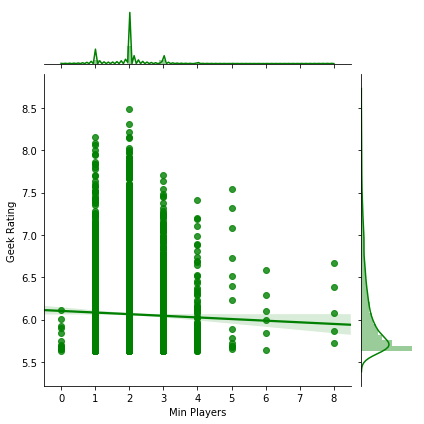

In [5]:
sns.jointplot("Min Players", "Geek Rating", data=df, kind="reg", color="g")

This jointplot reveals an insignificant negative correlation between the minimum numeber of players of a game and the game's "geek rating." However, although the correlation is not very informative, the plot does show that most games have a minimum of 1-3 players.

### Maximum

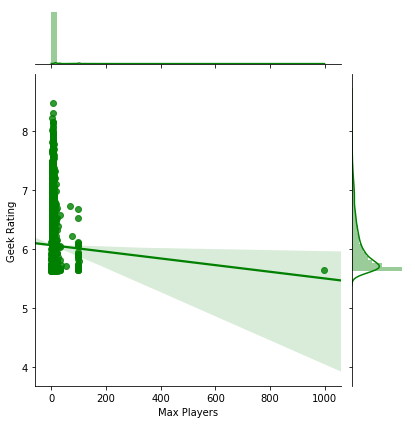

In [6]:
sns.jointplot("Max Players", "Geek Rating", data=df, kind="reg", color="g")
plt.show()

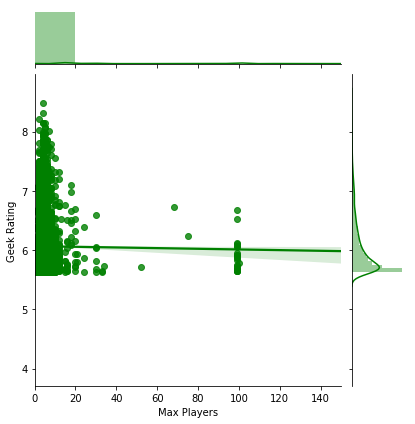

In [7]:
sns.jointplot("Max Players", "Geek Rating", data=df, kind="reg", color="g")
plt.xlim(0,150)
plt.show()

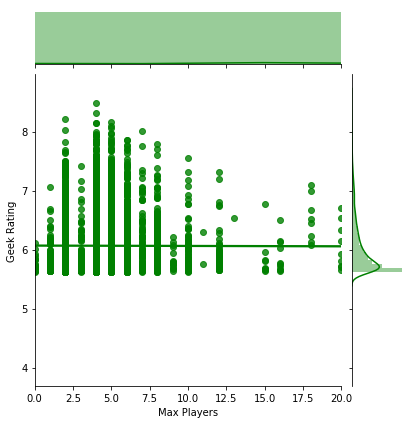

In [8]:
sns.jointplot("Max Players", "Geek Rating", data=df, kind="reg", color="g")
plt.xlim(0,20)
plt.show()

This plot shows that there is no correlation between the maximum number of players and geek rating.

## Game Length

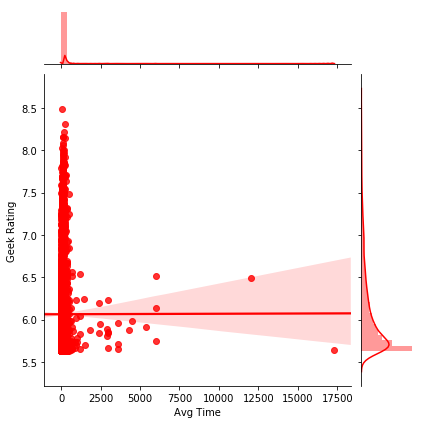

In [9]:
sns.jointplot("Avg Time", "Geek Rating", data=df, kind="reg", color="r")
plt.show()

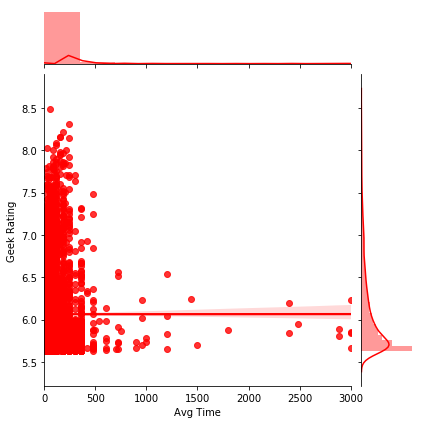

In [10]:
sns.jointplot("Avg Time", "Geek Rating", data=df, kind="reg", color="r")
plt.xlim(0,3000)
plt.show()

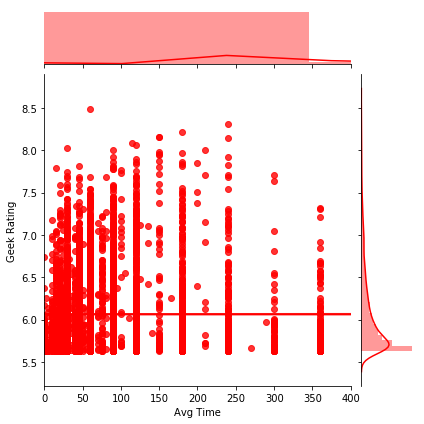

In [11]:
sns.jointplot("Avg Time", "Geek Rating", data=df, kind="reg", color="r")
plt.xlim(0,400)
plt.show()

The above jointplots indicate that, while the average game time does not predict geek rating, a majority of games can be played in an hour. 

## Player Age

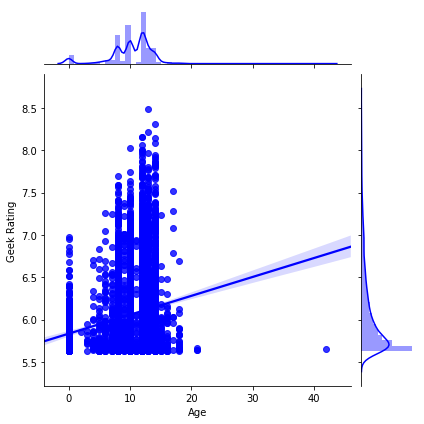

In [12]:
sns.jointplot("Age", "Geek Rating", data=df, kind="reg", color="b")
plt.show()

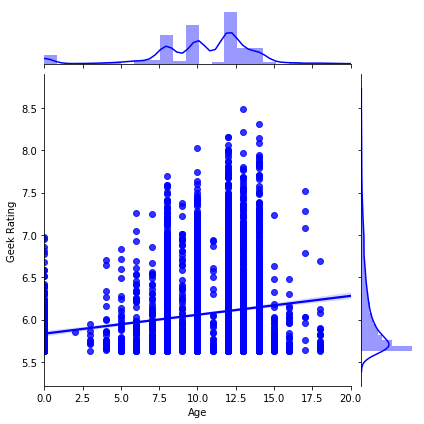

In [13]:
sns.jointplot("Age", "Geek Rating", data=df, kind="reg", color="b")
plt.xlim(0,20)
plt.show()

According to the jointplots above, most games are targeted for players under 20 years old. Further, the highest rated games tend to be those intended for 12-15 year-olds. 

## Release Year

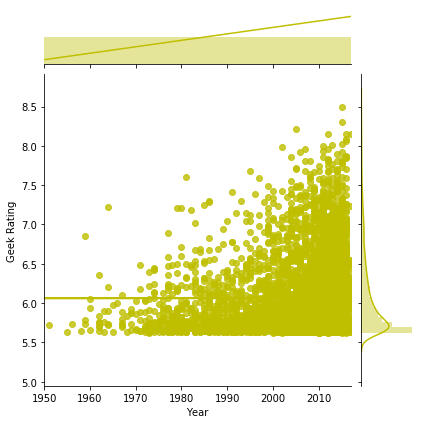

In [14]:
sns.jointplot("Year", "Geek Rating", data=df, kind="reg", color="y")
plt.xlim(1950,2017)
plt.show()

There appears to be a positive correlation between the release year of a game and its geek rating. In other words, games that were released more recently tend to have higher geek ratings. That being said, however, this finding may be skewed by the fact that there are more games in the dataset that were released in the last 10 years than in any other decade. 

## Heatmap

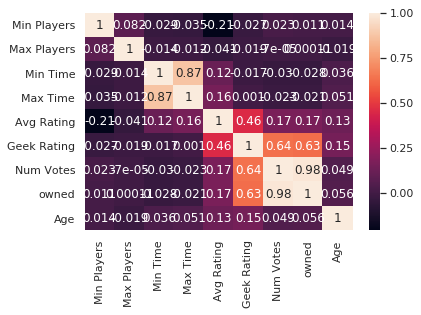

In [15]:
cols = ['Min Players', 'Max Players', 'Min Time', 'Max Time','Avg Rating',
       'Geek Rating', 'Num Votes','owned', 'Age' ]
cm = np.corrcoef(df[cols].values.T)
sns.set(font_scale=1)
hm = sns.heatmap(cm, cbar=True, annot=True, yticklabels=cols, xticklabels=cols)
plt.show()

The minimum and maximum play times are highly correlated which makes sense because the time variation shouldn’t be very large. There is also a high correlation between how many people own the game and the rating, which again makes sense because if a game is good, more people will own it.

# Distrubution of Geek Ratings

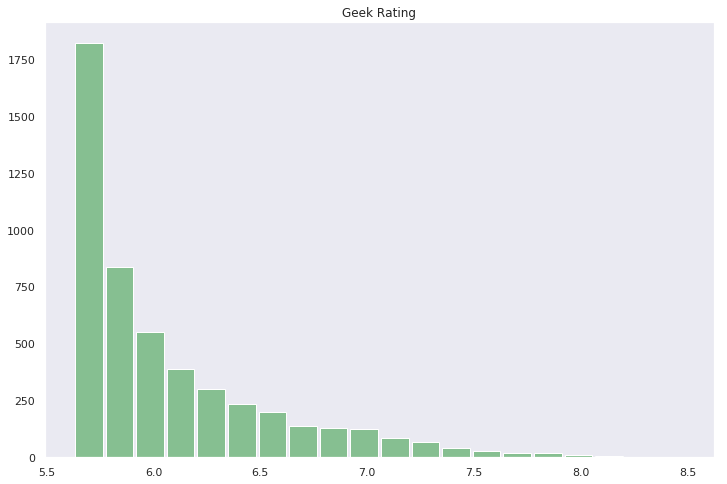

In [16]:
ax = df.hist(column='Geek Rating', bins=20, grid=False, figsize=(12,8), color='#86bf91', zorder=2, rwidth=0.9)
plt.show()

According to this histogram, over half of the games included in the dataset have geek ratings below 6. There are no ratings above 8.5, and ratings above 7 are relatively rare. This information can inform how we view the average geek ratings of games that fit into particular categories and employ particular game mechanics.

# Game Categories

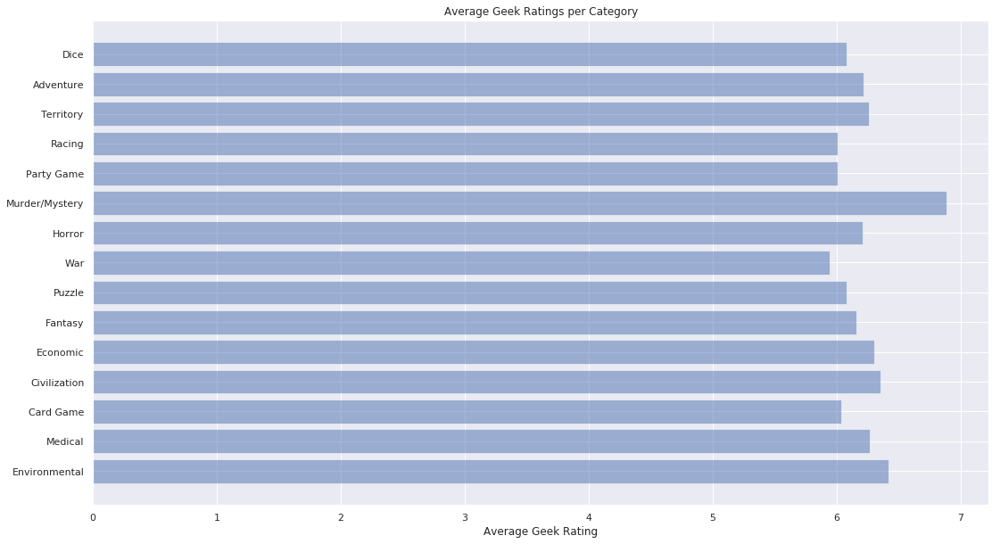

In [17]:
objects = ('Environmental', 'Medical', 'Card Game', 'Civilization', 'Economic', 'Fantasy', 'Puzzle', 'War', 'Horror', 'Murder/Mystery', 'Party Game', 'Racing', 'Territory', 'Adventure', 'Dice')
y_pos = np.arange(len(objects))
performance = [6.4208, 6.2689, 6.0354, 6.3542, 6.3047, 6.1576, 6.0803, 5.9451, 6.2094, 6.8836, 6.0049, 6.0081, 6.2592, 6.2156, 6.0827]
plt.figure(figsize=(18, 10))
plt.barh(y_pos, performance, align='center', alpha=0.5)
plt.yticks(y_pos, objects)
plt.xlabel('Average Geek Rating')
plt.title('Average Geek Ratings per Category')

plt.show()

For the purpose of this notebook, we only included the most prevalent of the game categories represented in the dataset. In the second half of this notebook, we will further analyze 1) environmental 2) medical 3) card 4) civilization 5) fantasy 6) puzzle and 7) war games. While most games fit into more than one category, for the purpose of this notebook, we will focus on each of the aforementioned categoies individually.

## Environmental Games

In [18]:
Environmental = df.groupby('Environmental')
Environmental.get_group(1)
df.head()

,Rank,Game,Min Players,Max Players,Avg Time,Min Time,Max Time,Year,Avg Rating,Geek Rating,Num Votes,Age,Mechanic,Area Control,Dice Rolling,Variable Player Powers,Partnerships,Set Collection,Hand Management,Deck,Tile Placement,Simulation,Storytelling,Memory,Player Elimination,Role Playing,Press Your Luck,owned,category,Environmental,Medical,Card Game,Civilization,Economic,Fantasy,Puzzle,TV/Movie/Radio,War,Horror,Murder/Mystery,Party Game,Trivia,Racing,Territory Building,Adventure,Dice
0,1,Pandemic Legacy: Season 1,2,4,60,60,60,2015,8.66905,8.48904,18009,13,"Action Point Allowance System, Co-operative Pl...",0,0,1,0,1,1,0,0,0,0,0,0,0,0,29472,"Environmental, Medical",1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
1,2,Through the Ages: A New Story of Civilization,2,4,240,180,240,2015,8.72977,8.30744,7309,14,"Action Point Allowance System, Auction/Bidding...",0,0,0,0,0,1,0,0,0,0,0,0,0,0,10007,"Card Game, Civilization, Economic",0,0,1,1,1,0,0,0,0,0,0,0,0,0,0,0,0
2,3,Twilight Struggle,2,2,180,180,180,2005,8.35745,8.22021,27403,13,"Area Control / Area Influence, Campaign / Batt...",1,1,0,0,0,1,0,0,0,0,0,0,0,0,37382,"Modern Warfare, Political, Wargame",0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0
3,4,Terra Mystica,2,5,150,60,150,2012,8.29627,8.15458,24267,12,"Route/Network Building, Variable Phase Order, ...",0,0,1,0,0,0,0,0,0,0,0,0,0,0,27948,"Civilization, Economic, Fantasy, Territory Bui...",0,0,0,1,1,1,0,0,0,0,0,0,0,0,1,0,0
4,5,Gloomhaven,1,4,150,90,150,2017,9.08970,8.15151,3978,12,"Action / Movement Programming, Campaign / Batt...",0,0,1,0,0,1,0,0,0,1,0,0,0,0,6057,"Adventure, Economic, Exploration, Fantasy, Fig...",0,0,0,0,1,1,0,0,0,0,0,0,0,0,0,1,0


In [19]:
Environmental.get_group(1).shape

(38, 46)

In [20]:
pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', None)
Environmental.mean()

,Rank,Min Players,Max Players,Avg Time,Min Time,Max Time,Year,Avg Rating,Geek Rating,Num Votes,Age,Area Control,Dice Rolling,Variable Player Powers,Partnerships,Set Collection,Hand Management,Deck,Tile Placement,Simulation,Storytelling,Memory,Player Elimination,Role Playing,Press Your Luck,owned,Medical,Card Game,Civilization,Economic,Fantasy,Puzzle,TV/Movie/Radio,War,Horror,Murder/Mystery,Party Game,Trivia,Racing,Territory Building,Adventure,Dice
Environmental,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
0,2505.956460,2.036081,5.292683,105.684741,87.473493,105.278573,1996.226164,6.930461,6.061404,1684.90002,10.280992,0.120339,0.273534,0.163072,0.058456,0.142108,0.261036,0.049385,0.103608,0.065914,0.01411,0.034670,0.031647,0.02822,0.0,2518.284418,0.003225,0.268897,0.032050,0.105624,0.137069,0.01794,0.0,0.214876,0.034872,0.013707,0.059867,0.0,0.031647,0.036081,0.05765,0.068535
1,1722.368421,1.842105,4.578947,88.947368,68.815789,88.947368,2010.789474,7.132719,6.420828,3428.00000,10.973684,0.131579,0.157895,0.184211,0.052632,0.263158,0.342105,0.026316,0.368421,0.131579,0.00000,0.026316,0.000000,0.00000,0.0,4841.394737,0.052632,0.157895,0.078947,0.184211,0.026316,0.00000,0.0,0.026316,0.000000,0.000000,0.000000,0.0,0.000000,0.105263,0.00000,0.105263


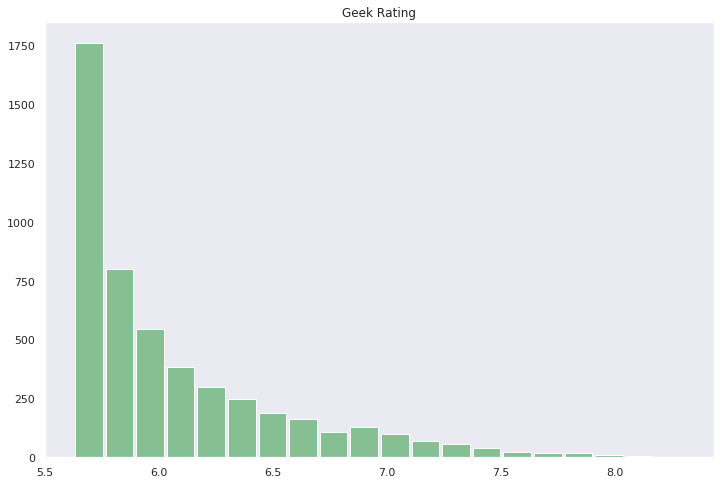

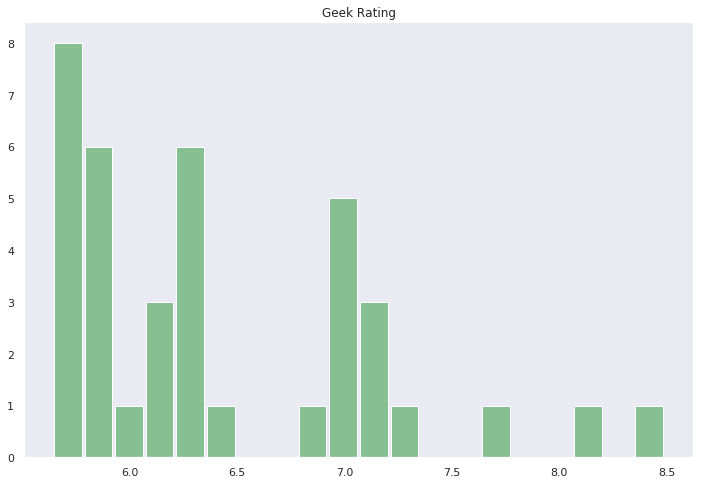

In [21]:
ax = Environmental.hist(column='Geek Rating', bins=20, grid=False, figsize=(12,8), color='#86bf91', zorder=2, rwidth=0.9)
plt.show()

The top histogram represents the entire dataset and the bottom histogram represent only games in the environmental category. Compared to the distribution of all games in the dataset, there is a larger proportion of environmental games that received high geek ratings. 

In [22]:
(df['Environmental'] == 1) & (df['Area Control'] == 1)

0       False
1       False
2       False
3       False
4       False
5       False
6       False
7       False
8       False
9       False
10      False
11      False
12      False
13      False
14      False
15      False
16      False
17      False
18      False
19      False
20      False
21      False
22      False
23      False
24      False
25      False
26      False
27      False
28      False
29      False
30      False
31      False
32      False
33      False
34      False
35      False
36      False
37      False
38      False
39      False
40      False
41      False
42      False
43      False
44      False
45      False
46      False
47      False
48      False
49      False
50      False
51      False
52      False
53      False
54      False
55      False
56      False
57      False
58      False
59      False
60      False
61      False
62      False
63      False
64      False
65      False
66      False
67      False
68      False
69      False
70      False
71    

In [23]:
df['Environmental'] = df['Environmental'].apply(bool)
df['Area Control'] = df['Area Control'].apply(bool)
df_sub = df.iloc[np.array(df['Environmental'] & df['Area Control'])]

In [24]:
df_sub.shape

(5, 46)

In [25]:
(df['Environmental'] == 1) & (df['Dice Rolling'] == 1)

0       False
1       False
2       False
3       False
4       False
5       False
6       False
7       False
8       False
9       False
10      False
11      False
12      False
13      False
14      False
15      False
16      False
17      False
18      False
19      False
20      False
21      False
22      False
23      False
24      False
25      False
26      False
27      False
28      False
29      False
30      False
31      False
32      False
33      False
34      False
35      False
36      False
37      False
38      False
39      False
40      False
41      False
42      False
43      False
44      False
45      False
46      False
47      False
48      False
49      False
50      False
51      False
52      False
53      False
54      False
55      False
56      False
57      False
58      False
59      False
60      False
61      False
62      False
63      False
64      False
65      False
66      False
67      False
68      False
69      False
70      False
71    

In [26]:
df['Environmental'] = df['Environmental'].apply(bool)
df['Dice Rolling'] = df['Dice Rolling'].apply(bool)
df_sub = df.iloc[np.array(df['Environmental'] & df['Dice Rolling'])]

In [27]:
df_sub.shape

(6, 46)

In [28]:
(df['Environmental'] == 1) & (df['Variable Player Powers'] == 1)

0        True
1       False
2       False
3       False
4       False
5       False
6       False
7        True
8       False
9       False
10      False
11      False
12      False
13      False
14      False
15      False
16      False
17      False
18      False
19      False
20      False
21      False
22      False
23      False
24      False
25      False
26      False
27      False
28      False
29      False
30      False
31      False
32      False
33      False
34      False
35      False
36      False
37      False
38      False
39      False
40      False
41      False
42      False
43      False
44      False
45      False
46      False
47      False
48      False
49      False
50      False
51      False
52      False
53      False
54      False
55      False
56      False
57      False
58      False
59      False
60      False
61      False
62      False
63      False
64      False
65      False
66      False
67      False
68      False
69      False
70      False
71    

In [29]:
df['Environmental'] = df['Environmental'].apply(bool)
df['Variable Player Powers'] = df['Variable Player Powers'].apply(bool)
df_sub = df.iloc[np.array(df['Environmental'] & df['Variable Player Powers'])]

In [30]:
df_sub.shape

(7, 46)

In [31]:
(df['Environmental'] == 1) & (df['Partnerships'] == 1)

0       False
1       False
2       False
3       False
4       False
5       False
6       False
7       False
8       False
9       False
10      False
11      False
12      False
13      False
14      False
15      False
16      False
17      False
18      False
19      False
20      False
21      False
22      False
23      False
24      False
25      False
26      False
27      False
28      False
29      False
30      False
31      False
32      False
33      False
34      False
35      False
36      False
37      False
38      False
39      False
40      False
41      False
42      False
43      False
44      False
45      False
46      False
47      False
48      False
49      False
50      False
51      False
52      False
53      False
54      False
55      False
56      False
57      False
58      False
59      False
60      False
61      False
62      False
63      False
64      False
65      False
66      False
67      False
68      False
69      False
70      False
71    

In [32]:
df['Environmental'] = df['Environmental'].apply(bool)
df['Partnerships'] = df['Partnerships'].apply(bool)
df_sub = df.iloc[np.array(df['Environmental'] & df['Partnerships'])]

In [33]:
df_sub.shape

(2, 46)

In [34]:
(df['Environmental'] == 1) & (df['Set Collection'] == 1)

0        True
1       False
2       False
3       False
4       False
5       False
6       False
7       False
8       False
9       False
10      False
11      False
12      False
13      False
14      False
15      False
16      False
17      False
18      False
19      False
20      False
21      False
22      False
23      False
24      False
25      False
26      False
27      False
28      False
29      False
30      False
31      False
32      False
33      False
34      False
35      False
36      False
37      False
38      False
39      False
40      False
41      False
42      False
43      False
44      False
45       True
46      False
47      False
48      False
49      False
50      False
51      False
52      False
53      False
54      False
55      False
56      False
57      False
58      False
59      False
60      False
61      False
62      False
63      False
64      False
65      False
66      False
67      False
68      False
69      False
70      False
71    

In [35]:
df['Environmental'] = df['Environmental'].apply(bool)
df['Set Collection'] = df['Set Collection'].apply(bool)
df_sub = df.iloc[np.array(df['Environmental'] & df['Set Collection'])]

In [36]:
df_sub.shape

(10, 46)

In [37]:
(df['Environmental'] == 1) & (df['Hand Management'] == 1)

0        True
1       False
2       False
3       False
4       False
5       False
6       False
7        True
8       False
9       False
10      False
11      False
12      False
13      False
14      False
15      False
16      False
17      False
18      False
19      False
20      False
21      False
22      False
23      False
24      False
25      False
26      False
27      False
28      False
29      False
30      False
31      False
32      False
33      False
34      False
35      False
36      False
37      False
38      False
39      False
40      False
41      False
42      False
43      False
44      False
45      False
46      False
47      False
48      False
49      False
50      False
51      False
52      False
53      False
54      False
55      False
56      False
57      False
58      False
59      False
60      False
61      False
62      False
63      False
64      False
65      False
66      False
67      False
68      False
69      False
70      False
71    

In [38]:
df['Environmental'] = df['Environmental'].apply(bool)
df['Hand Management'] = df['Hand Management'].apply(bool)
df_sub = df.iloc[np.array(df['Environmental'] & df['Hand Management'])]

In [39]:
df_sub.shape

(13, 46)

In [40]:
(df['Environmental'] == 1) & (df['Deck'] == 1)

0       False
1       False
2       False
3       False
4       False
5       False
6       False
7       False
8       False
9       False
10      False
11      False
12      False
13      False
14      False
15      False
16      False
17      False
18      False
19      False
20      False
21      False
22      False
23      False
24      False
25      False
26      False
27      False
28      False
29      False
30      False
31      False
32      False
33      False
34      False
35      False
36      False
37      False
38      False
39      False
40      False
41      False
42      False
43      False
44      False
45      False
46      False
47      False
48      False
49      False
50      False
51      False
52      False
53      False
54      False
55      False
56      False
57      False
58      False
59      False
60      False
61      False
62      False
63      False
64      False
65      False
66      False
67      False
68      False
69      False
70      False
71    

In [41]:
df['Environmental'] = df['Environmental'].apply(bool)
df['Deck'] = df['Deck'].apply(bool)
df_sub = df.iloc[np.array(df['Environmental'] & df['Deck'])]

In [42]:
df_sub.shape

(1, 46)

In [43]:
(df['Environmental'] == 1) & (df['Tile Placement'] == 1)

0       False
1       False
2       False
3       False
4       False
5       False
6       False
7        True
8       False
9       False
10      False
11      False
12      False
13      False
14      False
15      False
16      False
17      False
18      False
19      False
20      False
21      False
22      False
23      False
24      False
25      False
26      False
27      False
28      False
29      False
30      False
31      False
32      False
33      False
34      False
35      False
36      False
37      False
38      False
39      False
40      False
41      False
42      False
43      False
44      False
45      False
46      False
47      False
48      False
49      False
50      False
51      False
52      False
53      False
54      False
55      False
56      False
57      False
58      False
59      False
60      False
61      False
62      False
63      False
64      False
65      False
66      False
67      False
68      False
69      False
70      False
71    

In [44]:
df['Environmental'] = df['Environmental'].apply(bool)
df['Tile Placement'] = df['Tile Placement'].apply(bool)
df_sub = df.iloc[np.array(df['Environmental'] & df['Tile Placement'])]

In [45]:
df_sub.shape

(14, 46)

In [46]:
(df['Environmental'] == 1) & (df['Simulation'] == 1)

0       False
1       False
2       False
3       False
4       False
5       False
6       False
7       False
8       False
9       False
10      False
11      False
12      False
13      False
14      False
15      False
16      False
17      False
18      False
19      False
20      False
21      False
22      False
23      False
24      False
25      False
26      False
27      False
28      False
29      False
30      False
31      False
32      False
33      False
34      False
35      False
36      False
37      False
38      False
39      False
40      False
41      False
42      False
43      False
44      False
45      False
46      False
47      False
48      False
49      False
50      False
51      False
52      False
53      False
54      False
55      False
56      False
57      False
58      False
59      False
60      False
61      False
62      False
63      False
64      False
65      False
66      False
67      False
68      False
69      False
70      False
71    

In [47]:
df['Environmental'] = df['Environmental'].apply(bool)
df['Simulation'] = df['Simulation'].apply(bool)
df_sub = df.iloc[np.array(df['Environmental'] & df['Simulation'])]

In [48]:
df_sub.shape

(5, 46)

In [49]:
(df['Environmental'] == 1) & (df['Memory'] == 1)

0       False
1       False
2       False
3       False
4       False
5       False
6       False
7       False
8       False
9       False
10      False
11      False
12      False
13      False
14      False
15      False
16      False
17      False
18      False
19      False
20      False
21      False
22      False
23      False
24      False
25      False
26      False
27      False
28      False
29      False
30      False
31      False
32      False
33      False
34      False
35      False
36      False
37      False
38      False
39      False
40      False
41      False
42      False
43      False
44      False
45      False
46      False
47      False
48      False
49      False
50      False
51      False
52      False
53      False
54      False
55      False
56      False
57      False
58      False
59      False
60      False
61      False
62      False
63      False
64      False
65      False
66      False
67      False
68      False
69      False
70      False
71    

In [50]:
df['Environmental'] = df['Environmental'].apply(bool)
df['Memory'] = df['Memory'].apply(bool)
df_sub = df.iloc[np.array(df['Environmental'] & df['Memory'])]

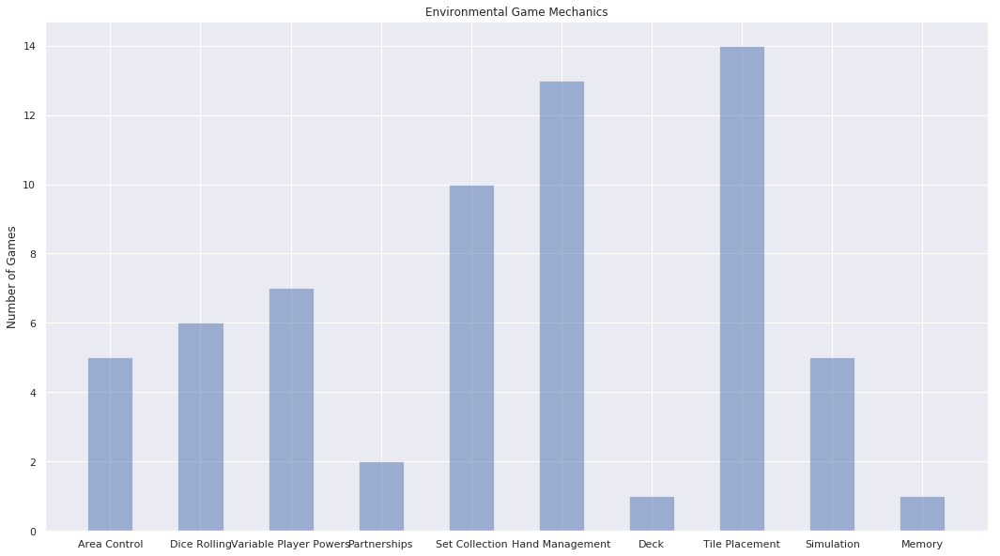

In [51]:
objects = ('Area Control', 'Dice Rolling','Variable Player Powers', 'Partnerships', 'Set Collection', 'Hand Management', 'Deck', 'Tile Placement', 'Simulation', 'Memory')
y_pos = np.arange(len(objects))
performance = [5,6,7,2,10,13,1,14,5,1]
plt.figure(figsize=(18, 10))
plt.bar(y_pos, performance, align='center', width=.5, alpha=0.5)
plt.xticks(y_pos, objects)
plt.ylabel('Number of Games')
plt.title('Environmental Game Mechanics')
plt.rc('xtick', labelsize=10) 
plt.rc('ytick', labelsize=25) 


plt.show()

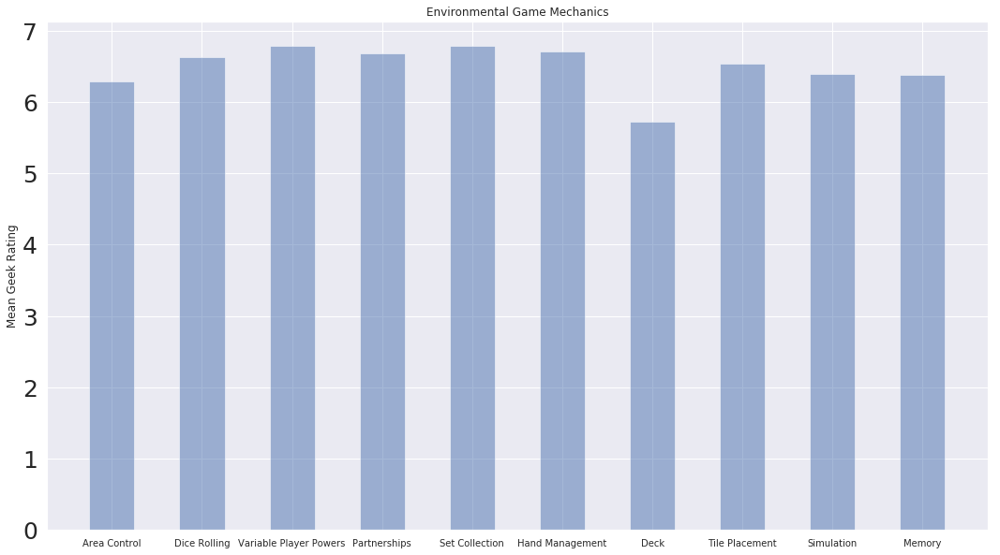

In [52]:
objects = ('Area Control', 'Dice Rolling', 'Variable Player Powers', 'Partnerships', 'Set Collection', 'Hand Management', 'Deck', 'Tile Placement', 'Simulation', 'Memory')
y_pos = np.arange(len(objects))
performance = [6.29, 6.63, 6.78,6.68,6.79,6.71,5.72,6.54,6.39,6.38]
plt.figure(figsize=(18, 10))
plt.bar(y_pos, performance, align='center', width=.5, alpha=0.5)
plt.xticks(y_pos, objects)
plt.ylabel('Mean Geek Rating')
plt.title('Environmental Game Mechanics')
plt.rc('xtick', labelsize=10) 
plt.rc('ytick', labelsize=25) 


plt.show()

According to this bar graph, there were not any major differences in the average geek ratings of environmental games that employed particular game mechanics (although games that incorporated decks performed slightly worse). It is important to note, however, that because so many games incorporate more than one mechanic, it is difficult to determine which mechanic was the most influential to a game's geek rating.

## Medical Games

In [53]:
Medical = df.groupby('Medical')
Medical.get_group(1)
df.head()

,Rank,Game,Min Players,Max Players,Avg Time,Min Time,Max Time,Year,Avg Rating,Geek Rating,Num Votes,Age,Mechanic,Area Control,Dice Rolling,Variable Player Powers,Partnerships,Set Collection,Hand Management,Deck,Tile Placement,Simulation,Storytelling,Memory,Player Elimination,Role Playing,Press Your Luck,owned,category,Environmental,Medical,Card Game,Civilization,Economic,Fantasy,Puzzle,TV/Movie/Radio,War,Horror,Murder/Mystery,Party Game,Trivia,Racing,Territory Building,Adventure,Dice
0,1,Pandemic Legacy: Season 1,2,4,60,60,60,2015,8.66905,8.48904,18009,13,"Action Point Allowance System, Co-operative Pl...",False,False,True,False,True,True,False,False,False,0,False,0,0,0,29472,"Environmental, Medical",True,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
1,2,Through the Ages: A New Story of Civilization,2,4,240,180,240,2015,8.72977,8.30744,7309,14,"Action Point Allowance System, Auction/Bidding...",False,False,False,False,False,True,False,False,False,0,False,0,0,0,10007,"Card Game, Civilization, Economic",False,0,1,1,1,0,0,0,0,0,0,0,0,0,0,0,0
2,3,Twilight Struggle,2,2,180,180,180,2005,8.35745,8.22021,27403,13,"Area Control / Area Influence, Campaign / Batt...",True,True,False,False,False,True,False,False,False,0,False,0,0,0,37382,"Modern Warfare, Political, Wargame",False,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0
3,4,Terra Mystica,2,5,150,60,150,2012,8.29627,8.15458,24267,12,"Route/Network Building, Variable Phase Order, ...",False,False,True,False,False,False,False,False,False,0,False,0,0,0,27948,"Civilization, Economic, Fantasy, Territory Bui...",False,0,0,1,1,1,0,0,0,0,0,0,0,0,1,0,0
4,5,Gloomhaven,1,4,150,90,150,2017,9.08970,8.15151,3978,12,"Action / Movement Programming, Campaign / Batt...",False,False,True,False,False,True,False,False,False,1,False,0,0,0,6057,"Adventure, Economic, Exploration, Fantasy, Fig...",False,0,0,0,1,1,0,0,0,0,0,0,0,0,0,1,0


In [54]:
df.shape

(4999, 46)

In [55]:
Medical.get_group(1).shape

(18, 46)

In [56]:
pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', None)
Medical.mean()

,Rank,Min Players,Max Players,Avg Time,Min Time,Max Time,Year,Avg Rating,Geek Rating,Num Votes,Age,Area Control,Dice Rolling,Variable Player Powers,Partnerships,Set Collection,Hand Management,Deck,Tile Placement,Simulation,Storytelling,Memory,Player Elimination,Role Playing,Press Your Luck,owned,Environmental,Card Game,Civilization,Economic,Fantasy,Puzzle,TV/Movie/Radio,War,Horror,Murder/Mystery,Party Game,Trivia,Racing,Territory Building,Adventure,Dice
Medical,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
0,2500.795423,2.035535,5.288296,105.739811,87.473198,105.335274,1996.273238,6.931046,6.063396,1684.880948,10.287091,0.120257,0.272636,0.162618,0.058422,0.142140,0.260791,0.049187,0.105401,0.066252,0.014053,0.034732,0.031319,0.028107,0.0,2515.279261,0.007227,0.268219,0.032524,0.106204,0.13672,0.017667,0.0,0.214214,0.034732,0.013652,0.059024,0.0,0.03152,0.036539,0.057418,0.068460
1,2279.888889,1.777778,5.000000,55.111111,48.166667,55.111111,2013.944444,7.195807,6.268994,5370.055556,10.055556,0.166667,0.277778,0.333333,0.055556,0.388889,0.500000,0.055556,0.166667,0.111111,0.000000,0.000000,0.055556,0.000000,0.0,8254.222222,0.111111,0.222222,0.000000,0.111111,0.00000,0.055556,0.0,0.000000,0.000000,0.000000,0.166667,0.0,0.00000,0.055556,0.000000,0.166667


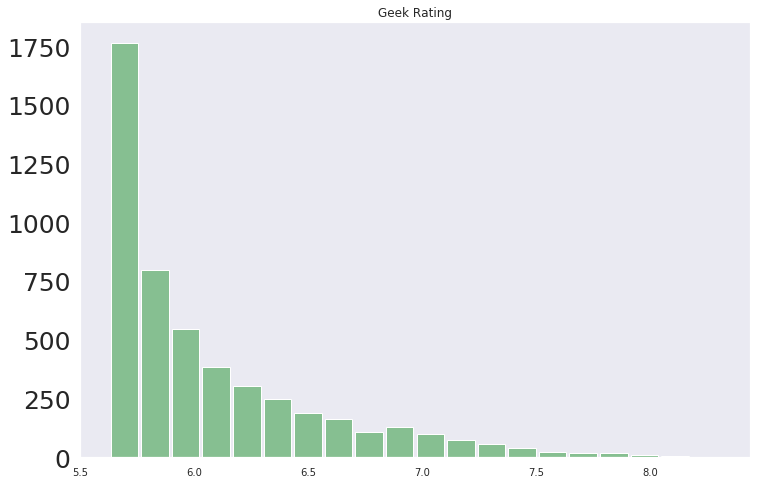

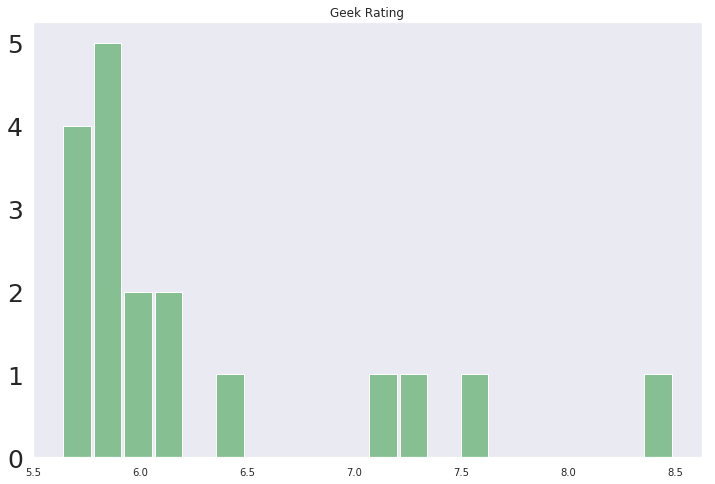

In [57]:
ax = Medical.hist(column='Geek Rating', bins=20, grid=False, figsize=(12,8), color='#86bf91', zorder=2, rwidth=0.9)
plt.show()

Compared to the distribution of the entire dataset, a smaller proportion of medical games are rated below 6.

In [58]:
(df['Medical'] == 1) & (df['Area Control'] == 1)

0       False
1       False
2       False
3       False
4       False
5       False
6       False
7       False
8       False
9       False
10      False
11      False
12      False
13      False
14      False
15      False
16      False
17      False
18      False
19      False
20      False
21      False
22      False
23      False
24      False
25      False
26      False
27      False
28      False
29      False
30      False
31      False
32      False
33      False
34      False
35      False
36      False
37      False
38      False
39      False
40      False
41      False
42      False
43      False
44      False
45      False
46      False
47      False
48      False
49      False
50      False
51      False
52      False
53      False
54      False
55      False
56      False
57      False
58      False
59      False
60      False
61      False
62      False
63      False
64      False
65      False
66      False
67      False
68      False
69      False
70      False
71    

In [59]:
df['Medical'] = df['Medical'].apply(bool)
df['Area Control'] = df['Area Control'].apply(bool)
df_sub = df.iloc[np.array(df['Medical'] & df['Area Control'])]

In [60]:
(df['Medical'] == 1) & (df['Dice Rolling'] == 1)

0       False
1       False
2       False
3       False
4       False
5       False
6       False
7       False
8       False
9       False
10      False
11      False
12      False
13      False
14      False
15      False
16      False
17      False
18      False
19      False
20      False
21      False
22      False
23      False
24      False
25      False
26      False
27      False
28      False
29      False
30      False
31      False
32      False
33      False
34      False
35      False
36      False
37      False
38      False
39      False
40      False
41      False
42      False
43      False
44      False
45      False
46      False
47      False
48      False
49      False
50      False
51      False
52      False
53      False
54      False
55      False
56      False
57      False
58      False
59      False
60      False
61      False
62      False
63      False
64      False
65      False
66      False
67      False
68      False
69      False
70      False
71    

In [61]:
df['Medical'] = df['Medical'].apply(bool)
df['Dice Rolling'] = df['Dice Rolling'].apply(bool)
df_sub = df.iloc[np.array(df['Medical'] & df['Dice Rolling'])]

In [62]:
df_sub.shape

(5, 46)

In [63]:
(df['Medical'] == 1) & (df['Variable Player Powers'] == 1)

0        True
1       False
2       False
3       False
4       False
5       False
6       False
7       False
8       False
9       False
10      False
11      False
12      False
13      False
14      False
15      False
16      False
17      False
18      False
19      False
20      False
21      False
22      False
23      False
24      False
25      False
26      False
27      False
28      False
29      False
30      False
31      False
32      False
33      False
34      False
35      False
36      False
37      False
38      False
39      False
40      False
41      False
42      False
43      False
44      False
45      False
46      False
47      False
48      False
49      False
50      False
51      False
52      False
53      False
54      False
55      False
56      False
57      False
58      False
59      False
60      False
61       True
62      False
63      False
64      False
65      False
66      False
67      False
68      False
69      False
70      False
71    

In [64]:
df['Medical'] = df['Medical'].apply(bool)
df['Variable Player Powers'] = df['Variable Player Powers'].apply(bool)
df_sub = df.iloc[np.array(df['Medical'] & df['Variable Player Powers'])]

In [65]:
df_sub.shape

(6, 46)

In [66]:
(df['Medical'] == 1) & (df['Partnerships'] == 1)

0       False
1       False
2       False
3       False
4       False
5       False
6       False
7       False
8       False
9       False
10      False
11      False
12      False
13      False
14      False
15      False
16      False
17      False
18      False
19      False
20      False
21      False
22      False
23      False
24      False
25      False
26      False
27      False
28      False
29      False
30      False
31      False
32      False
33      False
34      False
35      False
36      False
37      False
38      False
39      False
40      False
41      False
42      False
43      False
44      False
45      False
46      False
47      False
48      False
49      False
50      False
51      False
52      False
53      False
54      False
55      False
56      False
57      False
58      False
59      False
60      False
61      False
62      False
63      False
64      False
65      False
66      False
67      False
68      False
69      False
70      False
71    

In [67]:
df['Medical'] = df['Medical'].apply(bool)
df['Partnerships'] = df['Partnerships'].apply(bool)
df_sub = df.iloc[np.array(df['Medical'] & df['Partnerships'])]

In [68]:
(df['Medical'] == 1) & (df['Set Collection'] == 1)

0        True
1       False
2       False
3       False
4       False
5       False
6       False
7       False
8       False
9       False
10      False
11      False
12      False
13      False
14      False
15      False
16      False
17      False
18      False
19      False
20      False
21      False
22      False
23      False
24      False
25      False
26      False
27      False
28      False
29      False
30      False
31      False
32      False
33      False
34      False
35      False
36      False
37      False
38      False
39      False
40      False
41      False
42      False
43      False
44      False
45      False
46      False
47      False
48      False
49      False
50      False
51      False
52      False
53      False
54      False
55      False
56      False
57      False
58      False
59      False
60      False
61       True
62      False
63      False
64      False
65      False
66      False
67      False
68      False
69      False
70      False
71    

In [69]:
df['Medical'] = df['Medical'].apply(bool)
df['Set Collection'] = df['Set Collection'].apply(bool)
df_sub = df.iloc[np.array(df['Medical'] & df['Set Collection'])]

In [70]:
df_sub.shape

(7, 46)

In [71]:
(df['Medical'] == 1) & (df['Hand Management'] == 1)

0        True
1       False
2       False
3       False
4       False
5       False
6       False
7       False
8       False
9       False
10      False
11      False
12      False
13      False
14      False
15      False
16      False
17      False
18      False
19      False
20      False
21      False
22      False
23      False
24      False
25      False
26      False
27      False
28      False
29      False
30      False
31      False
32      False
33      False
34      False
35      False
36      False
37      False
38      False
39      False
40      False
41      False
42      False
43      False
44      False
45      False
46      False
47      False
48      False
49      False
50      False
51      False
52      False
53      False
54      False
55      False
56      False
57      False
58      False
59      False
60      False
61       True
62      False
63      False
64      False
65      False
66      False
67      False
68      False
69      False
70      False
71    

In [72]:
df['Medical'] = df['Medical'].apply(bool)
df['Hand Management'] = df['Hand Management'].apply(bool)
df_sub = df.iloc[np.array(df['Medical'] & df['Hand Management'])]

In [73]:
df_sub.shape

(9, 46)

In [74]:
(df['Medical'] == 1) & (df['Deck'] == 1)

0       False
1       False
2       False
3       False
4       False
5       False
6       False
7       False
8       False
9       False
10      False
11      False
12      False
13      False
14      False
15      False
16      False
17      False
18      False
19      False
20      False
21      False
22      False
23      False
24      False
25      False
26      False
27      False
28      False
29      False
30      False
31      False
32      False
33      False
34      False
35      False
36      False
37      False
38      False
39      False
40      False
41      False
42      False
43      False
44      False
45      False
46      False
47      False
48      False
49      False
50      False
51      False
52      False
53      False
54      False
55      False
56      False
57      False
58      False
59      False
60      False
61      False
62      False
63      False
64      False
65      False
66      False
67      False
68      False
69      False
70      False
71    

In [75]:
df['Medical'] = df['Medical'].apply(bool)
df['Deck'] = df['Deck'].apply(bool)
df_sub = df.iloc[np.array(df['Medical'] & df['Deck'])]

In [76]:
(df['Medical'] == 1) & (df['Tile Placement'] == 1)

0       False
1       False
2       False
3       False
4       False
5       False
6       False
7       False
8       False
9       False
10      False
11      False
12      False
13      False
14      False
15      False
16      False
17      False
18      False
19      False
20      False
21      False
22      False
23      False
24      False
25      False
26      False
27      False
28      False
29      False
30      False
31      False
32      False
33      False
34      False
35      False
36      False
37      False
38      False
39      False
40      False
41      False
42      False
43      False
44      False
45      False
46      False
47      False
48      False
49      False
50      False
51      False
52      False
53      False
54      False
55      False
56      False
57      False
58      False
59      False
60      False
61      False
62      False
63      False
64      False
65      False
66      False
67      False
68      False
69      False
70      False
71    

In [77]:
df['Medical'] = df['Medical'].apply(bool)
df['Tile Placement'] = df['Tile Placement'].apply(bool)
df_sub = df.iloc[np.array(df['Medical'] & df['Tile Placement'])]

In [78]:
(df['Medical'] == 1) & (df['Simulation'] == 1)

0       False
1       False
2       False
3       False
4       False
5       False
6       False
7       False
8       False
9       False
10      False
11      False
12      False
13      False
14      False
15      False
16      False
17      False
18      False
19      False
20      False
21      False
22      False
23      False
24      False
25      False
26      False
27      False
28      False
29      False
30      False
31      False
32      False
33      False
34      False
35      False
36      False
37      False
38      False
39      False
40      False
41      False
42      False
43      False
44      False
45      False
46      False
47      False
48      False
49      False
50      False
51      False
52      False
53      False
54      False
55      False
56      False
57      False
58      False
59      False
60      False
61      False
62      False
63      False
64      False
65      False
66      False
67      False
68      False
69      False
70      False
71    

In [79]:
df['Medical'] = df['Medical'].apply(bool)
df['Simulation'] = df['Simulation'].apply(bool)
df_sub = df.iloc[np.array(df['Medical'] & df['Simulation'])]

In [80]:
(df['Medical'] == 1) & (df['Player Elimination'] == 1)

0       False
1       False
2       False
3       False
4       False
5       False
6       False
7       False
8       False
9       False
10      False
11      False
12      False
13      False
14      False
15      False
16      False
17      False
18      False
19      False
20      False
21      False
22      False
23      False
24      False
25      False
26      False
27      False
28      False
29      False
30      False
31      False
32      False
33      False
34      False
35      False
36      False
37      False
38      False
39      False
40      False
41      False
42      False
43      False
44      False
45      False
46      False
47      False
48      False
49      False
50      False
51      False
52      False
53      False
54      False
55      False
56      False
57      False
58      False
59      False
60      False
61      False
62      False
63      False
64      False
65      False
66      False
67      False
68      False
69      False
70      False
71    

In [81]:
df['Medical'] = df['Medical'].apply(bool)
df['Player Elimination'] = df['Player Elimination'].apply(bool)
df_sub = df.iloc[np.array(df['Medical'] & df['Player Elimination'])]

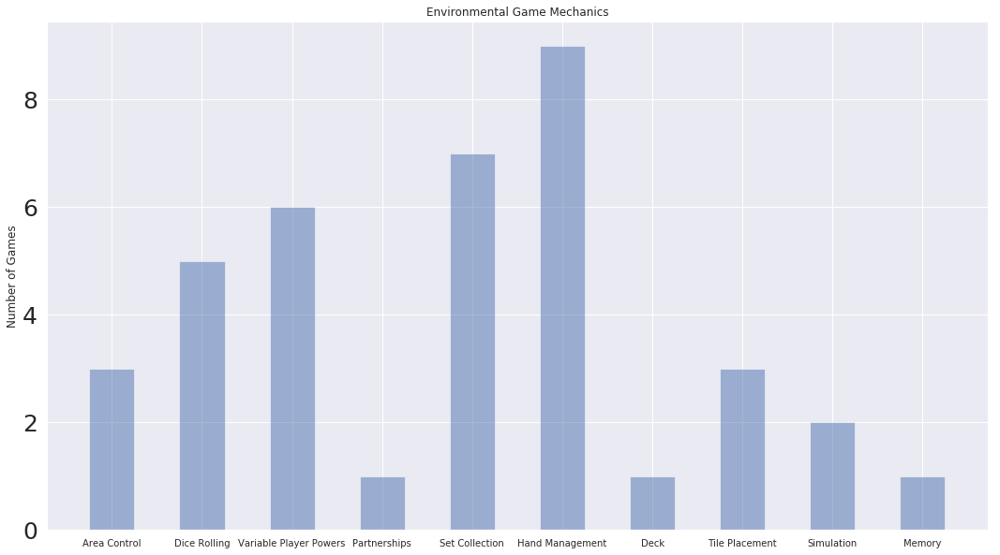

In [82]:
objects = ('Area Control', 'Dice Rolling','Variable Player Powers', 'Partnerships', 'Set Collection', 'Hand Management', 'Deck', 'Tile Placement', 'Simulation', 'Memory')
y_pos = np.arange(len(objects))
performance = [3,5,6,1,7,9,1,3,2,1]
plt.figure(figsize=(18, 10))
plt.bar(y_pos, performance, align='center', width=.5, alpha=0.5)
plt.xticks(y_pos, objects)
plt.ylabel('Number of Games')
plt.title('Environmental Game Mechanics')
plt.rc('xtick', labelsize=10) 
plt.rc('ytick', labelsize=25) 


plt.show()

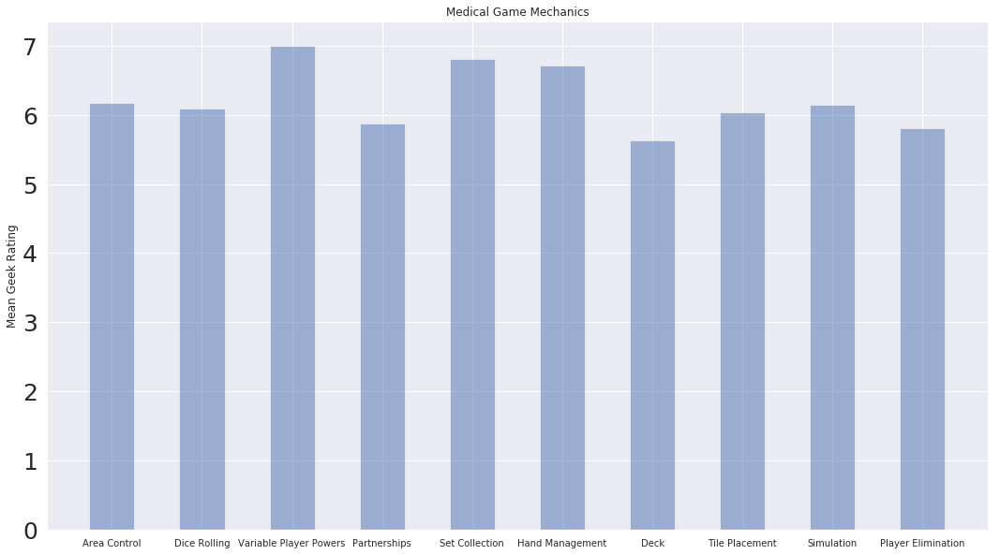

In [83]:
objects = ('Area Control', 'Dice Rolling','Variable Player Powers', 'Partnerships', 'Set Collection', 'Hand Management', 'Deck', 'Tile Placement', 'Simulation', 'Player Elimination')
y_pos = np.arange(len(objects))
performance = [6.17,6.09,7,5.87,6.81,6.71,5.63,6.03,6.14,5.81]
plt.figure(figsize=(18, 10))
plt.bar(y_pos, performance, align='center', width=.5, alpha=0.5)
plt.xticks(y_pos, objects)
plt.ylabel('Mean Geek Rating')
plt.title('Medical Game Mechanics')
plt.rc('xtick', labelsize=10) 
plt.rc('ytick', labelsize=25) 


plt.show()

Variable player powers and set collection seem to be among the highest rated mechanics in medical games while decks and partnerships appear to be among the lowest rated.

## Card Games

In [84]:
Card_Game = df.groupby('Card Game')
Card_Game.get_group(1)
df.head()

,Rank,Game,Min Players,Max Players,Avg Time,Min Time,Max Time,Year,Avg Rating,Geek Rating,Num Votes,Age,Mechanic,Area Control,Dice Rolling,Variable Player Powers,Partnerships,Set Collection,Hand Management,Deck,Tile Placement,Simulation,Storytelling,Memory,Player Elimination,Role Playing,Press Your Luck,owned,category,Environmental,Medical,Card Game,Civilization,Economic,Fantasy,Puzzle,TV/Movie/Radio,War,Horror,Murder/Mystery,Party Game,Trivia,Racing,Territory Building,Adventure,Dice
0,1,Pandemic Legacy: Season 1,2,4,60,60,60,2015,8.66905,8.48904,18009,13,"Action Point Allowance System, Co-operative Pl...",False,False,True,False,True,True,False,False,False,0,False,False,0,0,29472,"Environmental, Medical",True,True,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
1,2,Through the Ages: A New Story of Civilization,2,4,240,180,240,2015,8.72977,8.30744,7309,14,"Action Point Allowance System, Auction/Bidding...",False,False,False,False,False,True,False,False,False,0,False,False,0,0,10007,"Card Game, Civilization, Economic",False,False,1,1,1,0,0,0,0,0,0,0,0,0,0,0,0
2,3,Twilight Struggle,2,2,180,180,180,2005,8.35745,8.22021,27403,13,"Area Control / Area Influence, Campaign / Batt...",True,True,False,False,False,True,False,False,False,0,False,False,0,0,37382,"Modern Warfare, Political, Wargame",False,False,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0
3,4,Terra Mystica,2,5,150,60,150,2012,8.29627,8.15458,24267,12,"Route/Network Building, Variable Phase Order, ...",False,False,True,False,False,False,False,False,False,0,False,False,0,0,27948,"Civilization, Economic, Fantasy, Territory Bui...",False,False,0,1,1,1,0,0,0,0,0,0,0,0,1,0,0
4,5,Gloomhaven,1,4,150,90,150,2017,9.08970,8.15151,3978,12,"Action / Movement Programming, Campaign / Batt...",False,False,True,False,False,True,False,False,False,1,False,False,0,0,6057,"Adventure, Economic, Exploration, Fantasy, Fig...",False,False,0,0,1,1,0,0,0,0,0,0,0,0,0,1,0


In [85]:
Card_Game.get_group(1).shape

(1340, 46)

In [86]:
pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', None)
Card_Game.mean()

,Rank,Min Players,Max Players,Avg Time,Min Time,Max Time,Year,Avg Rating,Geek Rating,Num Votes,Age,Area Control,Dice Rolling,Variable Player Powers,Partnerships,Set Collection,Hand Management,Deck,Tile Placement,Simulation,Storytelling,Memory,Player Elimination,Role Playing,Press Your Luck,owned,Environmental,Medical,Civilization,Economic,Fantasy,Puzzle,TV/Movie/Radio,War,Horror,Murder/Mystery,Party Game,Trivia,Racing,Territory Building,Adventure,Dice
Card Game,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
0,2481.587046,2.001913,4.851325,127.610276,105.592785,127.153867,1995.341077,6.990806,6.074657,1644.079803,10.333698,0.141295,0.338071,0.161793,0.056300,0.113692,0.154960,0.024324,0.130637,0.081170,0.011479,0.030883,0.023777,0.028696,0.0,2395.086362,0.008746,0.003826,0.036075,0.124351,0.113419,0.021591,0.0,0.272206,0.030336,0.013938,0.051927,0.0,0.036075,0.045641,0.065045,0.082810
1,2550.278358,2.123881,6.477612,45.340299,37.467910,45.082836,1999.055970,6.771420,6.035409,1845.794776,10.156716,0.063433,0.094030,0.167164,0.064179,0.223134,0.552985,0.117164,0.037313,0.026119,0.020896,0.044776,0.052239,0.026119,0.0,2920.567910,0.004478,0.002985,0.022388,0.056716,0.198507,0.007463,0.0,0.052985,0.046269,0.012687,0.079851,0.0,0.018657,0.011940,0.035821,0.030597


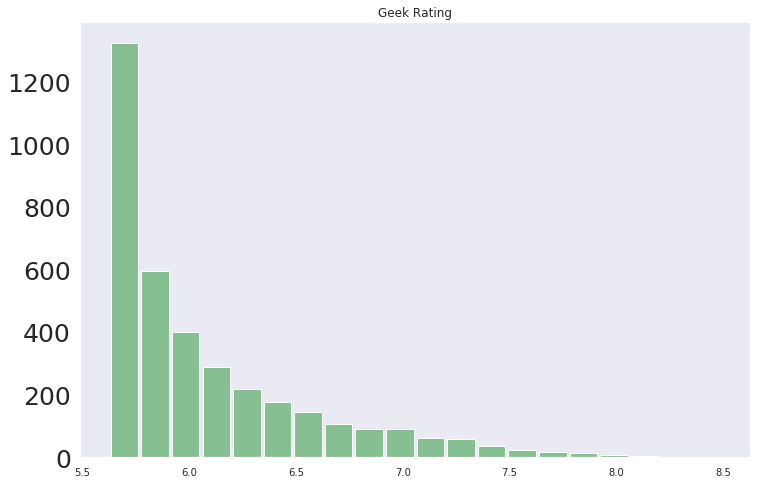

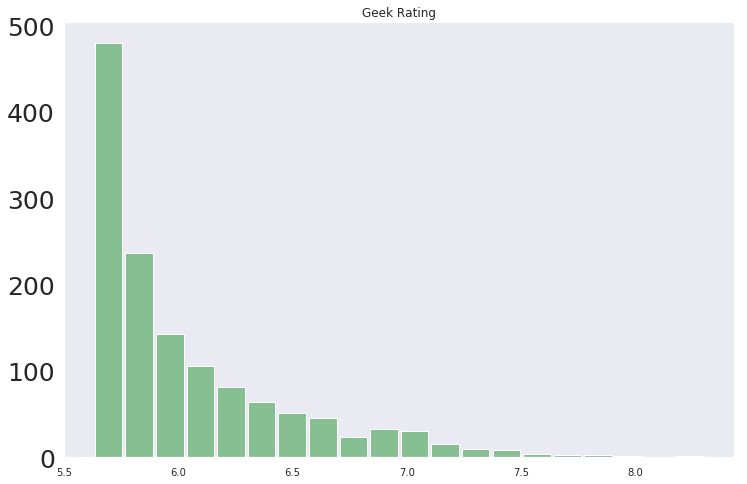

In [87]:
ax = Card_Game.hist(column='Geek Rating', bins=20, grid=False, figsize=(12,8), color='#86bf91', zorder=2, rwidth=0.9)
plt.show()

The distribution of geek ratings for card games closely resembles the distriburion of geek ratings for all of the games in the dataset. This is likely because card games represent the largest sample size of all of the categorizes analyzed in this notebook.

In [88]:
(df['Card Game'] == 1) & (df['Area Control'] == 1)

0       False
1       False
2       False
3       False
4       False
5       False
6       False
7       False
8       False
9       False
10      False
11      False
12      False
13      False
14      False
15      False
16      False
17      False
18      False
19      False
20      False
21      False
22      False
23      False
24      False
25      False
26      False
27      False
28      False
29      False
30      False
31      False
32      False
33      False
34      False
35      False
36      False
37      False
38      False
39      False
40      False
41      False
42      False
43      False
44      False
45      False
46      False
47      False
48      False
49      False
50      False
51      False
52      False
53      False
54      False
55      False
56      False
57      False
58      False
59      False
60      False
61      False
62      False
63      False
64      False
65      False
66      False
67      False
68      False
69      False
70      False
71    

In [89]:
df['Card Game'] = df['Card Game'].apply(bool)
df['Area Control'] = df['Area Control'].apply(bool)
df_sub = df.iloc[np.array(df['Card Game'] & df['Area Control'])]

In [90]:
df_sub.shape

(85, 46)

In [91]:
(df['Card Game'] == 1) & (df['Dice Rolling'] == 1)

0       False
1       False
2       False
3       False
4       False
5       False
6       False
7       False
8       False
9       False
10      False
11      False
12      False
13      False
14      False
15      False
16      False
17      False
18      False
19      False
20      False
21      False
22      False
23      False
24      False
25      False
26      False
27      False
28      False
29      False
30      False
31      False
32      False
33      False
34      False
35      False
36      False
37      False
38      False
39      False
40      False
41      False
42      False
43      False
44      False
45      False
46      False
47      False
48      False
49      False
50      False
51      False
52      False
53      False
54      False
55      False
56      False
57      False
58      False
59      False
60      False
61      False
62      False
63      False
64      False
65      False
66      False
67      False
68      False
69      False
70      False
71    

In [92]:
df['Card Game'] = df['Card Game'].apply(bool)
df['Dice Rolling'] = df['Dice Rolling'].apply(bool)
df_sub = df.iloc[np.array(df['Card Game'] & df['Dice Rolling'])]

In [93]:
df_sub.shape

(126, 46)

In [94]:
(df['Card Game'] == 1) & (df['Variable Player Powers'] == 1)

0       False
1       False
2       False
3       False
4       False
5       False
6       False
7       False
8       False
9       False
10      False
11      False
12      False
13      False
14      False
15      False
16      False
17      False
18      False
19      False
20      False
21      False
22      False
23       True
24      False
25      False
26       True
27      False
28      False
29      False
30      False
31      False
32      False
33      False
34      False
35      False
36       True
37      False
38      False
39      False
40      False
41      False
42      False
43      False
44      False
45      False
46       True
47      False
48      False
49      False
50      False
51      False
52      False
53      False
54      False
55      False
56      False
57      False
58      False
59      False
60      False
61      False
62      False
63      False
64      False
65      False
66      False
67       True
68      False
69      False
70      False
71    

In [95]:
df['Card Game'] = df['Card Game'].apply(bool)
df['Variable Player Powers'] = df['Variable Player Powers'].apply(bool)
df_sub = df.iloc[np.array(df['Card Game'] & df['Variable Player Powers'])]

In [96]:
df_sub.shape

(224, 46)

In [97]:
(df['Card Game'] == 1) & (df['Partnerships'] == 1)

0       False
1       False
2       False
3       False
4       False
5       False
6       False
7       False
8       False
9       False
10      False
11      False
12      False
13      False
14      False
15      False
16      False
17      False
18      False
19      False
20      False
21      False
22      False
23      False
24      False
25      False
26      False
27      False
28      False
29      False
30      False
31       True
32      False
33      False
34      False
35      False
36      False
37      False
38      False
39      False
40      False
41      False
42      False
43      False
44      False
45      False
46      False
47      False
48      False
49      False
50      False
51      False
52      False
53      False
54      False
55      False
56      False
57      False
58      False
59      False
60      False
61      False
62      False
63      False
64      False
65      False
66      False
67       True
68      False
69      False
70      False
71    

In [98]:
df['Card Game'] = df['Card Game'].apply(bool)
df['Partnerships'] = df['Partnerships'].apply(bool)
df_sub = df.iloc[np.array(df['Card Game'] & df['Partnerships'])]

In [99]:
df_sub.shape

(86, 46)

In [100]:
(df['Card Game'] == 1) & (df['Set Collection'] == 1)

0       False
1       False
2       False
3       False
4       False
5       False
6       False
7       False
8        True
9       False
10      False
11      False
12      False
13      False
14      False
15      False
16      False
17      False
18      False
19      False
20      False
21      False
22      False
23      False
24      False
25      False
26      False
27      False
28      False
29      False
30      False
31      False
32      False
33      False
34      False
35      False
36       True
37      False
38      False
39      False
40      False
41      False
42      False
43      False
44      False
45      False
46      False
47      False
48      False
49      False
50      False
51      False
52      False
53      False
54      False
55      False
56      False
57      False
58      False
59      False
60      False
61      False
62      False
63      False
64      False
65      False
66      False
67      False
68      False
69      False
70      False
71    

In [101]:
df['Card Game'] = df['Card Game'].apply(bool)
df['Set Collection'] = df['Set Collection'].apply(bool)
df_sub = df.iloc[np.array(df['Card Game'] & df['Set Collection'])]

In [102]:
df_sub.shape

(299, 46)

In [103]:
(df['Card Game'] == 1) & (df['Hand Management'] == 1)

0       False
1        True
2       False
3       False
4       False
5       False
6       False
7       False
8       False
9       False
10      False
11      False
12      False
13      False
14      False
15      False
16      False
17      False
18      False
19      False
20      False
21      False
22      False
23       True
24      False
25      False
26       True
27      False
28      False
29      False
30      False
31      False
32      False
33      False
34      False
35      False
36       True
37      False
38      False
39      False
40      False
41      False
42      False
43      False
44      False
45      False
46       True
47      False
48      False
49      False
50       True
51      False
52      False
53      False
54       True
55      False
56      False
57      False
58      False
59      False
60      False
61      False
62      False
63      False
64      False
65      False
66      False
67      False
68      False
69      False
70      False
71    

In [104]:
df['Card Game'] = df['Card Game'].apply(bool)
df['Hand Management'] = df['Hand Management'].apply(bool)
df_sub = df.iloc[np.array(df['Card Game'] & df['Hand Management'])]

In [105]:
df_sub.shape

(741, 46)

In [106]:
(df['Card Game'] == 1) & (df['Deck'] == 1)

0       False
1       False
2       False
3       False
4       False
5       False
6       False
7       False
8       False
9       False
10      False
11      False
12      False
13      False
14      False
15      False
16      False
17      False
18      False
19      False
20      False
21      False
22      False
23       True
24      False
25      False
26      False
27      False
28      False
29      False
30      False
31      False
32      False
33      False
34      False
35      False
36      False
37      False
38      False
39      False
40      False
41      False
42      False
43      False
44      False
45      False
46      False
47      False
48      False
49      False
50       True
51      False
52      False
53      False
54       True
55      False
56      False
57      False
58      False
59      False
60      False
61      False
62      False
63      False
64      False
65      False
66      False
67      False
68      False
69      False
70      False
71    

In [107]:
df['Card Game'] = df['Card Game'].apply(bool)
df['Deck'] = df['Deck'].apply(bool)
df_sub = df.iloc[np.array(df['Card Game'] & df['Deck'])]

In [108]:
df_sub.shape

(157, 46)

In [109]:
(df['Card Game'] == 1) & (df['Tile Placement'] == 1)

0       False
1       False
2       False
3       False
4       False
5       False
6       False
7       False
8       False
9       False
10      False
11      False
12      False
13      False
14      False
15      False
16      False
17      False
18      False
19      False
20      False
21      False
22      False
23      False
24      False
25      False
26      False
27      False
28      False
29      False
30      False
31      False
32      False
33      False
34      False
35      False
36      False
37      False
38      False
39      False
40      False
41      False
42      False
43      False
44      False
45      False
46      False
47      False
48      False
49      False
50      False
51      False
52      False
53      False
54      False
55      False
56      False
57      False
58      False
59      False
60      False
61      False
62      False
63      False
64      False
65      False
66      False
67      False
68      False
69      False
70      False
71    

In [110]:
df['Card Game'] = df['Card Game'].apply(bool)
df['Tile Placement'] = df['Tile Placement'].apply(bool)
df_sub = df.iloc[np.array(df['Card Game'] & df['Tile Placement'])]

In [111]:
df_sub.shape

(50, 46)

In [112]:
(df['Card Game'] == 1) & (df['Simulation'] == 1)

0       False
1       False
2       False
3       False
4       False
5       False
6       False
7       False
8       False
9       False
10      False
11      False
12      False
13      False
14      False
15      False
16      False
17      False
18      False
19      False
20      False
21      False
22      False
23      False
24      False
25      False
26      False
27      False
28      False
29      False
30      False
31      False
32      False
33      False
34      False
35      False
36      False
37      False
38      False
39      False
40      False
41      False
42      False
43      False
44      False
45      False
46      False
47      False
48      False
49      False
50      False
51      False
52      False
53      False
54      False
55      False
56      False
57      False
58      False
59      False
60      False
61      False
62      False
63      False
64      False
65      False
66      False
67      False
68      False
69      False
70      False
71    

In [113]:
df['Card Game'] = df['Card Game'].apply(bool)
df['Simulation'] = df['Simulation'].apply(bool)
df_sub = df.iloc[np.array(df['Card Game'] & df['Simulation'])]

In [114]:
df_sub.shape

(35, 46)

In [115]:
(df['Card Game'] == 1) & (df['Storytelling'] == 1)

0       False
1       False
2       False
3       False
4       False
5       False
6       False
7       False
8       False
9       False
10      False
11      False
12      False
13      False
14      False
15      False
16      False
17      False
18      False
19      False
20      False
21      False
22      False
23      False
24      False
25      False
26      False
27      False
28      False
29      False
30      False
31      False
32      False
33      False
34      False
35      False
36      False
37      False
38      False
39      False
40      False
41      False
42      False
43      False
44      False
45      False
46      False
47      False
48      False
49      False
50      False
51      False
52      False
53      False
54      False
55      False
56      False
57      False
58      False
59      False
60      False
61      False
62      False
63      False
64      False
65      False
66      False
67      False
68      False
69      False
70      False
71    

In [116]:
df['Card Game'] = df['Card Game'].apply(bool)
df['Storytelling'] = df['Storytelling'].apply(bool)
df_sub = df.iloc[np.array(df['Card Game'] & df['Storytelling'])]

In [117]:
df_sub.shape

(28, 46)

In [118]:
(df['Card Game'] == 1) & (df['Memory'] == 1)

0       False
1       False
2       False
3       False
4       False
5       False
6       False
7       False
8       False
9       False
10      False
11      False
12      False
13      False
14      False
15      False
16      False
17      False
18      False
19      False
20      False
21      False
22      False
23      False
24      False
25      False
26      False
27      False
28      False
29      False
30      False
31       True
32      False
33      False
34      False
35      False
36      False
37      False
38      False
39      False
40      False
41      False
42      False
43      False
44      False
45      False
46      False
47      False
48      False
49      False
50      False
51      False
52      False
53      False
54      False
55      False
56      False
57      False
58      False
59      False
60      False
61      False
62      False
63      False
64      False
65      False
66      False
67       True
68      False
69      False
70      False
71    

In [119]:
df['Card Game'] = df['Card Game'].apply(bool)
df['Memory'] = df['Memory'].apply(bool)
df_sub = df.iloc[np.array(df['Card Game'] & df['Memory'])]

In [120]:
df_sub.shape

(60, 46)

In [121]:
(df['Card Game'] == 1) & (df['Player Elimination'] == 1)

0       False
1       False
2       False
3       False
4       False
5       False
6       False
7       False
8       False
9       False
10      False
11      False
12      False
13      False
14      False
15      False
16      False
17      False
18      False
19      False
20      False
21      False
22      False
23      False
24      False
25      False
26      False
27      False
28      False
29      False
30      False
31      False
32      False
33      False
34      False
35      False
36      False
37      False
38      False
39      False
40      False
41      False
42      False
43      False
44      False
45      False
46      False
47      False
48      False
49      False
50      False
51      False
52      False
53      False
54      False
55      False
56      False
57      False
58      False
59      False
60      False
61      False
62      False
63      False
64      False
65      False
66      False
67      False
68      False
69      False
70      False
71    

In [122]:
df['Card Game'] = df['Card Game'].apply(bool)
df['Player Elimination'] = df['Player Elimination'].apply(bool)
df_sub = df.iloc[np.array(df['Card Game'] & df['Player Elimination'])]

In [123]:
df_sub.shape

(70, 46)

In [124]:
(df['Card Game'] == 1) & (df['Role Playing'] == 1)

0       False
1       False
2       False
3       False
4       False
5       False
6       False
7       False
8       False
9       False
10      False
11      False
12      False
13      False
14      False
15      False
16      False
17      False
18      False
19      False
20      False
21      False
22      False
23       True
24      False
25      False
26      False
27      False
28      False
29      False
30      False
31      False
32      False
33      False
34      False
35      False
36      False
37      False
38      False
39      False
40      False
41      False
42      False
43      False
44      False
45      False
46      False
47      False
48      False
49      False
50      False
51      False
52      False
53      False
54      False
55      False
56      False
57      False
58      False
59      False
60      False
61      False
62      False
63      False
64      False
65      False
66      False
67      False
68      False
69      False
70      False
71    

In [125]:
df['Card Game'] = df['Card Game'].apply(bool)
df['Role Playing'] = df['Role Playing'].apply(bool)
df_sub = df.iloc[np.array(df['Card Game'] & df['Role Playing'])]

In [126]:
df_sub.shape

(35, 46)

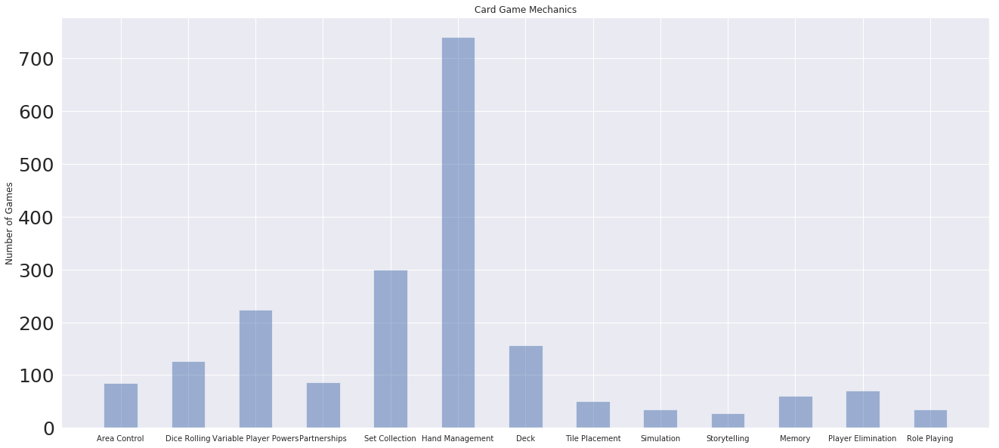

In [127]:
objects = ('Area Control', 'Dice Rolling', 'Variable Player Powers', 'Partnerships', 'Set Collection', 'Hand Management', 'Deck', 'Tile Placement', 'Simulation', 'Storytelling', 'Memory', 'Player Elimination', 'Role Playing')
y_pos = np.arange(len(objects))
performance = [85,126,224,86,299,741,157,50,35,28,60,70,35]
plt.figure(figsize=(22, 10))
plt.bar(y_pos, performance, align='center', width=.5, alpha=0.5)
plt.xticks(y_pos, objects)
plt.ylabel('Number of Games')
plt.title('Card Game Mechanics')
plt.rc('xtick', labelsize=10) 
plt.rc('ytick', labelsize=25) 

plt.show()

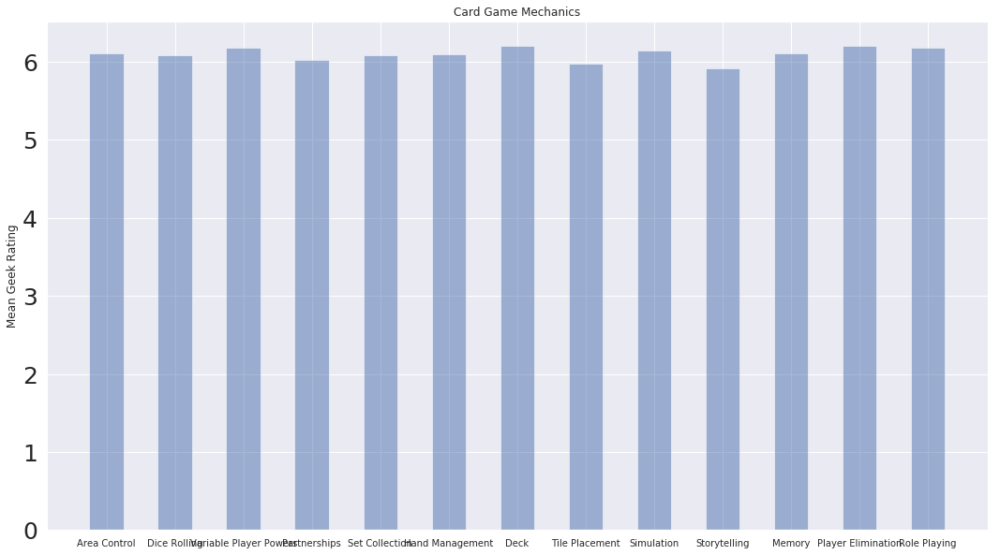

In [128]:
objects = ('Area Control', 'Dice Rolling', 'Variable Player Powers', 'Partnerships', 'Set Collection', 'Hand Management', 'Deck', 'Tile Placement', 'Simulation', 'Storytelling', 'Memory', 'Player Elimination', 'Role Playing')
y_pos = np.arange(len(objects))
performance = [6.11,6.09,6.18,6.02,6.08,6.1,6.2,5.98,6.15,5.92,6.11,6.21,6.18]
plt.figure(figsize=(18, 10))
plt.bar(y_pos, performance, align='center', width=.5, alpha=0.5)
plt.xticks(y_pos, objects)
plt.ylabel('Mean Geek Rating')
plt.title('Card Game Mechanics')
plt.rc('xtick', labelsize=10) 
plt.rc('ytick', labelsize=25) 


plt.show()

According to this bar graph, there is little difference in the average ratings of medical games that incorporate each of the mechanics analyzed in this notebook.

## Civilization Games

In [129]:
Civilization = df.groupby('Civilization')
Civilization.get_group(1)
df.head()

,Rank,Game,Min Players,Max Players,Avg Time,Min Time,Max Time,Year,Avg Rating,Geek Rating,Num Votes,Age,Mechanic,Area Control,Dice Rolling,Variable Player Powers,Partnerships,Set Collection,Hand Management,Deck,Tile Placement,Simulation,Storytelling,Memory,Player Elimination,Role Playing,Press Your Luck,owned,category,Environmental,Medical,Card Game,Civilization,Economic,Fantasy,Puzzle,TV/Movie/Radio,War,Horror,Murder/Mystery,Party Game,Trivia,Racing,Territory Building,Adventure,Dice
0,1,Pandemic Legacy: Season 1,2,4,60,60,60,2015,8.66905,8.48904,18009,13,"Action Point Allowance System, Co-operative Pl...",False,False,True,False,True,True,False,False,False,False,False,False,False,0,29472,"Environmental, Medical",True,True,False,0,0,0,0,0,0,0,0,0,0,0,0,0,0
1,2,Through the Ages: A New Story of Civilization,2,4,240,180,240,2015,8.72977,8.30744,7309,14,"Action Point Allowance System, Auction/Bidding...",False,False,False,False,False,True,False,False,False,False,False,False,False,0,10007,"Card Game, Civilization, Economic",False,False,True,1,1,0,0,0,0,0,0,0,0,0,0,0,0
2,3,Twilight Struggle,2,2,180,180,180,2005,8.35745,8.22021,27403,13,"Area Control / Area Influence, Campaign / Batt...",True,True,False,False,False,True,False,False,False,False,False,False,False,0,37382,"Modern Warfare, Political, Wargame",False,False,False,0,0,0,0,0,1,0,0,0,0,0,0,0,0
3,4,Terra Mystica,2,5,150,60,150,2012,8.29627,8.15458,24267,12,"Route/Network Building, Variable Phase Order, ...",False,False,True,False,False,False,False,False,False,False,False,False,False,0,27948,"Civilization, Economic, Fantasy, Territory Bui...",False,False,False,1,1,1,0,0,0,0,0,0,0,0,1,0,0
4,5,Gloomhaven,1,4,150,90,150,2017,9.08970,8.15151,3978,12,"Action / Movement Programming, Campaign / Batt...",False,False,True,False,False,True,False,False,False,True,False,False,False,0,6057,"Adventure, Economic, Exploration, Fantasy, Fig...",False,False,False,0,1,1,0,0,0,0,0,0,0,0,0,1,0


In [130]:
Civilization.get_group(1).shape

(162, 46)

In [131]:
pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', None)
Civilization.mean()

,Rank,Min Players,Max Players,Avg Time,Min Time,Max Time,Year,Avg Rating,Geek Rating,Num Votes,Age,Area Control,Dice Rolling,Variable Player Powers,Partnerships,Set Collection,Hand Management,Deck,Tile Placement,Simulation,Storytelling,Memory,Player Elimination,Role Playing,Press Your Luck,owned,Environmental,Medical,Card Game,Economic,Fantasy,Puzzle,TV/Movie/Radio,War,Horror,Murder/Mystery,Party Game,Trivia,Racing,Territory Building,Adventure,Dice
Civilization,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
0,2522.575563,2.031631,5.308869,103.824685,86.116394,103.432913,1995.931776,6.925357,6.054723,1649.554683,10.243539,0.11350,0.272069,0.159603,0.059334,0.142237,0.259872,0.047964,0.103577,0.06719,0.014472,0.034732,0.032045,0.028944,0.0,2481.655985,0.007236,0.003721,0.270829,0.100889,0.138516,0.0184,0.0,0.216663,0.035559,0.014058,0.061402,0.0,0.032458,0.032045,0.058921,0.069671
1,1825.938272,2.123457,4.641975,157.296296,123.617284,156.555556,2008.432099,7.130299,6.345204,3149.117284,11.561728,0.32716,0.290123,0.271605,0.030864,0.166667,0.314815,0.086420,0.166667,0.04321,0.000000,0.030864,0.012346,0.000000,0.0,4156.864198,0.018519,0.000000,0.185185,0.265432,0.067901,0.0000,0.0,0.117284,0.006173,0.000000,0.000000,0.0,0.000000,0.172840,0.006173,0.043210


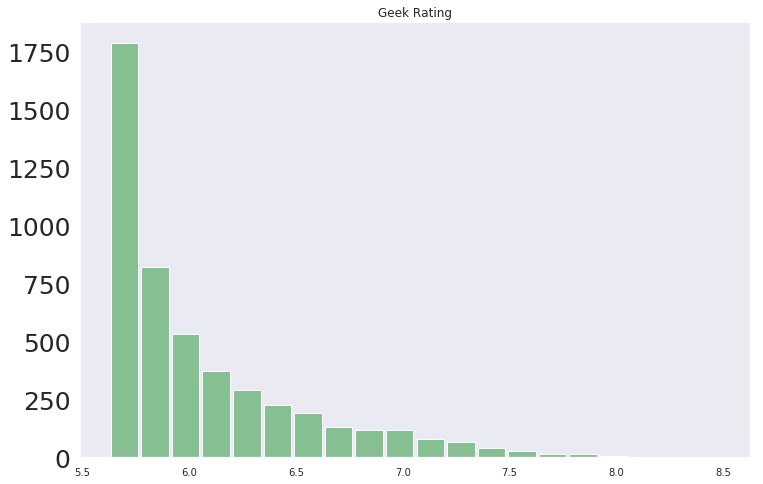

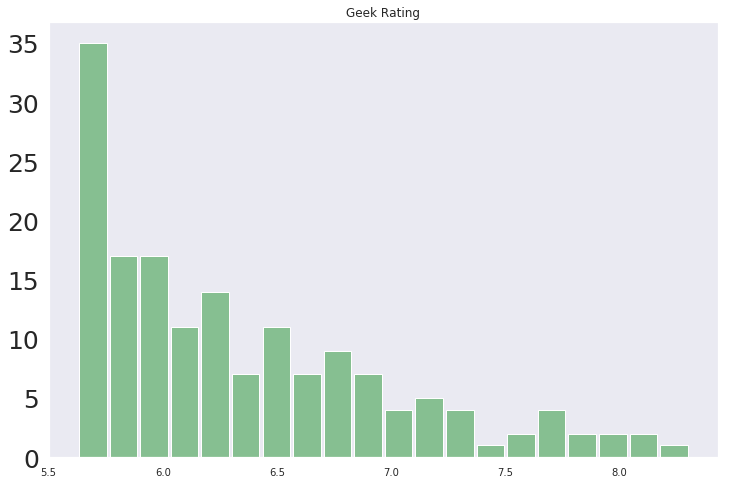

In [132]:
ax = Civilization.hist(column='Geek Rating', bins=20, grid=False, figsize=(12,8), color='#86bf91', zorder=2, rwidth=0.9)
plt.show()

Overall, the geek ratings for civilization games are distrubuted similarly to the geek ratings for all games. However, the ratings for civilivation games seem to lean slightly higher.

In [133]:
(df['Civilization'] == 1) & (df['Area Control'] == 1)

0       False
1       False
2       False
3       False
4       False
5       False
6        True
7       False
8       False
9       False
10      False
11      False
12      False
13      False
14      False
15      False
16      False
17      False
18      False
19      False
20      False
21      False
22       True
23      False
24      False
25      False
26      False
27      False
28      False
29      False
30      False
31      False
32      False
33      False
34      False
35      False
36      False
37      False
38      False
39      False
40      False
41      False
42      False
43      False
44      False
45      False
46      False
47      False
48      False
49      False
50      False
51      False
52      False
53      False
54      False
55      False
56      False
57      False
58      False
59       True
60      False
61      False
62      False
63      False
64      False
65      False
66      False
67      False
68      False
69      False
70      False
71    

In [134]:
df['Civilization'] = df['Civilization'].apply(bool)
df['Area Control'] = df['Area Control'].apply(bool)
df_sub = df.iloc[np.array(df['Civilization'] & df['Area Control'])]

In [135]:
df_sub.shape

(53, 46)

In [136]:
(df['Civilization'] == 1) & (df['Dice Rolling'] == 1)

0       False
1       False
2       False
3       False
4       False
5       False
6       False
7       False
8       False
9       False
10      False
11      False
12      False
13      False
14      False
15      False
16      False
17      False
18      False
19      False
20      False
21      False
22       True
23      False
24      False
25      False
26      False
27      False
28      False
29      False
30      False
31      False
32      False
33      False
34      False
35      False
36      False
37      False
38      False
39      False
40      False
41       True
42      False
43      False
44      False
45      False
46      False
47      False
48       True
49      False
50      False
51      False
52      False
53      False
54      False
55      False
56      False
57      False
58      False
59      False
60      False
61      False
62      False
63      False
64      False
65      False
66      False
67      False
68      False
69      False
70      False
71    

In [137]:
df['Civilization'] = df['Civilization'].apply(bool)
df['Dice Rolling'] = df['Dice Rolling'].apply(bool)
df_sub = df.iloc[np.array(df['Civilization'] & df['Dice Rolling'])]

In [138]:
df_sub.shape

(47, 46)

In [139]:
(df['Civilization'] == 1) & (df['Variable Player Powers'] == 1)

0       False
1       False
2       False
3        True
4       False
5       False
6        True
7       False
8       False
9       False
10      False
11      False
12      False
13      False
14      False
15      False
16      False
17      False
18      False
19      False
20      False
21      False
22       True
23      False
24      False
25      False
26      False
27      False
28      False
29      False
30      False
31      False
32      False
33      False
34      False
35      False
36       True
37      False
38      False
39      False
40      False
41       True
42      False
43      False
44      False
45      False
46       True
47      False
48       True
49      False
50      False
51      False
52      False
53      False
54      False
55      False
56      False
57      False
58      False
59      False
60      False
61      False
62      False
63      False
64      False
65      False
66      False
67      False
68      False
69      False
70      False
71    

In [140]:
df['Civilization'] = df['Civilization'].apply(bool)
df['Variable Player Powers'] = df['Variable Player Powers'].apply(bool)
df_sub = df.iloc[np.array(df['Civilization'] & df['Variable Player Powers'])]

In [141]:
df_sub.shape

(44, 46)

In [142]:
df['Civilization'] = df['Civilization'].apply(bool)
df['Partnerships'] = df['Partnerships'].apply(bool)
df_sub = df.iloc[np.array(df['Civilization'] & df['Partnerships'])]

In [143]:
df_sub.shape

(5, 46)

In [144]:
(df['Civilization'] == 1) & (df['Set Collection'] == 1)

0       False
1       False
2       False
3       False
4       False
5       False
6       False
7       False
8        True
9       False
10      False
11      False
12      False
13      False
14      False
15      False
16      False
17      False
18      False
19      False
20      False
21      False
22      False
23      False
24      False
25      False
26      False
27      False
28      False
29      False
30       True
31      False
32      False
33      False
34      False
35      False
36       True
37      False
38      False
39      False
40      False
41      False
42      False
43      False
44      False
45      False
46      False
47      False
48      False
49      False
50      False
51      False
52      False
53      False
54      False
55      False
56      False
57      False
58      False
59       True
60      False
61      False
62      False
63      False
64      False
65      False
66      False
67      False
68      False
69      False
70      False
71    

In [145]:
df['Civilization'] = df['Civilization'].apply(bool)
df['Set Collection'] = df['Set Collection'].apply(bool)
df_sub = df.iloc[np.array(df['Civilization'] & df['Set Collection'])]

In [146]:
df_sub.shape

(27, 46)

In [147]:
(df['Civilization'] == 1) & (df['Hand Management'] == 1)

0       False
1        True
2       False
3       False
4       False
5       False
6       False
7       False
8       False
9       False
10      False
11      False
12      False
13      False
14      False
15      False
16       True
17      False
18      False
19      False
20      False
21      False
22      False
23      False
24      False
25      False
26      False
27      False
28      False
29      False
30      False
31      False
32      False
33      False
34      False
35      False
36       True
37      False
38      False
39      False
40      False
41      False
42      False
43      False
44      False
45      False
46       True
47      False
48      False
49      False
50      False
51      False
52      False
53      False
54      False
55      False
56      False
57      False
58      False
59       True
60      False
61      False
62      False
63      False
64      False
65      False
66      False
67      False
68      False
69      False
70      False
71    

In [148]:
df['Civilization'] = df['Civilization'].apply(bool)
df['Hand Management'] = df['Hand Management'].apply(bool)
df_sub = df.iloc[np.array(df['Civilization'] & df['Hand Management'])]

In [149]:
df_sub.shape

(51, 46)

In [150]:
(df['Civilization'] == 1) & (df['Deck'] == 1)

0       False
1       False
2       False
3       False
4       False
5       False
6       False
7       False
8       False
9       False
10      False
11      False
12      False
13      False
14      False
15      False
16      False
17      False
18      False
19      False
20      False
21      False
22      False
23      False
24      False
25      False
26      False
27      False
28      False
29      False
30      False
31      False
32      False
33      False
34      False
35      False
36      False
37      False
38      False
39      False
40      False
41      False
42      False
43      False
44      False
45      False
46      False
47      False
48       True
49      False
50      False
51      False
52      False
53      False
54      False
55      False
56      False
57      False
58      False
59      False
60      False
61      False
62      False
63      False
64      False
65      False
66      False
67      False
68      False
69      False
70      False
71    

In [151]:
df['Civilization'] = df['Civilization'].apply(bool)
df['Deck'] = df['Deck'].apply(bool)
df_sub = df.iloc[np.array(df['Civilization'] & df['Deck'])]

In [152]:
df_sub.shape

(14, 46)

In [153]:
(df['Civilization'] == 1) & (df['Tile Placement'] == 1)

0       False
1       False
2       False
3       False
4       False
5       False
6       False
7       False
8       False
9       False
10      False
11      False
12      False
13      False
14      False
15      False
16      False
17      False
18      False
19      False
20      False
21      False
22       True
23      False
24      False
25      False
26      False
27      False
28      False
29      False
30      False
31      False
32      False
33      False
34      False
35      False
36      False
37      False
38      False
39      False
40      False
41      False
42      False
43      False
44      False
45      False
46      False
47      False
48      False
49      False
50      False
51      False
52      False
53      False
54      False
55      False
56      False
57      False
58      False
59       True
60      False
61      False
62      False
63      False
64      False
65      False
66      False
67      False
68      False
69      False
70      False
71    

In [154]:
df['Civilization'] = df['Civilization'].apply(bool)
df['Tile Placement'] = df['Tile Placement'].apply(bool)
df_sub = df.iloc[np.array(df['Civilization'] & df['Tile Placement'])]

In [155]:
df_sub.shape

(27, 46)

In [156]:
(df['Civilization'] == 1) & (df['Simulation'] == 1)

0       False
1       False
2       False
3       False
4       False
5       False
6       False
7       False
8       False
9       False
10      False
11      False
12      False
13      False
14      False
15      False
16      False
17      False
18      False
19      False
20      False
21      False
22      False
23      False
24      False
25      False
26      False
27      False
28      False
29      False
30      False
31      False
32      False
33      False
34      False
35      False
36      False
37      False
38      False
39      False
40      False
41      False
42      False
43      False
44      False
45      False
46      False
47      False
48      False
49      False
50      False
51      False
52      False
53      False
54      False
55      False
56      False
57      False
58      False
59      False
60      False
61      False
62      False
63      False
64      False
65      False
66      False
67      False
68      False
69      False
70      False
71    

In [157]:
df['Civilization'] = df['Civilization'].apply(bool)
df['Simulation'] = df['Simulation'].apply(bool)
df_sub = df.iloc[np.array(df['Civilization'] & df['Simulation'])]

In [158]:
df_sub.shape

(7, 46)

In [159]:
(df['Civilization'] == 1) & (df['Memory'] == 1)

0       False
1       False
2       False
3       False
4       False
5       False
6       False
7       False
8       False
9       False
10      False
11      False
12      False
13      False
14      False
15      False
16      False
17      False
18      False
19      False
20      False
21      False
22      False
23      False
24      False
25      False
26      False
27      False
28      False
29      False
30      False
31      False
32      False
33      False
34      False
35      False
36      False
37      False
38      False
39      False
40      False
41      False
42      False
43      False
44      False
45      False
46      False
47      False
48      False
49      False
50      False
51      False
52      False
53      False
54      False
55      False
56      False
57      False
58      False
59      False
60      False
61      False
62      False
63      False
64      False
65      False
66      False
67      False
68      False
69      False
70      False
71    

In [160]:
df['Civilization'] = df['Civilization'].apply(bool)
df['Memory'] = df['Memory'].apply(bool)
df_sub = df.iloc[np.array(df['Civilization'] & df['Memory'])]

In [161]:
df_sub.shape

(5, 46)

In [162]:
(df['Civilization'] == 1) & (df['Player Elimination'] == 1)

0       False
1       False
2       False
3       False
4       False
5       False
6       False
7       False
8       False
9       False
10      False
11      False
12      False
13      False
14      False
15      False
16      False
17      False
18      False
19      False
20      False
21      False
22       True
23      False
24      False
25      False
26      False
27      False
28      False
29      False
30      False
31      False
32      False
33      False
34      False
35      False
36      False
37      False
38      False
39      False
40      False
41      False
42      False
43      False
44      False
45      False
46      False
47      False
48      False
49      False
50      False
51      False
52      False
53      False
54      False
55      False
56      False
57      False
58      False
59      False
60      False
61      False
62      False
63      False
64      False
65      False
66      False
67      False
68      False
69      False
70      False
71    

In [163]:
df['Civilization'] = df['Civilization'].apply(bool)
df['Player Elimination'] = df['Player Elimination'].apply(bool)
df_sub = df.iloc[np.array(df['Civilization'] & df['Player Elimination'])]

In [164]:
df_sub.shape

(2, 46)

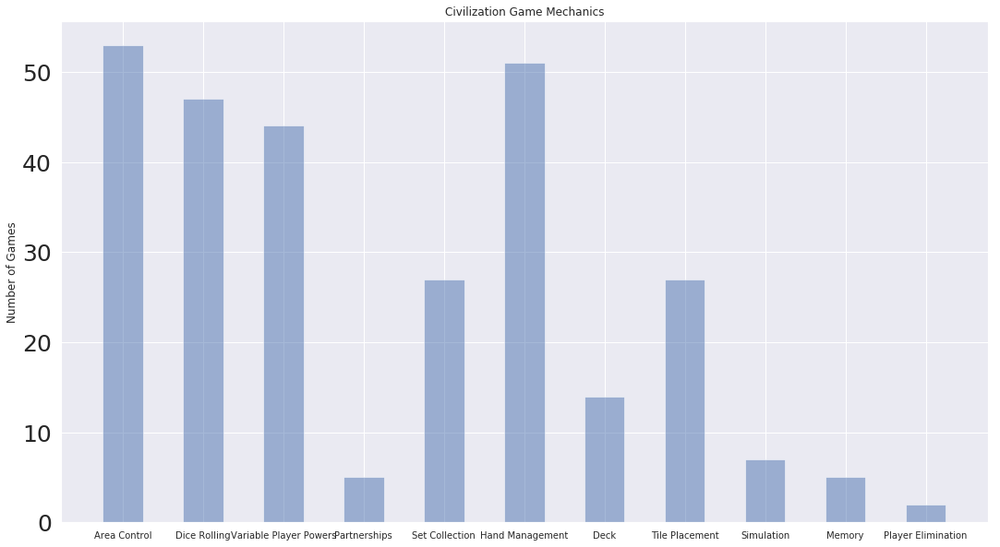

In [165]:
objects = ('Area Control', 'Dice Rolling', 'Variable Player Powers', 'Partnerships', 'Set Collection', 'Hand Management', 'Deck', 'Tile Placement', 'Simulation', 'Memory', 'Player Elimination')
y_pos = np.arange(len(objects))
performance = [53,47,44,5,27,51,14,27,7,5,2]
plt.figure(figsize=(18, 10))
plt.bar(y_pos, performance, align='center', width=.5, alpha=0.5)
plt.xticks(y_pos, objects)
plt.ylabel('Number of Games')
plt.title('Civilization Game Mechanics')
plt.rc('xtick', labelsize=10) 
plt.rc('ytick', labelsize=25) 


plt.show()

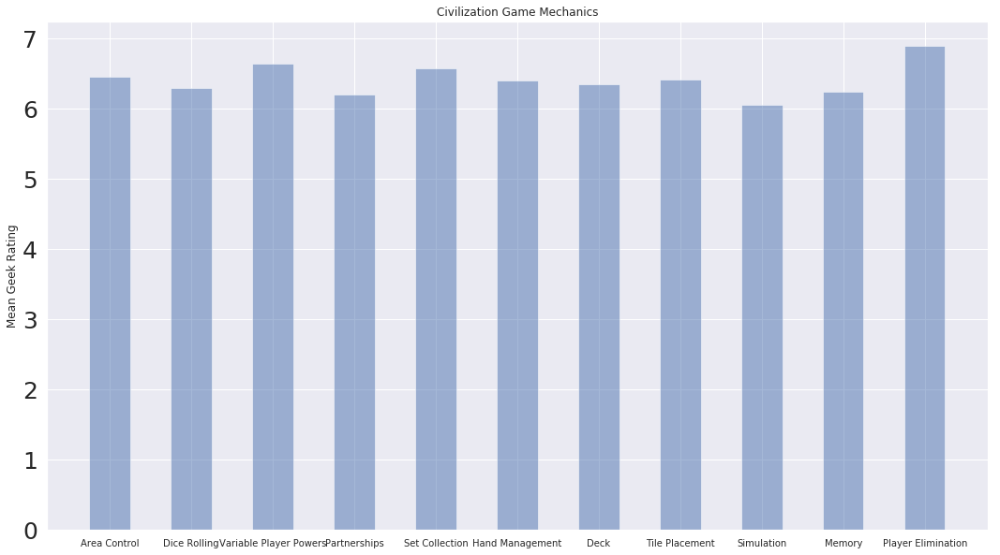

In [166]:
objects = ('Area Control', 'Dice Rolling', 'Variable Player Powers', 'Partnerships', 'Set Collection', 'Hand Management', 'Deck', 'Tile Placement', 'Simulation', 'Memory', 'Player Elimination')
y_pos = np.arange(len(objects))
performance = [6.45,6.29,6.64,6.2,6.58,6.4,6.35,6.42,6.05,6.24,6.9]
plt.figure(figsize=(18, 10))
plt.bar(y_pos, performance, align='center', width=.5, alpha=0.5)
plt.xticks(y_pos, objects)
plt.ylabel('Mean Geek Rating')
plt.title('Civilization Game Mechanics')
plt.rc('xtick', labelsize=10) 
plt.rc('ytick', labelsize=25) 


plt.show()

While there are no major differences in the average geek ratings of civilizaiton games that employ each of the game mechanics, player elimination seems to be partcularly highly rated.

## Economic Games

In [167]:
Economic = df.groupby('Economic')
Economic.get_group(1)
df.head()

,Rank,Game,Min Players,Max Players,Avg Time,Min Time,Max Time,Year,Avg Rating,Geek Rating,Num Votes,Age,Mechanic,Area Control,Dice Rolling,Variable Player Powers,Partnerships,Set Collection,Hand Management,Deck,Tile Placement,Simulation,Storytelling,Memory,Player Elimination,Role Playing,Press Your Luck,owned,category,Environmental,Medical,Card Game,Civilization,Economic,Fantasy,Puzzle,TV/Movie/Radio,War,Horror,Murder/Mystery,Party Game,Trivia,Racing,Territory Building,Adventure,Dice
0,1,Pandemic Legacy: Season 1,2,4,60,60,60,2015,8.66905,8.48904,18009,13,"Action Point Allowance System, Co-operative Pl...",False,False,True,False,True,True,False,False,False,False,False,False,False,0,29472,"Environmental, Medical",True,True,False,False,0,0,0,0,0,0,0,0,0,0,0,0,0
1,2,Through the Ages: A New Story of Civilization,2,4,240,180,240,2015,8.72977,8.30744,7309,14,"Action Point Allowance System, Auction/Bidding...",False,False,False,False,False,True,False,False,False,False,False,False,False,0,10007,"Card Game, Civilization, Economic",False,False,True,True,1,0,0,0,0,0,0,0,0,0,0,0,0
2,3,Twilight Struggle,2,2,180,180,180,2005,8.35745,8.22021,27403,13,"Area Control / Area Influence, Campaign / Batt...",True,True,False,False,False,True,False,False,False,False,False,False,False,0,37382,"Modern Warfare, Political, Wargame",False,False,False,False,0,0,0,0,1,0,0,0,0,0,0,0,0
3,4,Terra Mystica,2,5,150,60,150,2012,8.29627,8.15458,24267,12,"Route/Network Building, Variable Phase Order, ...",False,False,True,False,False,False,False,False,False,False,False,False,False,0,27948,"Civilization, Economic, Fantasy, Territory Bui...",False,False,False,True,1,1,0,0,0,0,0,0,0,0,1,0,0
4,5,Gloomhaven,1,4,150,90,150,2017,9.08970,8.15151,3978,12,"Action / Movement Programming, Campaign / Batt...",False,False,True,False,False,True,False,False,False,True,False,False,False,0,6057,"Adventure, Economic, Exploration, Fantasy, Fig...",False,False,False,False,1,1,0,0,0,0,0,0,0,0,0,1,0


In [168]:
Economic.get_group(1).shape

(531, 46)

In [169]:
pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', None)
Economic.mean()

,Rank,Min Players,Max Players,Avg Time,Min Time,Max Time,Year,Avg Rating,Geek Rating,Num Votes,Age,Area Control,Dice Rolling,Variable Player Powers,Partnerships,Set Collection,Hand Management,Deck,Tile Placement,Simulation,Storytelling,Memory,Player Elimination,Role Playing,Press Your Luck,owned,Environmental,Medical,Card Game,Civilization,Fantasy,Puzzle,TV/Movie/Radio,War,Horror,Murder/Mystery,Party Game,Trivia,Racing,Territory Building,Adventure,Dice
Economic,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
0,2573.044539,2.025739,5.338183,101.249329,84.241495,100.831916,1995.086392,6.911743,6.035546,1604.204566,10.140779,0.111459,0.285139,0.169875,0.062220,0.134736,0.267681,0.051477,0.093778,0.068935,0.015219,0.036482,0.033572,0.030886,0.0,2461.170770,0.006938,0.003581,0.282901,0.026634,0.147269,0.019248,0.0,0.233662,0.038496,0.015219,0.066249,0.0,0.034691,0.032005,0.062668,0.072292
1,1885.380414,2.109228,4.858757,141.807910,113.333333,141.525424,2006.858757,7.102440,6.304703,2488.638418,11.510358,0.195857,0.167608,0.107345,0.026365,0.212806,0.210923,0.030132,0.205273,0.045198,0.003766,0.018832,0.013183,0.003766,0.0,3165.105461,0.013183,0.003766,0.143126,0.080979,0.043315,0.005650,0.0,0.043315,0.001883,0.000000,0.001883,0.0,0.003766,0.075330,0.011299,0.039548


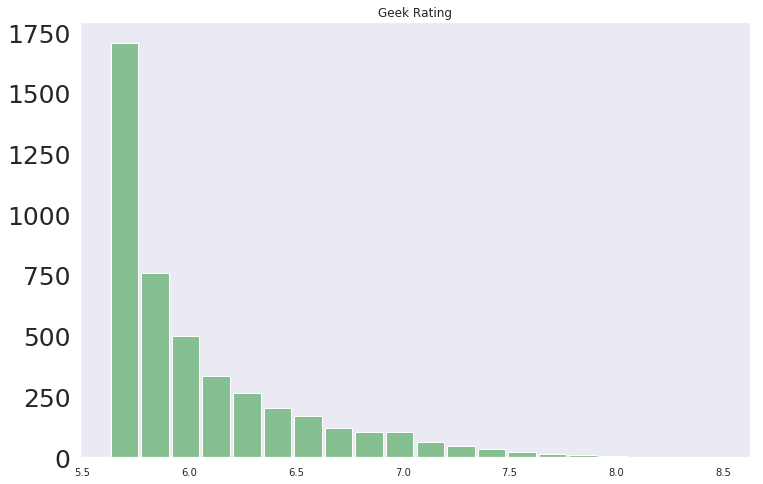

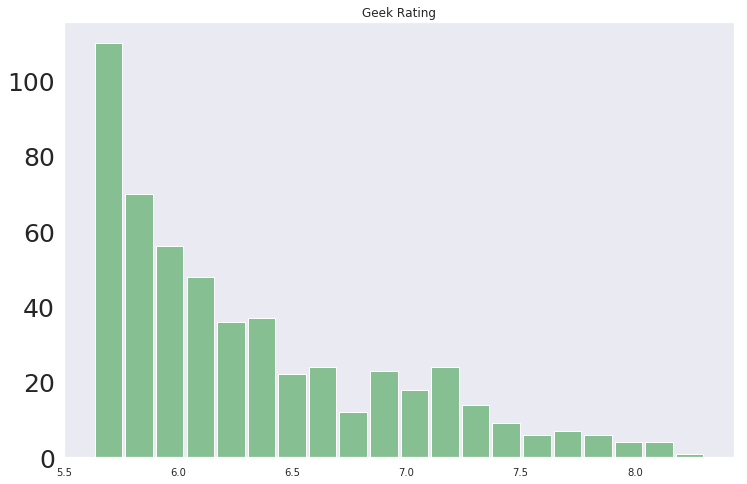

In [170]:
ax = Economic.hist(column='Geek Rating', bins=20, grid=False, figsize=(12,8), color='#86bf91', zorder=2, rwidth=0.9)
plt.show()

The distribution of ratings for economic games appears to be similar to the distribution of ratings for all games with a slightly larger proportion of games with scores around 7. 

In [171]:
(df['Economic'] == 1) & (df['Area Control'] == 1)

0       False
1       False
2       False
3       False
4       False
5       False
6        True
7       False
8       False
9       False
10      False
11      False
12      False
13      False
14      False
15      False
16      False
17      False
18      False
19      False
20      False
21      False
22      False
23      False
24      False
25      False
26      False
27      False
28      False
29      False
30      False
31      False
32      False
33      False
34      False
35      False
36      False
37      False
38      False
39      False
40      False
41      False
42      False
43      False
44      False
45      False
46      False
47      False
48      False
49      False
50      False
51      False
52      False
53      False
54      False
55      False
56       True
57      False
58      False
59      False
60      False
61      False
62       True
63      False
64      False
65      False
66      False
67      False
68      False
69      False
70      False
71    

In [172]:
df['Economic'] = df['Economic'].apply(bool)
df['Area Control'] = df['Area Control'].apply(bool)
df_sub = df.iloc[np.array(df['Economic'] & df['Area Control'])]

In [173]:
df_sub.shape

(104, 46)

In [174]:
(df['Economic'] == 1) & (df['Dice Rolling'] == 1)

0       False
1       False
2       False
3       False
4       False
5       False
6       False
7       False
8       False
9       False
10      False
11      False
12      False
13      False
14      False
15      False
16      False
17      False
18      False
19      False
20      False
21      False
22      False
23      False
24      False
25      False
26      False
27      False
28      False
29      False
30      False
31      False
32      False
33      False
34      False
35      False
36      False
37       True
38      False
39      False
40      False
41      False
42       True
43      False
44      False
45      False
46      False
47      False
48       True
49      False
50      False
51      False
52      False
53      False
54      False
55      False
56      False
57      False
58      False
59      False
60      False
61      False
62       True
63      False
64      False
65      False
66      False
67      False
68      False
69      False
70      False
71    

In [175]:
df['Economic'] = df['Economic'].apply(bool)
df['Dice Rolling'] = df['Dice Rolling'].apply(bool)
df_sub = df.iloc[np.array(df['Economic'] & df['Dice Rolling'])]

In [176]:
df_sub.shape

(89, 46)

In [177]:
(df['Economic'] == 1) & (df['Variable Player Powers'] == 1)

0       False
1       False
2       False
3        True
4        True
5       False
6        True
7        True
8       False
9       False
10      False
11      False
12      False
13       True
14      False
15      False
16      False
17      False
18      False
19      False
20      False
21      False
22      False
23      False
24      False
25      False
26      False
27      False
28      False
29      False
30      False
31      False
32      False
33      False
34      False
35      False
36      False
37       True
38      False
39      False
40      False
41      False
42      False
43      False
44      False
45      False
46       True
47      False
48       True
49      False
50      False
51      False
52      False
53      False
54      False
55      False
56       True
57      False
58      False
59      False
60      False
61      False
62      False
63      False
64      False
65      False
66      False
67      False
68      False
69      False
70      False
71    

In [178]:
df['Economic'] = df['Economic'].apply(bool)
df['Variable Player Powers'] = df['Variable Player Powers'].apply(bool)
df_sub = df.iloc[np.array(df['Economic'] & df['Variable Player Powers'])]

In [179]:
df_sub.shape

(57, 46)

In [180]:
(df['Economic'] == 1) & (df['Partnerships'] == 1)

0       False
1       False
2       False
3       False
4       False
5       False
6       False
7       False
8       False
9       False
10      False
11      False
12      False
13      False
14      False
15      False
16      False
17      False
18      False
19      False
20      False
21      False
22      False
23      False
24      False
25      False
26      False
27      False
28      False
29      False
30      False
31      False
32      False
33      False
34      False
35      False
36      False
37      False
38      False
39      False
40      False
41      False
42      False
43      False
44      False
45      False
46      False
47      False
48      False
49      False
50      False
51      False
52      False
53      False
54      False
55      False
56      False
57      False
58      False
59      False
60      False
61      False
62      False
63      False
64      False
65      False
66      False
67      False
68      False
69      False
70      False
71    

In [181]:
df['Economic'] = df['Economic'].apply(bool)
df['Partnerships'] = df['Partnerships'].apply(bool)
df_sub = df.iloc[np.array(df['Economic'] & df['Partnerships'])]

In [182]:
df_sub.shape

(14, 46)

In [183]:
(df['Economic'] == 1) & (df['Set Collection'] == 1)

0       False
1       False
2       False
3       False
4       False
5       False
6       False
7       False
8       False
9       False
10      False
11      False
12      False
13      False
14      False
15      False
16      False
17      False
18      False
19      False
20      False
21      False
22      False
23      False
24      False
25      False
26      False
27      False
28      False
29      False
30       True
31      False
32      False
33      False
34      False
35       True
36      False
37       True
38      False
39      False
40      False
41      False
42      False
43      False
44      False
45      False
46      False
47      False
48      False
49      False
50      False
51      False
52      False
53      False
54      False
55      False
56      False
57      False
58      False
59      False
60      False
61      False
62      False
63      False
64      False
65      False
66      False
67      False
68      False
69      False
70      False
71    

In [184]:
df['Economic'] = df['Economic'].apply(bool)
df['Set Collection'] = df['Set Collection'].apply(bool)
df_sub = df.iloc[np.array(df['Economic'] & df['Set Collection'])]

In [185]:
df_sub.shape

(113, 46)

In [186]:
(df['Economic'] == 1) & (df['Hand Management'] == 1)

0       False
1        True
2       False
3       False
4        True
5       False
6       False
7        True
8       False
9       False
10      False
11      False
12      False
13       True
14      False
15      False
16       True
17      False
18      False
19      False
20      False
21      False
22      False
23      False
24      False
25      False
26      False
27       True
28      False
29      False
30      False
31      False
32      False
33       True
34       True
35      False
36      False
37      False
38      False
39      False
40      False
41      False
42      False
43      False
44      False
45      False
46       True
47      False
48      False
49      False
50      False
51      False
52      False
53      False
54      False
55      False
56       True
57      False
58      False
59      False
60      False
61      False
62      False
63      False
64      False
65      False
66      False
67      False
68      False
69      False
70      False
71    

In [187]:
df['Economic'] = df['Economic'].apply(bool)
df['Hand Management'] = df['Hand Management'].apply(bool)
df_sub = df.iloc[np.array(df['Economic'] & df['Hand Management'])]

In [188]:
df_sub.shape

(112, 46)

In [189]:
(df['Economic'] == 1) & (df['Deck'] == 1)

0       False
1       False
2       False
3       False
4       False
5       False
6       False
7       False
8       False
9       False
10      False
11      False
12      False
13      False
14      False
15      False
16      False
17      False
18      False
19      False
20      False
21      False
22      False
23      False
24      False
25      False
26      False
27      False
28      False
29      False
30      False
31      False
32      False
33      False
34       True
35      False
36      False
37      False
38      False
39      False
40      False
41      False
42      False
43      False
44      False
45      False
46      False
47      False
48       True
49      False
50      False
51      False
52      False
53      False
54      False
55      False
56       True
57      False
58      False
59      False
60      False
61      False
62      False
63      False
64      False
65      False
66      False
67      False
68      False
69      False
70      False
71    

In [190]:
df['Economic'] = df['Economic'].apply(bool)
df['Deck'] = df['Deck'].apply(bool)
df_sub = df.iloc[np.array(df['Economic'] & df['Deck'])]

In [191]:
df_sub.shape

(16, 46)

In [192]:
(df['Economic'] == 1) & (df['Tile Placement'] == 1)

0       False
1       False
2       False
3       False
4       False
5       False
6       False
7        True
8       False
9        True
10      False
11      False
12      False
13      False
14      False
15      False
16      False
17      False
18      False
19      False
20      False
21      False
22      False
23      False
24      False
25      False
26      False
27      False
28      False
29      False
30      False
31      False
32      False
33      False
34      False
35       True
36      False
37      False
38      False
39      False
40      False
41      False
42       True
43      False
44      False
45      False
46      False
47      False
48      False
49      False
50      False
51      False
52      False
53      False
54      False
55      False
56      False
57      False
58      False
59      False
60      False
61      False
62      False
63      False
64      False
65      False
66      False
67      False
68      False
69      False
70      False
71    

In [193]:
df['Economic'] = df['Economic'].apply(bool)
df['Tile Placement'] = df['Tile Placement'].apply(bool)
df_sub = df.iloc[np.array(df['Economic'] & df['Tile Placement'])]

In [194]:
df_sub.shape

(109, 46)

In [195]:
(df['Economic'] == 1) & (df['Simulation'] == 1)

0       False
1       False
2       False
3       False
4       False
5       False
6       False
7       False
8       False
9       False
10      False
11      False
12      False
13      False
14      False
15      False
16      False
17      False
18      False
19      False
20      False
21      False
22      False
23      False
24      False
25      False
26      False
27      False
28      False
29      False
30      False
31      False
32      False
33      False
34      False
35      False
36      False
37      False
38      False
39      False
40      False
41      False
42      False
43      False
44      False
45      False
46      False
47      False
48      False
49      False
50      False
51      False
52      False
53      False
54      False
55      False
56      False
57      False
58      False
59      False
60      False
61      False
62      False
63      False
64      False
65      False
66      False
67      False
68      False
69      False
70      False
71    

In [196]:
df['Economic'] = df['Economic'].apply(bool)
df['Simulation'] = df['Simulation'].apply(bool)
df_sub = df.iloc[np.array(df['Economic'] & df['Simulation'])]

In [197]:
df_sub.shape

(24, 46)

In [198]:
(df['Economic'] == 1) & (df['Storytelling'] == 1)

0       False
1       False
2       False
3       False
4        True
5       False
6       False
7       False
8       False
9       False
10      False
11      False
12      False
13      False
14      False
15      False
16      False
17      False
18      False
19      False
20      False
21      False
22      False
23      False
24      False
25      False
26      False
27      False
28      False
29      False
30      False
31      False
32      False
33      False
34      False
35      False
36      False
37      False
38      False
39      False
40      False
41      False
42      False
43      False
44      False
45      False
46      False
47      False
48      False
49      False
50      False
51      False
52      False
53      False
54      False
55      False
56      False
57      False
58      False
59      False
60      False
61      False
62      False
63      False
64      False
65      False
66      False
67      False
68      False
69      False
70      False
71    

In [199]:
df['Economic'] = df['Economic'].apply(bool)
df['Storytelling'] = df['Storytelling'].apply(bool)
df_sub = df.iloc[np.array(df['Economic'] & df['Storytelling'])]

In [200]:
df_sub.shape

(2, 46)

In [201]:
(df['Economic'] == 1) & (df['Memory'] == 1)

0       False
1       False
2       False
3       False
4       False
5       False
6       False
7       False
8       False
9       False
10      False
11      False
12      False
13      False
14      False
15      False
16      False
17      False
18      False
19      False
20      False
21      False
22      False
23      False
24      False
25      False
26      False
27      False
28      False
29      False
30      False
31      False
32      False
33      False
34      False
35       True
36      False
37      False
38      False
39      False
40      False
41      False
42      False
43      False
44      False
45      False
46      False
47      False
48      False
49      False
50      False
51      False
52      False
53      False
54      False
55      False
56      False
57      False
58      False
59      False
60      False
61      False
62      False
63      False
64      False
65      False
66      False
67      False
68      False
69      False
70      False
71    

In [202]:
df['Economic'] = df['Economic'].apply(bool)
df['Memory'] = df['Memory'].apply(bool)
df_sub = df.iloc[np.array(df['Economic'] & df['Memory'])]

In [203]:
df_sub.shape

(10, 46)

In [204]:
(df['Economic'] == 1) & (df['Player Elimination'] == 1)

0       False
1       False
2       False
3       False
4       False
5       False
6       False
7       False
8       False
9       False
10      False
11      False
12      False
13      False
14      False
15      False
16      False
17      False
18      False
19      False
20      False
21      False
22      False
23      False
24      False
25      False
26      False
27      False
28      False
29      False
30      False
31      False
32      False
33      False
34      False
35      False
36      False
37      False
38      False
39      False
40      False
41      False
42      False
43      False
44      False
45      False
46      False
47      False
48      False
49      False
50      False
51      False
52      False
53      False
54      False
55      False
56      False
57      False
58      False
59      False
60      False
61      False
62      False
63      False
64      False
65      False
66      False
67      False
68      False
69      False
70      False
71    

In [205]:
df['Economic'] = df['Economic'].apply(bool)
df['Player Elimination'] = df['Player Elimination'].apply(bool)
df_sub = df.iloc[np.array(df['Economic'] & df['Player Elimination'])]

In [206]:
df_sub.shape

(7, 46)

In [207]:
(df['Economic'] == 1) & (df['Role Playing'] == 1)

0       False
1       False
2       False
3       False
4       False
5       False
6       False
7       False
8       False
9       False
10      False
11      False
12      False
13      False
14      False
15      False
16      False
17      False
18      False
19      False
20      False
21      False
22      False
23      False
24      False
25      False
26      False
27      False
28      False
29      False
30      False
31      False
32      False
33      False
34      False
35      False
36      False
37      False
38      False
39      False
40      False
41      False
42      False
43      False
44      False
45      False
46      False
47      False
48      False
49      False
50      False
51      False
52      False
53      False
54      False
55      False
56      False
57      False
58      False
59      False
60      False
61      False
62      False
63      False
64      False
65      False
66      False
67      False
68      False
69      False
70      False
71    

In [208]:
df['Economic'] = df['Economic'].apply(bool)
df['Role Playing'] = df['Role Playing'].apply(bool)
df_sub = df.iloc[np.array(df['Economic'] & df['Role Playing'])]

In [209]:
df_sub.shape

(2, 46)

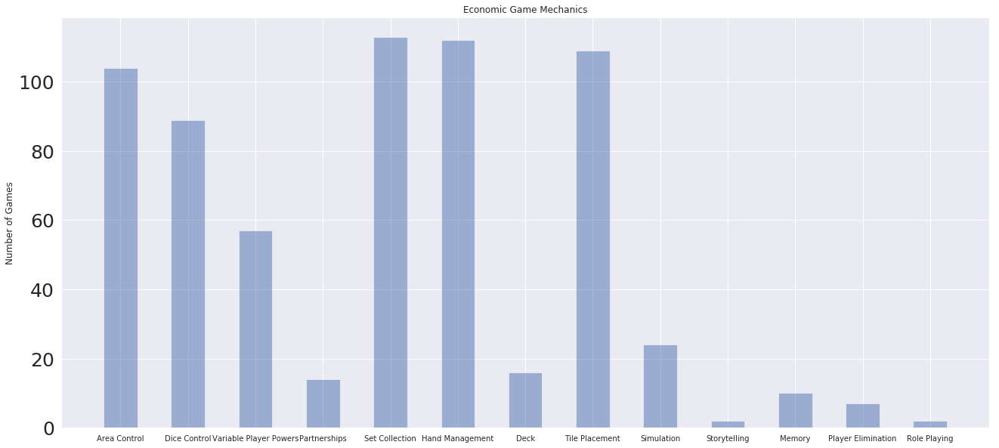

In [210]:
objects = ('Area Control', 'Dice Control', 'Variable Player Powers', 'Partnerships', 'Set Collection', 'Hand Management', 'Deck', 'Tile Placement', 'Simulation', 'Storytelling', 'Memory', 'Player Elimination', 'Role Playing')
y_pos = np.arange(len(objects))
performance = [104,89,57,14,113,112,16,109,24,2,10,7,2]
plt.figure(figsize=(22, 10))
plt.bar(y_pos, performance, align='center', width=.5, alpha=0.5)
plt.xticks(y_pos, objects)
plt.ylabel('Number of Games')
plt.title('Economic Game Mechanics')
plt.rc('xtick', labelsize=10) 
plt.rc('ytick', labelsize=25) 


plt.show()

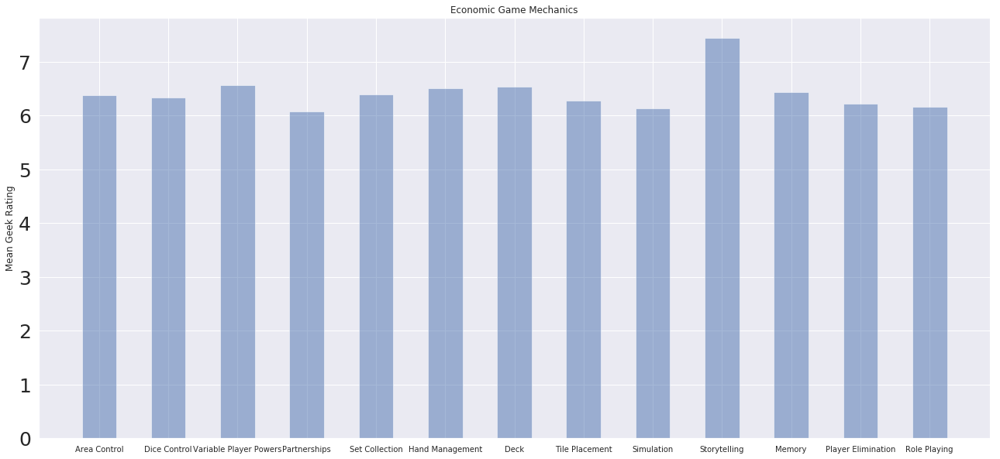

In [211]:
objects = ('Area Control', 'Dice Control', 'Variable Player Powers', 'Partnerships', 'Set Collection', 'Hand Management', 'Deck', 'Tile Placement', 'Simulation', 'Storytelling', 'Memory', 'Player Elimination', 'Role Playing')
y_pos = np.arange(len(objects))
performance = [6.38,6.33,6.57,6.08,6.39,6.51,6.54,6.28,6.13,7.45,6.44,6.22,6.17]
plt.figure(figsize=(22, 10))
plt.bar(y_pos, performance, align='center', width=.5, alpha=0.5)
plt.xticks(y_pos, objects)
plt.ylabel('Mean Geek Rating')
plt.title('Economic Game Mechanics')
plt.rc('xtick', labelsize=10) 
plt.rc('ytick', labelsize=25) 


plt.show()

Storytelling appears to be one of the highest rated mechanics for economic games while simulations and partnerships appear to be some of the lowest.

## Fantasy Games

In [212]:
Fantasy = df.groupby('Fantasy')
Fantasy.get_group(1)
df.head()

,Rank,Game,Min Players,Max Players,Avg Time,Min Time,Max Time,Year,Avg Rating,Geek Rating,Num Votes,Age,Mechanic,Area Control,Dice Rolling,Variable Player Powers,Partnerships,Set Collection,Hand Management,Deck,Tile Placement,Simulation,Storytelling,Memory,Player Elimination,Role Playing,Press Your Luck,owned,category,Environmental,Medical,Card Game,Civilization,Economic,Fantasy,Puzzle,TV/Movie/Radio,War,Horror,Murder/Mystery,Party Game,Trivia,Racing,Territory Building,Adventure,Dice
0,1,Pandemic Legacy: Season 1,2,4,60,60,60,2015,8.66905,8.48904,18009,13,"Action Point Allowance System, Co-operative Pl...",False,False,True,False,True,True,False,False,False,False,False,False,False,0,29472,"Environmental, Medical",True,True,False,False,False,0,0,0,0,0,0,0,0,0,0,0,0
1,2,Through the Ages: A New Story of Civilization,2,4,240,180,240,2015,8.72977,8.30744,7309,14,"Action Point Allowance System, Auction/Bidding...",False,False,False,False,False,True,False,False,False,False,False,False,False,0,10007,"Card Game, Civilization, Economic",False,False,True,True,True,0,0,0,0,0,0,0,0,0,0,0,0
2,3,Twilight Struggle,2,2,180,180,180,2005,8.35745,8.22021,27403,13,"Area Control / Area Influence, Campaign / Batt...",True,True,False,False,False,True,False,False,False,False,False,False,False,0,37382,"Modern Warfare, Political, Wargame",False,False,False,False,False,0,0,0,1,0,0,0,0,0,0,0,0
3,4,Terra Mystica,2,5,150,60,150,2012,8.29627,8.15458,24267,12,"Route/Network Building, Variable Phase Order, ...",False,False,True,False,False,False,False,False,False,False,False,False,False,0,27948,"Civilization, Economic, Fantasy, Territory Bui...",False,False,False,True,True,1,0,0,0,0,0,0,0,0,1,0,0
4,5,Gloomhaven,1,4,150,90,150,2017,9.08970,8.15151,3978,12,"Action / Movement Programming, Campaign / Batt...",False,False,True,False,False,True,False,False,False,True,False,False,False,0,6057,"Adventure, Economic, Exploration, Fantasy, Fig...",False,False,False,False,True,1,0,0,0,0,0,0,0,0,0,1,0


In [213]:
Fantasy.get_group(1).shape

(681, 46)

In [214]:
pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', None)
Fantasy.mean()

,Rank,Min Players,Max Players,Avg Time,Min Time,Max Time,Year,Avg Rating,Geek Rating,Num Votes,Age,Area Control,Dice Rolling,Variable Player Powers,Partnerships,Set Collection,Hand Management,Deck,Tile Placement,Simulation,Storytelling,Memory,Player Elimination,Role Playing,Press Your Luck,owned,Environmental,Medical,Card Game,Civilization,Economic,Puzzle,TV/Movie/Radio,War,Horror,Murder/Mystery,Party Game,Trivia,Racing,Territory Building,Adventure,Dice
Fantasy,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
0,2542.510653,2.056971,5.382121,110.422186,91.533117,110.084067,1994.369384,6.922436,6.049393,1619.866142,10.180639,0.120426,0.255211,0.118805,0.057897,0.146132,0.237842,0.034738,0.110236,0.075961,0.012969,0.034970,0.027327,0.015516,0.0,2388.601436,0.008569,0.004169,0.248726,0.034970,0.117647,0.018527,0.0,0.229041,0.029643,0.014358,0.064613,0.0,0.033580,0.038212,0.029180,0.064382
1,2230.453744,1.892805,4.685756,74.712188,60.691630,73.897210,2008.812041,6.992632,6.157616,2194.524229,10.955947,0.120411,0.383260,0.444934,0.061674,0.123348,0.412628,0.140969,0.076358,0.005874,0.020558,0.032305,0.057269,0.107195,0.0,3470.192364,0.001468,0.000000,0.390602,0.016153,0.033774,0.013216,0.0,0.114537,0.066079,0.008811,0.026432,0.0,0.017621,0.026432,0.234949,0.096916


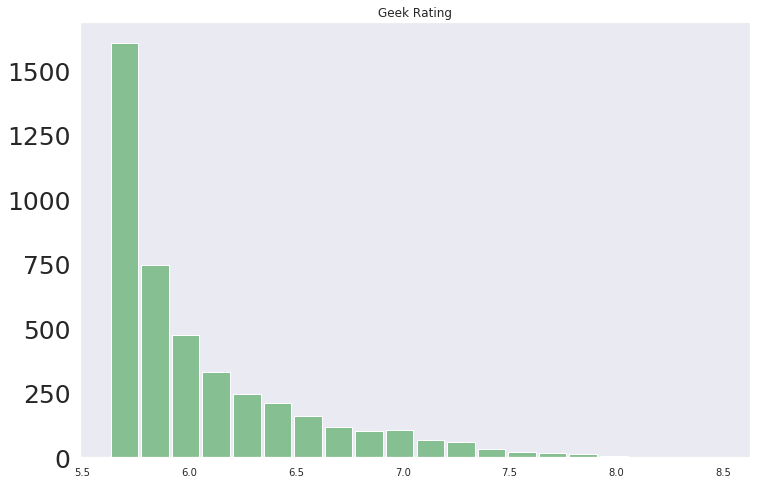

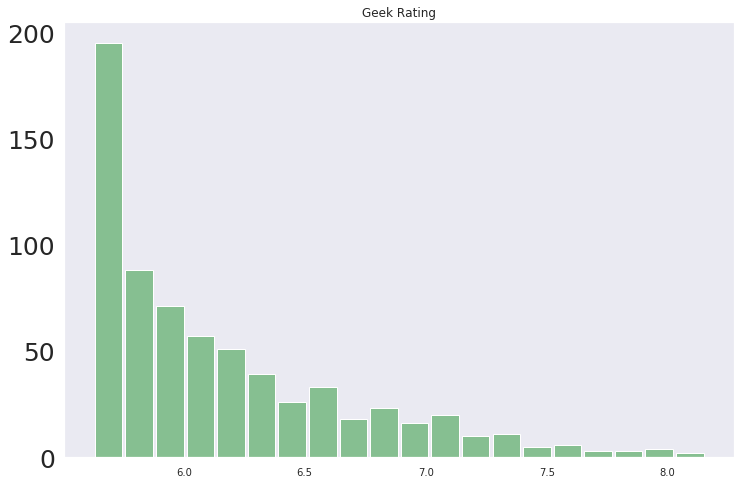

In [215]:
ax = Fantasy.hist(column='Geek Rating', bins=20, grid=False, figsize=(12,8), color='#86bf91', zorder=2, rwidth=0.9)
plt.show()

The distribution of fantasy game ratings closely remsembles the distribution of all games in the dataset.

In [216]:
(df['Fantasy'] == 1) & (df['Area Control'] == 1)

0       False
1       False
2       False
3       False
4       False
5       False
6       False
7       False
8       False
9       False
10      False
11      False
12       True
13      False
14      False
15       True
16      False
17      False
18      False
19      False
20      False
21      False
22      False
23      False
24      False
25      False
26      False
27      False
28      False
29      False
30      False
31      False
32      False
33      False
34      False
35      False
36      False
37      False
38      False
39      False
40      False
41      False
42      False
43      False
44      False
45      False
46      False
47       True
48      False
49      False
50      False
51      False
52      False
53      False
54      False
55      False
56      False
57      False
58      False
59      False
60      False
61      False
62      False
63      False
64      False
65      False
66       True
67      False
68      False
69      False
70       True
71    

In [217]:
df['Fantasy'] = df['Fantasy'].apply(bool)
df['Area Control'] = df['Area Control'].apply(bool)
df_sub = df.iloc[np.array(df['Fantasy'] & df['Area Control'])]

In [218]:
df_sub.shape

(82, 46)

In [219]:
(df['Fantasy'] == 1) & (df['Dice Rolling'] == 1)

0       False
1       False
2       False
3       False
4       False
5       False
6       False
7       False
8       False
9       False
10      False
11      False
12       True
13      False
14       True
15      False
16      False
17      False
18      False
19       True
20      False
21       True
22      False
23      False
24      False
25      False
26      False
27      False
28      False
29      False
30      False
31      False
32      False
33      False
34      False
35      False
36      False
37      False
38      False
39       True
40      False
41      False
42      False
43      False
44      False
45      False
46      False
47      False
48      False
49      False
50      False
51      False
52      False
53      False
54      False
55      False
56      False
57      False
58      False
59      False
60      False
61      False
62      False
63       True
64      False
65      False
66       True
67      False
68       True
69      False
70      False
71    

In [220]:
df['Fantasy'] = df['Fantasy'].apply(bool)
df['Dice Rolling'] = df['Dice Rolling'].apply(bool)
df_sub = df.iloc[np.array(df['Fantasy'] & df['Dice Rolling'])]

In [221]:
df_sub.shape

(261, 46)

In [222]:
(df['Fantasy'] == 1) & (df['Variable Player Powers'] == 1)

0       False
1       False
2       False
3        True
4        True
5       False
6       False
7       False
8       False
9       False
10      False
11      False
12      False
13      False
14       True
15      False
16      False
17      False
18      False
19       True
20      False
21       True
22      False
23       True
24      False
25      False
26      False
27      False
28      False
29      False
30      False
31      False
32      False
33      False
34      False
35      False
36      False
37      False
38      False
39       True
40      False
41      False
42      False
43      False
44      False
45      False
46      False
47      False
48      False
49      False
50      False
51      False
52      False
53      False
54      False
55      False
56      False
57      False
58      False
59      False
60      False
61      False
62      False
63       True
64      False
65      False
66      False
67       True
68       True
69      False
70       True
71    

In [223]:
df['Fantasy'] = df['Fantasy'].apply(bool)
df['Variable Player Powers'] = df['Variable Player Powers'].apply(bool)
df_sub = df.iloc[np.array(df['Fantasy'] & df['Variable Player Powers'])]

In [224]:
df_sub.shape

(303, 46)

In [225]:
(df['Fantasy'] == 1) & (df['Partnerships'] == 1)

0       False
1       False
2       False
3       False
4       False
5       False
6       False
7       False
8       False
9       False
10      False
11      False
12      False
13      False
14      False
15      False
16      False
17      False
18      False
19       True
20      False
21      False
22      False
23      False
24      False
25      False
26      False
27      False
28      False
29      False
30      False
31      False
32      False
33      False
34      False
35      False
36      False
37      False
38      False
39      False
40      False
41      False
42      False
43      False
44      False
45      False
46      False
47      False
48      False
49      False
50      False
51      False
52      False
53      False
54      False
55      False
56      False
57      False
58      False
59      False
60      False
61      False
62      False
63       True
64      False
65      False
66      False
67       True
68      False
69      False
70      False
71    

In [226]:
df['Fantasy'] = df['Fantasy'].apply(bool)
df['Partnerships'] = df['Partnerships'].apply(bool)
df_sub = df.iloc[np.array(df['Fantasy'] & df['Partnerships'])]

In [227]:
df_sub.shape

(42, 46)

In [228]:
(df['Fantasy'] == 1) & (df['Set Collection'] == 1)

0       False
1       False
2       False
3       False
4       False
5       False
6       False
7       False
8       False
9       False
10      False
11      False
12      False
13      False
14      False
15      False
16      False
17      False
18      False
19      False
20      False
21      False
22      False
23      False
24      False
25      False
26      False
27      False
28      False
29      False
30      False
31      False
32      False
33      False
34      False
35      False
36      False
37      False
38      False
39      False
40      False
41      False
42      False
43      False
44      False
45       True
46      False
47       True
48      False
49      False
50      False
51      False
52      False
53      False
54      False
55      False
56      False
57      False
58      False
59      False
60      False
61      False
62      False
63      False
64      False
65      False
66      False
67      False
68      False
69      False
70      False
71    

In [229]:
df['Fantasy'] = df['Fantasy'].apply(bool)
df['Set Collection'] = df['Set Collection'].apply(bool)
df_sub = df.iloc[np.array(df['Fantasy'] & df['Set Collection'])]

In [230]:
df_sub.shape

(84, 46)

In [231]:
(df['Fantasy'] == 1) & (df['Hand Management'] == 1)

0       False
1       False
2       False
3       False
4        True
5       False
6       False
7       False
8       False
9       False
10      False
11      False
12       True
13      False
14       True
15       True
16      False
17      False
18      False
19       True
20      False
21      False
22      False
23       True
24      False
25      False
26      False
27      False
28      False
29      False
30      False
31      False
32      False
33      False
34      False
35      False
36      False
37      False
38      False
39      False
40      False
41      False
42      False
43      False
44      False
45      False
46      False
47      False
48      False
49      False
50      False
51      False
52      False
53      False
54      False
55      False
56      False
57      False
58      False
59      False
60      False
61      False
62      False
63       True
64      False
65      False
66       True
67      False
68      False
69      False
70       True
71    

In [232]:
df['Fantasy'] = df['Fantasy'].apply(bool)
df['Hand Management'] = df['Hand Management'].apply(bool)
df_sub = df.iloc[np.array(df['Fantasy'] & df['Hand Management'])]

In [233]:
df_sub.shape

(281, 46)

In [234]:
(df['Fantasy'] == 1) & (df['Deck'] == 1)

0       False
1       False
2       False
3       False
4       False
5       False
6       False
7       False
8       False
9       False
10      False
11      False
12      False
13      False
14       True
15      False
16      False
17      False
18      False
19      False
20      False
21      False
22      False
23       True
24      False
25      False
26      False
27      False
28      False
29      False
30      False
31      False
32      False
33      False
34      False
35      False
36      False
37      False
38      False
39      False
40      False
41      False
42      False
43      False
44      False
45      False
46      False
47      False
48      False
49      False
50      False
51      False
52      False
53      False
54      False
55      False
56      False
57      False
58      False
59      False
60      False
61      False
62      False
63      False
64      False
65      False
66      False
67      False
68      False
69      False
70      False
71    

In [235]:
df['Fantasy'] = df['Fantasy'].apply(bool)
df['Deck'] = df['Deck'].apply(bool)
df_sub = df.iloc[np.array(df['Fantasy'] & df['Deck'])]

In [236]:
df_sub.shape

(96, 46)

In [237]:
(df['Fantasy'] == 1) & (df['Tile Placement'] == 1)

0       False
1       False
2       False
3       False
4       False
5       False
6       False
7       False
8       False
9        True
10      False
11      False
12      False
13      False
14       True
15      False
16      False
17      False
18      False
19      False
20      False
21      False
22      False
23      False
24      False
25      False
26      False
27      False
28      False
29      False
30      False
31      False
32      False
33      False
34      False
35      False
36      False
37      False
38      False
39      False
40      False
41      False
42      False
43      False
44      False
45      False
46      False
47      False
48      False
49      False
50      False
51      False
52      False
53      False
54      False
55      False
56      False
57      False
58      False
59      False
60      False
61      False
62      False
63      False
64      False
65      False
66      False
67      False
68      False
69      False
70      False
71    

In [238]:
df['Fantasy'] = df['Fantasy'].apply(bool)
df['Tile Placement'] = df['Tile Placement'].apply(bool)
df_sub = df.iloc[np.array(df['Fantasy'] & df['Tile Placement'])]

In [239]:
df_sub.shape

(52, 46)

In [240]:
(df['Fantasy'] == 1) & (df['Simulation'] == 1)

0       False
1       False
2       False
3       False
4       False
5       False
6       False
7       False
8       False
9       False
10      False
11      False
12      False
13      False
14      False
15      False
16      False
17      False
18      False
19      False
20      False
21      False
22      False
23      False
24      False
25      False
26      False
27      False
28      False
29      False
30      False
31      False
32      False
33      False
34      False
35      False
36      False
37      False
38      False
39      False
40      False
41      False
42      False
43      False
44      False
45      False
46      False
47      False
48      False
49      False
50      False
51      False
52      False
53      False
54      False
55      False
56      False
57      False
58      False
59      False
60      False
61      False
62      False
63      False
64      False
65      False
66      False
67      False
68      False
69      False
70      False
71    

In [241]:
df['Fantasy'] = df['Fantasy'].apply(bool)
df['Simulation'] = df['Simulation'].apply(bool)
df_sub = df.iloc[np.array(df['Fantasy'] & df['Simulation'])]

In [242]:
df_sub.shape

(4, 46)

In [243]:
(df['Fantasy'] == 1) & (df['Storytelling'] == 1)

0       False
1       False
2       False
3       False
4        True
5       False
6       False
7       False
8       False
9       False
10      False
11      False
12      False
13      False
14      False
15      False
16      False
17      False
18      False
19      False
20      False
21      False
22      False
23      False
24      False
25      False
26      False
27      False
28      False
29      False
30      False
31      False
32      False
33      False
34      False
35      False
36      False
37      False
38      False
39      False
40      False
41      False
42      False
43      False
44      False
45      False
46      False
47      False
48      False
49      False
50      False
51      False
52      False
53      False
54      False
55      False
56      False
57      False
58      False
59      False
60      False
61      False
62      False
63      False
64      False
65      False
66      False
67      False
68      False
69      False
70      False
71    

In [244]:
df['Fantasy'] = df['Fantasy'].apply(bool)
df['Storytelling'] = df['Storytelling'].apply(bool)
df_sub = df.iloc[np.array(df['Fantasy'] & df['Storytelling'])]

In [245]:
df_sub.shape

(14, 46)

In [246]:
(df['Fantasy'] == 1) & (df['Memory'] == 1)

0       False
1       False
2       False
3       False
4       False
5       False
6       False
7       False
8       False
9       False
10      False
11      False
12      False
13      False
14      False
15       True
16      False
17      False
18      False
19      False
20      False
21      False
22      False
23      False
24      False
25      False
26      False
27      False
28      False
29      False
30      False
31      False
32      False
33      False
34      False
35      False
36      False
37      False
38      False
39      False
40      False
41      False
42      False
43      False
44      False
45      False
46      False
47      False
48      False
49      False
50      False
51      False
52      False
53      False
54      False
55      False
56      False
57      False
58      False
59      False
60      False
61      False
62      False
63      False
64      False
65      False
66      False
67       True
68      False
69      False
70      False
71    

In [247]:
df['Fantasy'] = df['Fantasy'].apply(bool)
df['Memory'] = df['Memory'].apply(bool)
df_sub = df.iloc[np.array(df['Fantasy'] & df['Memory'])]

In [248]:
df_sub.shape

(22, 46)

In [249]:
(df['Fantasy'] == 1) & (df['Player Elimination'] == 1)

0       False
1       False
2       False
3       False
4       False
5       False
6       False
7       False
8       False
9       False
10      False
11      False
12      False
13      False
14      False
15      False
16      False
17      False
18      False
19      False
20      False
21      False
22      False
23      False
24      False
25      False
26      False
27      False
28      False
29      False
30      False
31      False
32      False
33      False
34      False
35      False
36      False
37      False
38      False
39      False
40      False
41      False
42      False
43      False
44      False
45      False
46      False
47      False
48      False
49      False
50      False
51      False
52      False
53      False
54      False
55      False
56      False
57      False
58      False
59      False
60      False
61      False
62      False
63      False
64      False
65      False
66      False
67      False
68      False
69      False
70       True
71    

In [250]:
df['Fantasy'] = df['Fantasy'].apply(bool)
df['Player Elimination'] = df['Player Elimination'].apply(bool)
df_sub = df.iloc[np.array(df['Fantasy'] & df['Player Elimination'])]

In [251]:
df_sub.shape

(39, 46)

In [252]:
(df['Fantasy'] == 1) & (df['Role Playing'] == 1)

0       False
1       False
2       False
3       False
4       False
5       False
6       False
7       False
8       False
9       False
10      False
11      False
12      False
13      False
14       True
15      False
16      False
17      False
18      False
19       True
20      False
21      False
22      False
23       True
24      False
25      False
26      False
27      False
28      False
29      False
30      False
31      False
32      False
33      False
34      False
35      False
36      False
37      False
38      False
39      False
40      False
41      False
42      False
43      False
44      False
45      False
46      False
47      False
48      False
49      False
50      False
51      False
52      False
53      False
54      False
55      False
56      False
57      False
58      False
59      False
60      False
61      False
62      False
63      False
64      False
65      False
66      False
67      False
68      False
69      False
70      False
71    

In [253]:
df['Fantasy'] = df['Fantasy'].apply(bool)
df['Role Playing'] = df['Role Playing'].apply(bool)
df_sub = df.iloc[np.array(df['Fantasy'] & df['Role Playing'])]

In [254]:
df_sub.shape

(73, 46)

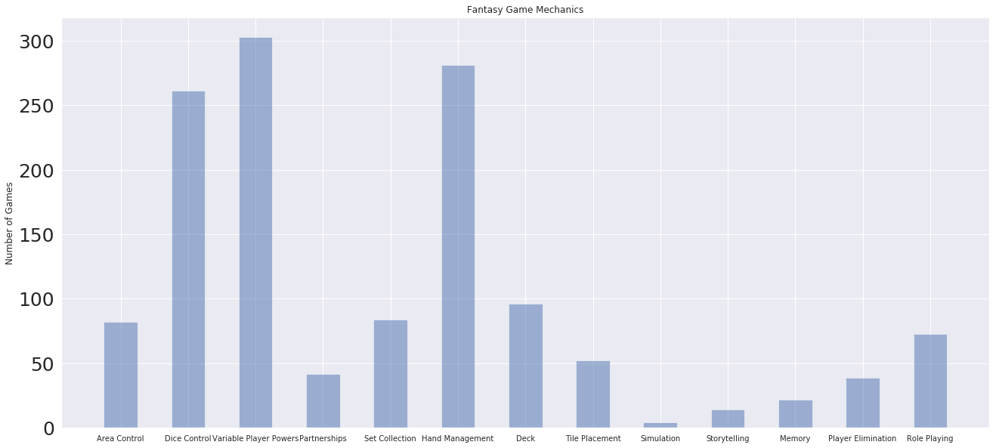

In [255]:
objects = ('Area Control', 'Dice Control', 'Variable Player Powers', 'Partnerships', 'Set Collection', 'Hand Management', 'Deck', 'Tile Placement', 'Simulation', 'Storytelling', 'Memory', 'Player Elimination', 'Role Playing')
y_pos = np.arange(len(objects))
performance = [82,261,303,42,84,281,96,52,4,14,22,39,73]
plt.figure(figsize=(22, 10))
plt.bar(y_pos, performance, align='center', width=.5, alpha=0.5)
plt.xticks(y_pos, objects)
plt.ylabel('Number of Games')
plt.title('Fantasy Game Mechanics')
plt.rc('xtick', labelsize=10) 
plt.rc('ytick', labelsize=25) 


plt.show()

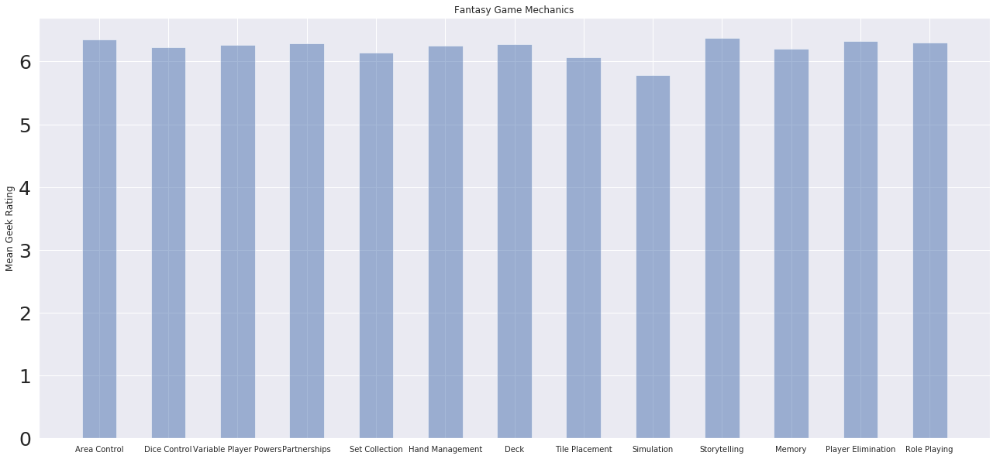

In [256]:
objects = ('Area Control', 'Dice Control', 'Variable Player Powers', 'Partnerships', 'Set Collection', 'Hand Management', 'Deck', 'Tile Placement', 'Simulation', 'Storytelling', 'Memory', 'Player Elimination', 'Role Playing')
y_pos = np.arange(len(objects))
performance = [6.35,6.23,6.27,6.29,6.14,6.25,6.28,6.07,5.78,6.38,6.2,6.33,6.3]
plt.figure(figsize=(22, 10))
plt.bar(y_pos, performance, align='center', width=.5, alpha=0.5)
plt.xticks(y_pos, objects)
plt.ylabel('Mean Geek Rating')
plt.title('Fantasy Game Mechanics')
plt.rc('xtick', labelsize=10) 
plt.rc('ytick', labelsize=25) 


plt.show()

While there don't appear to be any major differences in the ratings of fantasy games that incorporate specific game mechanics, those hat incorporate simulation appear to be lower rated.

## Puzzle Games

In [257]:
Puzzle = df.groupby('Puzzle')
Puzzle.get_group(1)
df.head()

,Rank,Game,Min Players,Max Players,Avg Time,Min Time,Max Time,Year,Avg Rating,Geek Rating,Num Votes,Age,Mechanic,Area Control,Dice Rolling,Variable Player Powers,Partnerships,Set Collection,Hand Management,Deck,Tile Placement,Simulation,Storytelling,Memory,Player Elimination,Role Playing,Press Your Luck,owned,category,Environmental,Medical,Card Game,Civilization,Economic,Fantasy,Puzzle,TV/Movie/Radio,War,Horror,Murder/Mystery,Party Game,Trivia,Racing,Territory Building,Adventure,Dice
0,1,Pandemic Legacy: Season 1,2,4,60,60,60,2015,8.66905,8.48904,18009,13,"Action Point Allowance System, Co-operative Pl...",False,False,True,False,True,True,False,False,False,False,False,False,False,0,29472,"Environmental, Medical",True,True,False,False,False,False,0,0,0,0,0,0,0,0,0,0,0
1,2,Through the Ages: A New Story of Civilization,2,4,240,180,240,2015,8.72977,8.30744,7309,14,"Action Point Allowance System, Auction/Bidding...",False,False,False,False,False,True,False,False,False,False,False,False,False,0,10007,"Card Game, Civilization, Economic",False,False,True,True,True,False,0,0,0,0,0,0,0,0,0,0,0
2,3,Twilight Struggle,2,2,180,180,180,2005,8.35745,8.22021,27403,13,"Area Control / Area Influence, Campaign / Batt...",True,True,False,False,False,True,False,False,False,False,False,False,False,0,37382,"Modern Warfare, Political, Wargame",False,False,False,False,False,False,0,0,1,0,0,0,0,0,0,0,0
3,4,Terra Mystica,2,5,150,60,150,2012,8.29627,8.15458,24267,12,"Route/Network Building, Variable Phase Order, ...",False,False,True,False,False,False,False,False,False,False,False,False,False,0,27948,"Civilization, Economic, Fantasy, Territory Bui...",False,False,False,True,True,True,0,0,0,0,0,0,0,0,1,0,0
4,5,Gloomhaven,1,4,150,90,150,2017,9.08970,8.15151,3978,12,"Action / Movement Programming, Campaign / Batt...",False,False,True,False,False,True,False,False,False,True,False,False,False,0,6057,"Adventure, Economic, Exploration, Fantasy, Fig...",False,False,False,False,True,True,0,0,0,0,0,0,0,0,0,1,0


In [258]:
Puzzle.get_group(1).shape

(89, 46)

In [259]:
pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', None)
Puzzle.mean()

,Rank,Min Players,Max Players,Avg Time,Min Time,Max Time,Year,Avg Rating,Geek Rating,Num Votes,Age,Area Control,Dice Rolling,Variable Player Powers,Partnerships,Set Collection,Hand Management,Deck,Tile Placement,Simulation,Storytelling,Memory,Player Elimination,Role Playing,Press Your Luck,owned,Environmental,Medical,Card Game,Civilization,Economic,Fantasy,TV/Movie/Radio,War,Horror,Murder/Mystery,Party Game,Trivia,Racing,Territory Building,Adventure,Dice
Puzzle,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
0,2502.766802,2.040733,5.215886,106.656212,88.303666,106.251935,1996.125866,6.93358,6.063843,1699.537067,10.310387,0.122200,0.274338,0.164562,0.058452,0.143992,0.264562,0.050102,0.101426,0.067617,0.013646,0.034420,0.031976,0.028106,0.0,2537.725866,0.007739,0.003462,0.270876,0.032994,0.107536,0.136864,0.0,0.217108,0.034420,0.013035,0.058452,0.0,0.031568,0.037067,0.056619,0.068839
1,2347.359551,1.696629,9.224719,44.943820,33.707865,44.606742,2007.977528,6.84479,6.080320,1621.640449,8.955056,0.022472,0.179775,0.089888,0.056180,0.089888,0.101124,0.000000,0.337079,0.000000,0.033708,0.044944,0.000000,0.022472,0.0,2437.617978,0.000000,0.011236,0.112360,0.000000,0.033708,0.101124,0.0,0.011236,0.044944,0.044944,0.112360,0.0,0.022472,0.011236,0.089888,0.067416


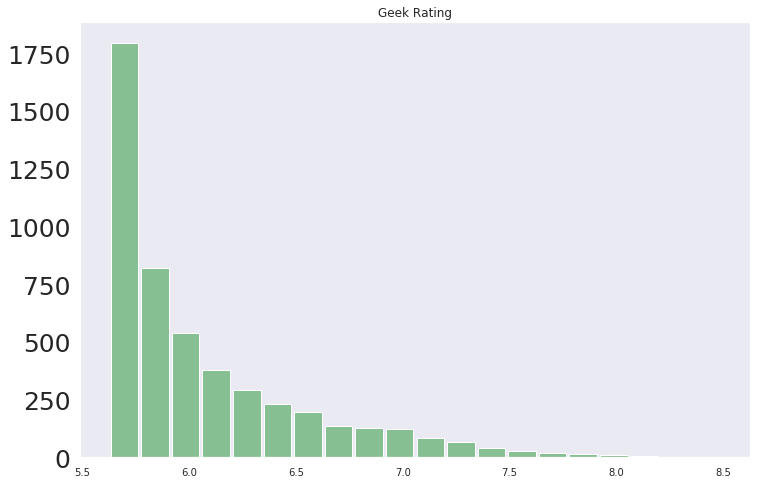

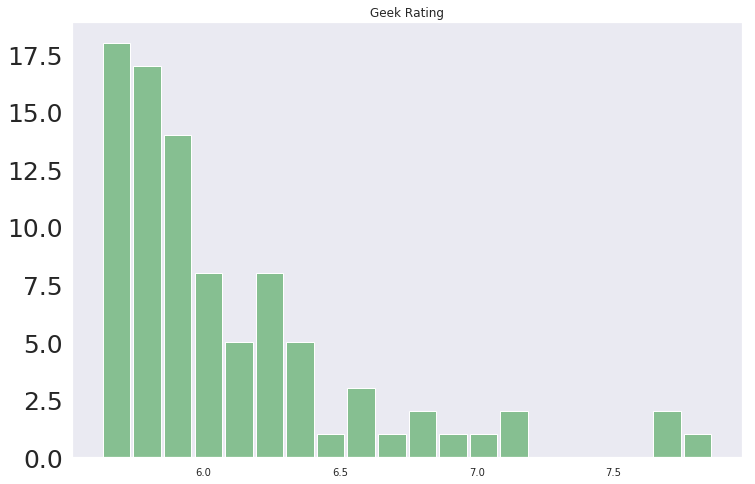

In [260]:
ax = Puzzle.hist(column='Geek Rating', bins=20, grid=False, figsize=(12,8), color='#86bf91', zorder=2, rwidth=0.9)
plt.show()

The distribution of ratings for puzzle games appears to be similar to the distribution of ratings for all games.

In [261]:
(df['Puzzle'] == 1) & (df['Area Control'] == 1)

0       False
1       False
2       False
3       False
4       False
5       False
6       False
7       False
8       False
9       False
10      False
11      False
12      False
13      False
14      False
15      False
16      False
17      False
18      False
19      False
20      False
21      False
22      False
23      False
24      False
25      False
26      False
27      False
28      False
29      False
30      False
31      False
32      False
33      False
34      False
35      False
36      False
37      False
38      False
39      False
40      False
41      False
42      False
43      False
44      False
45      False
46      False
47      False
48      False
49      False
50      False
51      False
52      False
53      False
54      False
55      False
56      False
57      False
58      False
59      False
60      False
61      False
62      False
63      False
64      False
65      False
66      False
67      False
68      False
69      False
70      False
71    

In [262]:
df['Puzzle'] = df['Puzzle'].apply(bool)
df['Area Control'] = df['Area Control'].apply(bool)
df_sub = df.iloc[np.array(df['Puzzle'] & df['Area Control'])]

In [263]:
df_sub.head()

,Rank,Game,Min Players,Max Players,Avg Time,Min Time,Max Time,Year,Avg Rating,Geek Rating,Num Votes,Age,Mechanic,Area Control,Dice Rolling,Variable Player Powers,Partnerships,Set Collection,Hand Management,Deck,Tile Placement,Simulation,Storytelling,Memory,Player Elimination,Role Playing,Press Your Luck,owned,category,Environmental,Medical,Card Game,Civilization,Economic,Fantasy,Puzzle,TV/Movie/Radio,War,Horror,Murder/Mystery,Party Game,Trivia,Racing,Territory Building,Adventure,Dice
2643,2644,Portal: The Uncooperative Cake Acquisition Game,2,4,45,30,45,2015,6.44944,5.85170,653,15,"Area Control / Area Influence, Modular Board",True,False,False,False,False,False,False,False,False,False,False,False,False,0,1701,"Puzzle, Science Fiction, Video Game Theme",False,False,False,False,False,False,True,0,0,0,0,0,0,0,0,0,0
4537,4538,The Penguin Ultimatum,2,4,45,45,45,2003,6.22196,5.65032,255,10,"Area Control / Area Influence, Set Collection,...",True,False,False,False,True,False,False,True,False,False,False,False,False,0,422,"Abstract Strategy, Animals, Card Game, Humor, ...",False,False,True,False,False,False,True,0,0,0,0,0,0,0,0,0,0


In [264]:
(df['Puzzle'] == 1) & (df['Dice Rolling'] == 1)

0       False
1       False
2       False
3       False
4       False
5       False
6       False
7       False
8       False
9       False
10      False
11      False
12      False
13      False
14      False
15      False
16      False
17      False
18      False
19       True
20      False
21      False
22      False
23      False
24      False
25      False
26      False
27      False
28      False
29      False
30      False
31      False
32      False
33      False
34      False
35      False
36      False
37      False
38      False
39      False
40      False
41      False
42       True
43      False
44      False
45      False
46      False
47      False
48      False
49      False
50      False
51      False
52      False
53      False
54      False
55      False
56      False
57      False
58      False
59      False
60      False
61      False
62      False
63      False
64      False
65      False
66      False
67      False
68      False
69      False
70      False
71    

In [265]:
df['Puzzle'] = df['Puzzle'].apply(bool)
df['Dice Rolling'] = df['Dice Rolling'].apply(bool)
df_sub = df.iloc[np.array(df['Puzzle'] & df['Dice Rolling'])]

In [266]:
df_sub.shape

(16, 46)

In [267]:
(df['Puzzle'] == 1) & (df['Variable Player Powers'] == 1)

0       False
1       False
2       False
3       False
4       False
5       False
6       False
7       False
8       False
9       False
10      False
11      False
12      False
13      False
14      False
15      False
16      False
17      False
18      False
19       True
20      False
21      False
22      False
23      False
24      False
25      False
26      False
27      False
28      False
29      False
30      False
31      False
32      False
33      False
34      False
35      False
36      False
37      False
38      False
39      False
40      False
41      False
42      False
43      False
44      False
45      False
46      False
47      False
48      False
49      False
50      False
51      False
52      False
53      False
54      False
55      False
56      False
57      False
58      False
59      False
60      False
61      False
62      False
63      False
64      False
65      False
66      False
67      False
68      False
69      False
70      False
71    

In [268]:
df['Puzzle'] = df['Puzzle'].apply(bool)
df['Variable Player Powers'] = df['Variable Player Powers'].apply(bool)
df_sub = df.iloc[np.array(df['Puzzle'] & df['Variable Player Powers'])]

In [269]:
df_sub.shape

(8, 46)

In [270]:
(df['Puzzle'] == 1) & (df['Partnerships'] == 1)

0       False
1       False
2       False
3       False
4       False
5       False
6       False
7       False
8       False
9       False
10      False
11      False
12      False
13      False
14      False
15      False
16      False
17      False
18      False
19       True
20      False
21      False
22      False
23      False
24      False
25      False
26      False
27      False
28      False
29      False
30      False
31      False
32      False
33      False
34      False
35      False
36      False
37      False
38      False
39      False
40      False
41      False
42      False
43      False
44      False
45      False
46      False
47      False
48      False
49      False
50      False
51      False
52      False
53      False
54      False
55      False
56      False
57      False
58      False
59      False
60      False
61      False
62      False
63      False
64      False
65      False
66      False
67      False
68      False
69      False
70      False
71    

In [271]:
df['Puzzle'] = df['Puzzle'].apply(bool)
df['Partnerships'] = df['Partnerships'].apply(bool)
df_sub = df.iloc[np.array(df['Puzzle'] & df['Partnerships'])]

In [272]:
df_sub.shape

(5, 46)

In [273]:
(df['Puzzle'] == 1) & (df['Set Collection'] == 1)

0       False
1       False
2       False
3       False
4       False
5       False
6       False
7       False
8       False
9       False
10      False
11      False
12      False
13      False
14      False
15      False
16      False
17      False
18      False
19      False
20      False
21      False
22      False
23      False
24      False
25      False
26      False
27      False
28      False
29      False
30      False
31      False
32      False
33      False
34      False
35      False
36      False
37      False
38      False
39      False
40      False
41      False
42      False
43      False
44      False
45      False
46      False
47      False
48      False
49      False
50      False
51      False
52      False
53      False
54      False
55      False
56      False
57      False
58      False
59      False
60      False
61      False
62      False
63      False
64      False
65      False
66      False
67      False
68      False
69      False
70      False
71    

In [274]:
df['Puzzle'] = df['Puzzle'].apply(bool)
df['Set Collection'] = df['Set Collection'].apply(bool)
df_sub = df.iloc[np.array(df['Puzzle'] & df['Set Collection'])]

In [275]:
df_sub.shape

(8, 46)

In [276]:
(df['Puzzle'] == 1) & (df['Hand Management'] == 1)

0       False
1       False
2       False
3       False
4       False
5       False
6       False
7       False
8       False
9       False
10      False
11      False
12      False
13      False
14      False
15      False
16      False
17      False
18      False
19       True
20      False
21      False
22      False
23      False
24      False
25      False
26      False
27      False
28      False
29      False
30      False
31      False
32      False
33      False
34      False
35      False
36      False
37      False
38      False
39      False
40      False
41      False
42      False
43      False
44      False
45      False
46      False
47      False
48      False
49      False
50      False
51      False
52      False
53      False
54      False
55      False
56      False
57      False
58      False
59      False
60      False
61      False
62      False
63      False
64      False
65      False
66      False
67      False
68      False
69      False
70      False
71    

In [277]:
df['Puzzle'] = df['Puzzle'].apply(bool)
df['Hand Management'] = df['Hand Management'].apply(bool)
df_sub = df.iloc[np.array(df['Puzzle'] & df['Hand Management'])]

In [278]:
df_sub.shape

(9, 46)

In [279]:
(df['Puzzle'] == 1) & (df['Tile Placement'] == 1)

0       False
1       False
2       False
3       False
4       False
5       False
6       False
7       False
8       False
9       False
10      False
11      False
12      False
13      False
14      False
15      False
16      False
17      False
18      False
19      False
20      False
21      False
22      False
23      False
24      False
25      False
26      False
27      False
28      False
29      False
30      False
31      False
32      False
33      False
34      False
35      False
36      False
37      False
38      False
39      False
40      False
41      False
42       True
43       True
44      False
45      False
46      False
47      False
48      False
49      False
50      False
51      False
52      False
53      False
54      False
55      False
56      False
57      False
58      False
59      False
60      False
61      False
62      False
63      False
64      False
65      False
66      False
67      False
68      False
69      False
70      False
71    

In [280]:
df['Puzzle'] = df['Puzzle'].apply(bool)
df['Tile Placement'] = df['Tile Placement'].apply(bool)
df_sub = df.iloc[np.array(df['Puzzle'] & df['Tile Placement'])]

In [281]:
df_sub.shape

(30, 46)

In [282]:
(df['Puzzle'] == 1) & (df['Storytelling'] == 1)

0       False
1       False
2       False
3       False
4       False
5       False
6       False
7       False
8       False
9       False
10      False
11      False
12      False
13      False
14      False
15      False
16      False
17      False
18      False
19      False
20      False
21      False
22      False
23      False
24      False
25      False
26      False
27      False
28      False
29      False
30      False
31      False
32      False
33      False
34      False
35      False
36      False
37      False
38      False
39      False
40      False
41      False
42      False
43      False
44      False
45      False
46      False
47      False
48      False
49      False
50      False
51      False
52      False
53      False
54      False
55      False
56      False
57      False
58      False
59      False
60      False
61      False
62      False
63      False
64      False
65      False
66      False
67      False
68      False
69      False
70      False
71    

In [283]:
df['Puzzle'] = df['Puzzle'].apply(bool)
df['Storytelling'] = df['Storytelling'].apply(bool)
df_sub = df.iloc[np.array(df['Puzzle'] & df['Storytelling'])]

In [284]:
df_sub.shape

(3, 46)

In [285]:
(df['Puzzle'] == 1) & (df['Memory'] == 1)

0       False
1       False
2       False
3       False
4       False
5       False
6       False
7       False
8       False
9       False
10      False
11      False
12      False
13      False
14      False
15      False
16      False
17      False
18      False
19      False
20      False
21      False
22      False
23      False
24      False
25      False
26      False
27      False
28      False
29      False
30      False
31      False
32      False
33      False
34      False
35      False
36      False
37      False
38      False
39      False
40      False
41      False
42      False
43      False
44      False
45      False
46      False
47      False
48      False
49      False
50      False
51      False
52      False
53      False
54      False
55      False
56      False
57      False
58      False
59      False
60      False
61      False
62      False
63      False
64      False
65      False
66      False
67      False
68      False
69      False
70      False
71    

In [286]:
df['Puzzle'] = df['Puzzle'].apply(bool)
df['Memory'] = df['Memory'].apply(bool)
df_sub = df.iloc[np.array(df['Puzzle'] & df['Memory'])]

In [287]:
df_sub.shape

(4, 46)

In [288]:
(df['Puzzle'] == 1) & (df['Role Playing'] == 1)

0       False
1       False
2       False
3       False
4       False
5       False
6       False
7       False
8       False
9       False
10      False
11      False
12      False
13      False
14      False
15      False
16      False
17      False
18      False
19       True
20      False
21      False
22      False
23      False
24      False
25      False
26      False
27      False
28      False
29      False
30      False
31      False
32      False
33      False
34      False
35      False
36      False
37      False
38      False
39      False
40      False
41      False
42      False
43      False
44      False
45      False
46      False
47      False
48      False
49      False
50      False
51      False
52      False
53      False
54      False
55      False
56      False
57      False
58      False
59      False
60      False
61      False
62      False
63      False
64      False
65      False
66      False
67      False
68      False
69      False
70      False
71    

In [289]:
df['Puzzle'] = df['Puzzle'].apply(bool)
df['Role Playing'] = df['Role Playing'].apply(bool)
df_sub = df.iloc[np.array(df['Puzzle'] & df['Role Playing'])]

In [290]:
df_sub.shape

(2, 46)

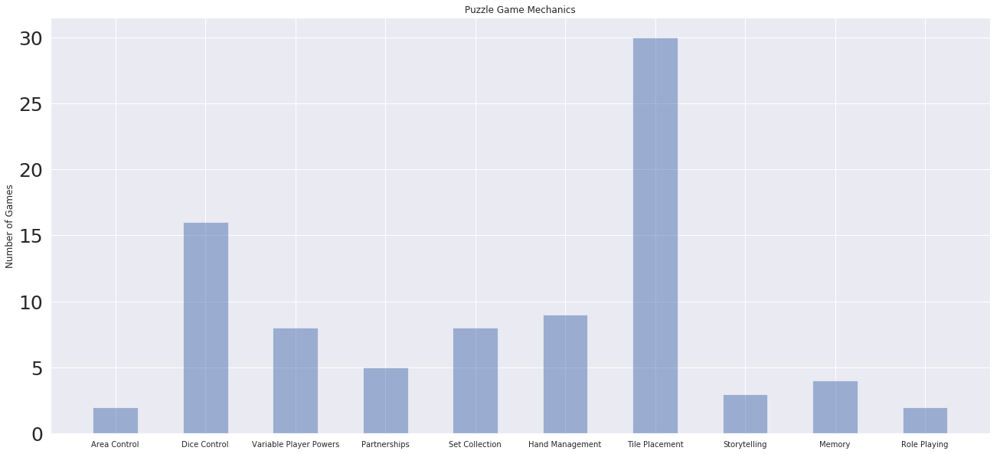

In [291]:
objects = ('Area Control', 'Dice Control', 'Variable Player Powers', 'Partnerships', 'Set Collection', 'Hand Management', 'Tile Placement', 'Storytelling', 'Memory',  'Role Playing')
y_pos = np.arange(len(objects))
performance = [2,16,8,5,8,9,30,3,4,2]
plt.figure(figsize=(22, 10))
plt.bar(y_pos, performance, align='center', width=.5, alpha=0.5)
plt.xticks(y_pos, objects)
plt.ylabel('Number of Games')
plt.title('Puzzle Game Mechanics')
plt.rc('xtick', labelsize=10) 
plt.rc('ytick', labelsize=25) 


plt.show()

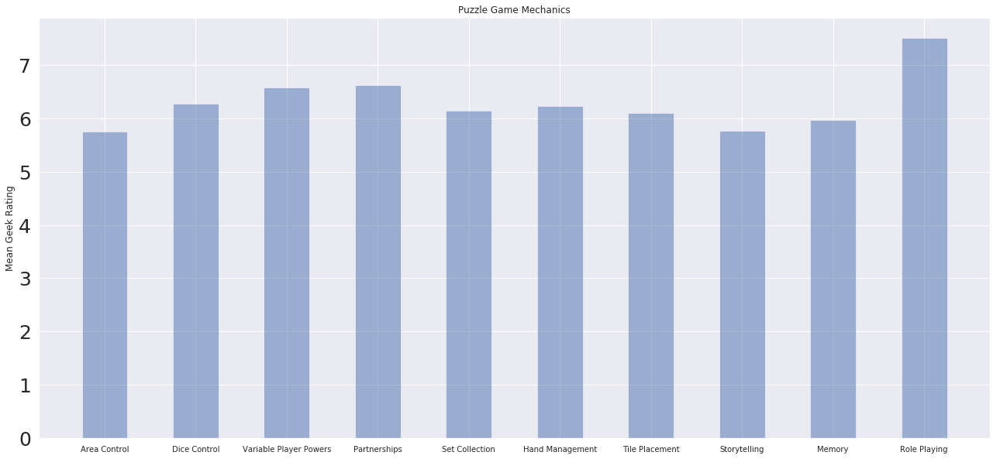

In [292]:
objects = ('Area Control', 'Dice Control', 'Variable Player Powers', 'Partnerships', 'Set Collection', 'Hand Management', 'Tile Placement', 'Storytelling', 'Memory',  'Role Playing')
y_pos = np.arange(len(objects))
performance = [5.75,6.27,6.58,6.62,6.14,6.23,6.1,5.77,5.96,7.51]
plt.figure(figsize=(22, 10))
plt.bar(y_pos, performance, align='center', width=.5, alpha=0.5)
plt.xticks(y_pos, objects)
plt.ylabel('Mean Geek Rating')
plt.title('Puzzle Game Mechanics')
plt.rc('xtick', labelsize=10) 
plt.rc('ytick', labelsize=25) 


plt.show()

Role playing appears to be a particularly highly rated mechanic for puzzle games.

## War Games

In [293]:
War = df.groupby('War')
War.get_group(1)
df.head()

,Rank,Game,Min Players,Max Players,Avg Time,Min Time,Max Time,Year,Avg Rating,Geek Rating,Num Votes,Age,Mechanic,Area Control,Dice Rolling,Variable Player Powers,Partnerships,Set Collection,Hand Management,Deck,Tile Placement,Simulation,Storytelling,Memory,Player Elimination,Role Playing,Press Your Luck,owned,category,Environmental,Medical,Card Game,Civilization,Economic,Fantasy,Puzzle,TV/Movie/Radio,War,Horror,Murder/Mystery,Party Game,Trivia,Racing,Territory Building,Adventure,Dice
0,1,Pandemic Legacy: Season 1,2,4,60,60,60,2015,8.66905,8.48904,18009,13,"Action Point Allowance System, Co-operative Pl...",False,False,True,False,True,True,False,False,False,False,False,False,False,0,29472,"Environmental, Medical",True,True,False,False,False,False,False,0,0,0,0,0,0,0,0,0,0
1,2,Through the Ages: A New Story of Civilization,2,4,240,180,240,2015,8.72977,8.30744,7309,14,"Action Point Allowance System, Auction/Bidding...",False,False,False,False,False,True,False,False,False,False,False,False,False,0,10007,"Card Game, Civilization, Economic",False,False,True,True,True,False,False,0,0,0,0,0,0,0,0,0,0
2,3,Twilight Struggle,2,2,180,180,180,2005,8.35745,8.22021,27403,13,"Area Control / Area Influence, Campaign / Batt...",True,True,False,False,False,True,False,False,False,False,False,False,False,0,37382,"Modern Warfare, Political, Wargame",False,False,False,False,False,False,False,0,1,0,0,0,0,0,0,0,0
3,4,Terra Mystica,2,5,150,60,150,2012,8.29627,8.15458,24267,12,"Route/Network Building, Variable Phase Order, ...",False,False,True,False,False,False,False,False,False,False,False,False,False,0,27948,"Civilization, Economic, Fantasy, Territory Bui...",False,False,False,True,True,True,False,0,0,0,0,0,0,0,1,0,0
4,5,Gloomhaven,1,4,150,90,150,2017,9.08970,8.15151,3978,12,"Action / Movement Programming, Campaign / Batt...",False,False,True,False,False,True,False,False,False,True,False,False,False,0,6057,"Adventure, Economic, Exploration, Fantasy, Fig...",False,False,False,False,True,True,False,0,0,0,0,0,0,0,0,1,0


In [294]:
War.get_group(1).shape

(1067, 46)

In [295]:
pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', None)
War.mean()

,Rank,Min Players,Max Players,Avg Time,Min Time,Max Time,Year,Avg Rating,Geek Rating,Num Votes,Age,Area Control,Dice Rolling,Variable Player Powers,Partnerships,Set Collection,Hand Management,Deck,Tile Placement,Simulation,Storytelling,Memory,Player Elimination,Role Playing,Press Your Luck,owned,Environmental,Medical,Card Game,Civilization,Economic,Fantasy,Puzzle,TV/Movie/Radio,Horror,Murder/Mystery,Party Game,Trivia,Racing,Territory Building,Adventure,Dice
War,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
0,2391.760427,2.095371,5.691760,62.326297,52.557477,61.993133,1995.111139,6.847135,6.096432,1956.502035,10.227874,0.128179,0.206511,0.169634,0.065361,0.180315,0.303917,0.058494,0.133011,0.022126,0.017548,0.042472,0.033062,0.032045,0.0,2844.218973,0.009410,0.004578,0.322737,0.036368,0.129196,0.153357,0.022380,0.0,0.041963,0.017294,0.075280,0.0,0.039420,0.039674,0.067396,0.079349
1,2898.873477,1.810684,3.796626,264.868791,215.477976,264.208060,2000.853796,7.244729,5.945124,746.098407,10.501406,0.091846,0.516401,0.139644,0.032802,0.005623,0.105904,0.014995,0.004686,0.229616,0.000937,0.005623,0.025305,0.013121,0.0,1399.918463,0.000937,0.000000,0.066542,0.017807,0.021556,0.073102,0.000937,0.0,0.007498,0.000000,0.000937,0.0,0.001874,0.025305,0.019681,0.029991


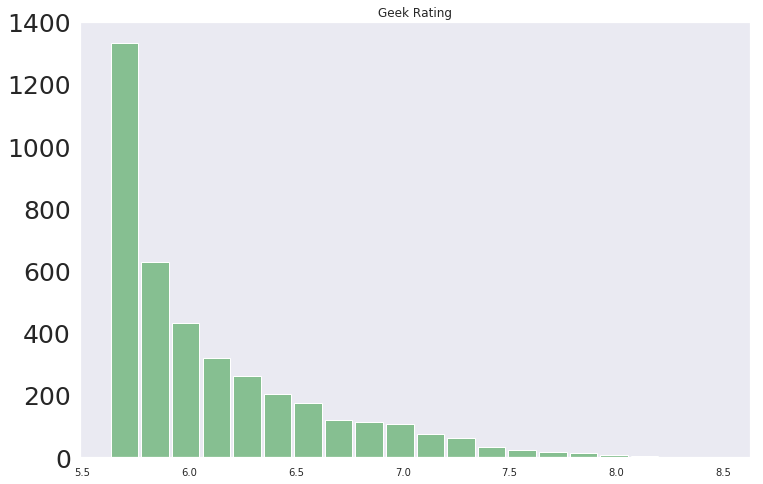

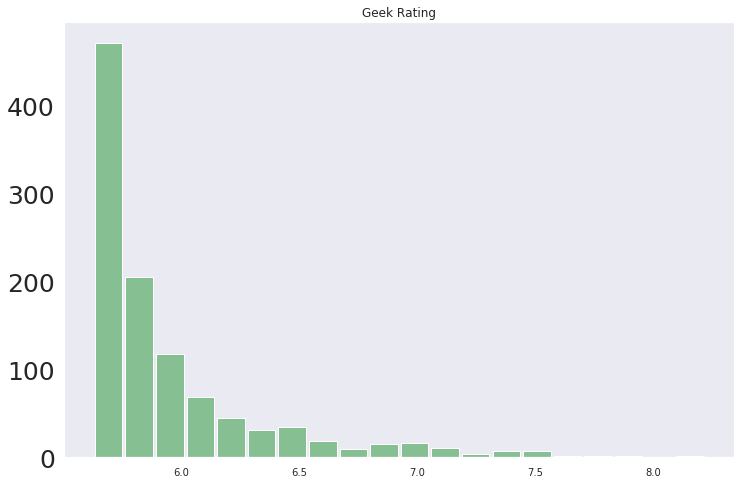

In [296]:
ax = War.hist(column='Geek Rating', bins=20, grid=False, figsize=(12,8), color='#86bf91', zorder=2, rwidth=0.9)
plt.show()

The distribution of ratings for war games appears to be similar to the distribution of ratings for all games.

In [297]:
(df['War'] == 1) & (df['Area Control'] == 1)

0       False
1       False
2        True
3       False
4       False
5        True
6       False
7       False
8       False
9       False
10      False
11      False
12      False
13      False
14      False
15      False
16      False
17      False
18      False
19      False
20      False
21      False
22       True
23      False
24      False
25      False
26      False
27      False
28      False
29      False
30      False
31      False
32      False
33      False
34      False
35      False
36      False
37      False
38      False
39      False
40      False
41      False
42      False
43      False
44      False
45      False
46      False
47      False
48      False
49      False
50      False
51      False
52      False
53      False
54      False
55      False
56      False
57      False
58      False
59      False
60      False
61      False
62      False
63      False
64      False
65      False
66       True
67      False
68      False
69      False
70       True
71    

In [298]:
df['War'] = df['War'].apply(bool)
df['Area Control'] = df['Area Control'].apply(bool)
df_sub = df.iloc[np.array(df['War'] & df['Area Control'])]

In [299]:
df_sub.shape

(98, 46)

In [300]:
(df['War'] == 1) & (df['Dice Rolling'] == 1)

0       False
1       False
2        True
3       False
4       False
5        True
6       False
7       False
8       False
9       False
10      False
11      False
12      False
13      False
14      False
15      False
16      False
17       True
18      False
19      False
20      False
21      False
22       True
23      False
24      False
25      False
26      False
27      False
28      False
29      False
30      False
31      False
32      False
33      False
34      False
35      False
36      False
37      False
38      False
39      False
40      False
41       True
42      False
43      False
44      False
45      False
46      False
47      False
48      False
49      False
50      False
51       True
52      False
53      False
54      False
55      False
56      False
57      False
58      False
59      False
60      False
61      False
62      False
63      False
64      False
65      False
66       True
67      False
68      False
69      False
70      False
71    

In [301]:
df['War'] = df['War'].apply(bool)
df['Dice Rolling'] = df['Dice Rolling'].apply(bool)
df_sub = df.iloc[np.array(df['War'] & df['Dice Rolling'])]

In [302]:
df_sub.shape

(551, 46)

In [303]:
(df['War'] == 1) & (df['Variable Player Powers'] == 1)

0       False
1       False
2       False
3       False
4       False
5       False
6       False
7       False
8       False
9       False
10      False
11      False
12      False
13      False
14      False
15      False
16      False
17       True
18      False
19      False
20      False
21      False
22       True
23      False
24      False
25      False
26      False
27      False
28      False
29      False
30      False
31      False
32      False
33      False
34      False
35      False
36      False
37      False
38      False
39      False
40      False
41       True
42      False
43      False
44      False
45      False
46      False
47      False
48      False
49      False
50      False
51       True
52      False
53      False
54      False
55      False
56      False
57      False
58      False
59      False
60      False
61      False
62      False
63      False
64      False
65      False
66      False
67      False
68      False
69      False
70       True
71    

In [304]:
df['War'] = df['War'].apply(bool)
df['Variable Player Powers'] = df['Variable Player Powers'].apply(bool)
df_sub = df.iloc[np.array(df['War'] & df['Variable Player Powers'])]

In [305]:
df_sub.shape

(149, 46)

In [306]:
(df['War'] == 1) & (df['Partnerships'] == 1)

0       False
1       False
2       False
3       False
4       False
5       False
6       False
7       False
8       False
9       False
10      False
11      False
12      False
13      False
14      False
15      False
16      False
17       True
18      False
19      False
20      False
21      False
22      False
23      False
24      False
25      False
26      False
27      False
28      False
29      False
30      False
31      False
32      False
33      False
34      False
35      False
36      False
37      False
38      False
39      False
40      False
41      False
42      False
43      False
44      False
45      False
46      False
47      False
48      False
49      False
50      False
51      False
52      False
53      False
54      False
55      False
56      False
57      False
58      False
59      False
60      False
61      False
62      False
63      False
64      False
65      False
66      False
67      False
68      False
69      False
70      False
71    

In [307]:
df['War'] = df['War'].apply(bool)
df['Partnerships'] = df['Partnerships'].apply(bool)
df_sub = df.iloc[np.array(df['War'] & df['Partnerships'])]

In [308]:
df_sub.shape

(35, 46)

In [309]:
(df['War'] == 1) & (df['Set Collection'] == 1)

0       False
1       False
2       False
3       False
4       False
5       False
6       False
7       False
8       False
9       False
10      False
11      False
12      False
13      False
14      False
15      False
16      False
17      False
18      False
19      False
20      False
21      False
22      False
23      False
24      False
25      False
26      False
27      False
28      False
29      False
30      False
31      False
32      False
33      False
34      False
35      False
36      False
37      False
38      False
39      False
40      False
41      False
42      False
43      False
44      False
45      False
46      False
47      False
48      False
49      False
50      False
51      False
52      False
53      False
54      False
55      False
56      False
57      False
58      False
59      False
60      False
61      False
62      False
63      False
64      False
65      False
66      False
67      False
68      False
69      False
70      False
71    

In [310]:
df['War'] = df['War'].apply(bool)
df['Set Collection'] = df['Set Collection'].apply(bool)
df_sub = df.iloc[np.array(df['War'] & df['Set Collection'])]

In [311]:
df_sub.shape

(6, 46)

In [312]:
(df['War'] == 1) & (df['Hand Management'] == 1)

0       False
1       False
2        True
3       False
4       False
5        True
6       False
7       False
8       False
9       False
10      False
11      False
12      False
13      False
14      False
15      False
16      False
17      False
18      False
19      False
20      False
21      False
22      False
23      False
24      False
25      False
26      False
27      False
28      False
29      False
30      False
31      False
32      False
33      False
34      False
35      False
36      False
37      False
38      False
39      False
40      False
41      False
42      False
43      False
44      False
45      False
46      False
47      False
48      False
49      False
50      False
51      False
52      False
53      False
54      False
55      False
56      False
57      False
58      False
59      False
60      False
61      False
62      False
63      False
64      False
65      False
66       True
67      False
68      False
69      False
70       True
71    

In [313]:
df['War'] = df['War'].apply(bool)
df['War'] = df['Hand Management'].apply(bool)
df_sub = df.iloc[np.array(df['War'] & df['Hand Management'])]

In [314]:
df_sub.shape

(1308, 46)

In [315]:
(df['War'] == 1) & (df['Deck'] == 1)

0       False
1       False
2       False
3       False
4       False
5       False
6       False
7       False
8       False
9       False
10      False
11      False
12      False
13      False
14       True
15      False
16      False
17      False
18       True
19      False
20      False
21      False
22      False
23       True
24      False
25      False
26      False
27      False
28      False
29      False
30      False
31      False
32      False
33      False
34       True
35      False
36      False
37      False
38      False
39      False
40      False
41      False
42      False
43      False
44      False
45      False
46      False
47      False
48      False
49      False
50       True
51      False
52      False
53      False
54       True
55      False
56       True
57      False
58      False
59      False
60      False
61      False
62      False
63      False
64      False
65      False
66      False
67      False
68      False
69      False
70      False
71    

In [316]:
df['War'] = df['War'].apply(bool)
df['Deck'] = df['Deck'].apply(bool)
df_sub = df.iloc[np.array(df['War'] & df['Deck'])]

In [317]:
df_sub.shape

(135, 46)

In [318]:
(df['War'] == 1) & (df['Tile Placement'] == 1)

0       False
1       False
2       False
3       False
4       False
5       False
6       False
7        True
8       False
9       False
10      False
11      False
12      False
13      False
14       True
15      False
16      False
17      False
18       True
19      False
20      False
21      False
22      False
23      False
24      False
25      False
26      False
27      False
28      False
29      False
30      False
31      False
32      False
33      False
34      False
35      False
36      False
37      False
38      False
39      False
40      False
41      False
42      False
43      False
44      False
45      False
46      False
47      False
48      False
49      False
50      False
51      False
52      False
53      False
54      False
55      False
56      False
57      False
58      False
59       True
60      False
61      False
62      False
63      False
64      False
65      False
66      False
67      False
68      False
69      False
70      False
71    

In [319]:
df['War'] = df['War'].apply(bool)
df['Tile Placement'] = df['Tile Placement'].apply(bool)
df_sub = df.iloc[np.array(df['War'] & df['Tile Placement'])]

In [320]:
df_sub.shape

(103, 46)

In [321]:
(df['War'] == 1) & (df['Simulation'] == 1)

0       False
1       False
2       False
3       False
4       False
5       False
6       False
7       False
8       False
9       False
10      False
11      False
12      False
13      False
14      False
15      False
16      False
17      False
18      False
19      False
20      False
21      False
22      False
23      False
24      False
25      False
26      False
27      False
28      False
29      False
30      False
31      False
32      False
33      False
34      False
35      False
36      False
37      False
38      False
39      False
40      False
41      False
42      False
43      False
44      False
45      False
46      False
47      False
48      False
49      False
50      False
51      False
52      False
53      False
54      False
55      False
56      False
57      False
58      False
59      False
60      False
61      False
62      False
63      False
64      False
65      False
66      False
67      False
68      False
69      False
70      False
71    

In [322]:
df['War'] = df['War'].apply(bool)
df['Simulation'] = df['Simulation'].apply(bool)
df_sub = df.iloc[np.array(df['War'] & df['Simulation'])]

In [323]:
df_sub.shape

(36, 46)

In [324]:
(df['War'] == 1) & (df['Storytelling'] == 1)

0       False
1       False
2       False
3       False
4        True
5       False
6       False
7       False
8       False
9       False
10      False
11      False
12      False
13      False
14      False
15      False
16      False
17      False
18      False
19      False
20      False
21      False
22      False
23      False
24      False
25      False
26      False
27      False
28      False
29      False
30      False
31      False
32      False
33      False
34      False
35      False
36      False
37      False
38      False
39      False
40       True
41      False
42      False
43      False
44      False
45      False
46      False
47      False
48      False
49      False
50      False
51      False
52      False
53      False
54      False
55      False
56      False
57      False
58      False
59      False
60      False
61      False
62      False
63      False
64      False
65      False
66      False
67      False
68      False
69      False
70      False
71    

In [325]:
df['War'] = df['War'].apply(bool)
df['Storytelling'] = df['Storytelling'].apply(bool)
df_sub = df.iloc[np.array(df['War'] & df['Storytelling'])]

In [326]:
df_sub.shape

(11, 46)

In [327]:
(df['War'] == 1) & (df['Memory'] == 1)

0       False
1       False
2       False
3       False
4       False
5       False
6       False
7       False
8       False
9       False
10      False
11      False
12      False
13      False
14      False
15       True
16      False
17      False
18      False
19      False
20      False
21      False
22      False
23      False
24      False
25      False
26      False
27      False
28      False
29      False
30      False
31      False
32      False
33      False
34      False
35      False
36      False
37      False
38      False
39      False
40      False
41      False
42      False
43      False
44      False
45      False
46      False
47      False
48      False
49       True
50      False
51      False
52      False
53      False
54      False
55      False
56      False
57      False
58      False
59      False
60      False
61      False
62      False
63      False
64      False
65      False
66      False
67      False
68      False
69      False
70      False
71    

In [328]:
df['War'] = df['War'].apply(bool)
df['Memory'] = df['Memory'].apply(bool)
df_sub = df.iloc[np.array(df['War'] & df['Memory'])]

In [329]:
df_sub.shape

(64, 46)

In [330]:
(df['War'] == 1) & (df['Player Elimination'] == 1)

0       False
1       False
2       False
3       False
4       False
5       False
6       False
7       False
8       False
9       False
10      False
11      False
12      False
13      False
14      False
15      False
16      False
17      False
18      False
19      False
20      False
21      False
22      False
23      False
24      False
25      False
26      False
27      False
28      False
29      False
30      False
31      False
32      False
33      False
34      False
35      False
36      False
37      False
38      False
39      False
40      False
41      False
42      False
43      False
44      False
45      False
46      False
47      False
48      False
49      False
50      False
51      False
52      False
53      False
54      False
55      False
56      False
57      False
58      False
59      False
60      False
61      False
62      False
63      False
64      False
65      False
66      False
67      False
68      False
69      False
70       True
71    

In [331]:
df['War'] = df['War'].apply(bool)
df['Player Elimination'] = df['Player Elimination'].apply(bool)
df_sub = df.iloc[np.array(df['War'] & df['Player Elimination'])]

In [332]:
df_sub.shape

(60, 46)

In [333]:
(df['War'] == 1) & (df['Role Playing'] == 1)

0       False
1       False
2       False
3       False
4       False
5       False
6       False
7       False
8       False
9       False
10      False
11      False
12      False
13      False
14       True
15      False
16      False
17      False
18      False
19       True
20      False
21      False
22      False
23       True
24      False
25      False
26      False
27      False
28      False
29      False
30      False
31      False
32      False
33      False
34      False
35      False
36      False
37      False
38      False
39      False
40      False
41      False
42      False
43      False
44      False
45      False
46      False
47      False
48      False
49      False
50      False
51      False
52       True
53      False
54      False
55      False
56      False
57      False
58      False
59      False
60      False
61      False
62      False
63      False
64      False
65      False
66      False
67      False
68      False
69      False
70      False
71    

In [334]:
df['War'] = df['War'].apply(bool)
df['Role Playing'] = df['Role Playing'].apply(bool)
df_sub = df.iloc[np.array(df['War'] & df['Role Playing'])]

In [335]:
df_sub.shape

(25, 46)

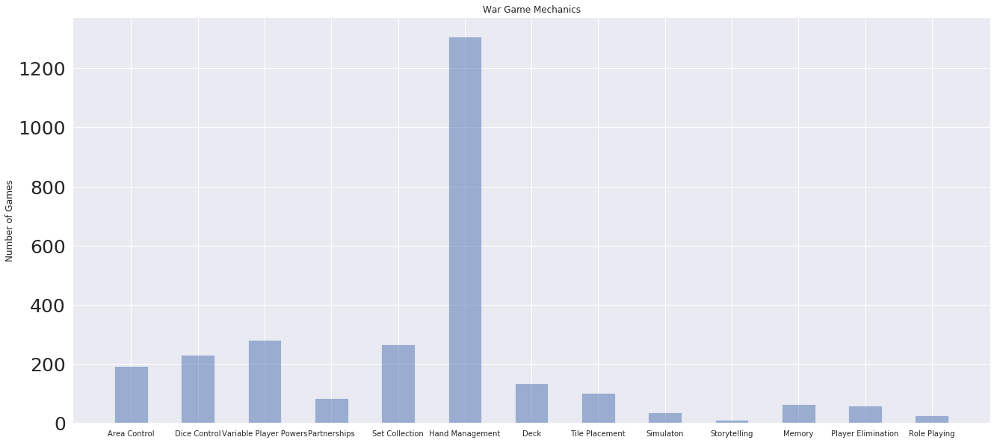

In [336]:
objects = ('Area Control', 'Dice Control', 'Variable Player Powers', 'Partnerships', 'Set Collection', 'Hand Management', 'Deck', 'Tile Placement', 'Simulaton', 'Storytelling', 'Memory', 'Player Elimination', 'Role Playing')
y_pos = np.arange(len(objects))
performance = [193,230,282,85,266,1308,135,103,36,11,64,60,25]
plt.figure(figsize=(22, 10))
plt.bar(y_pos, performance, align='center', width=.5, alpha=0.5)
plt.xticks(y_pos, objects)
plt.ylabel('Number of Games')
plt.title('War Game Mechanics')
plt.rc('xtick', labelsize=10) 
plt.rc('ytick', labelsize=25) 


plt.show()

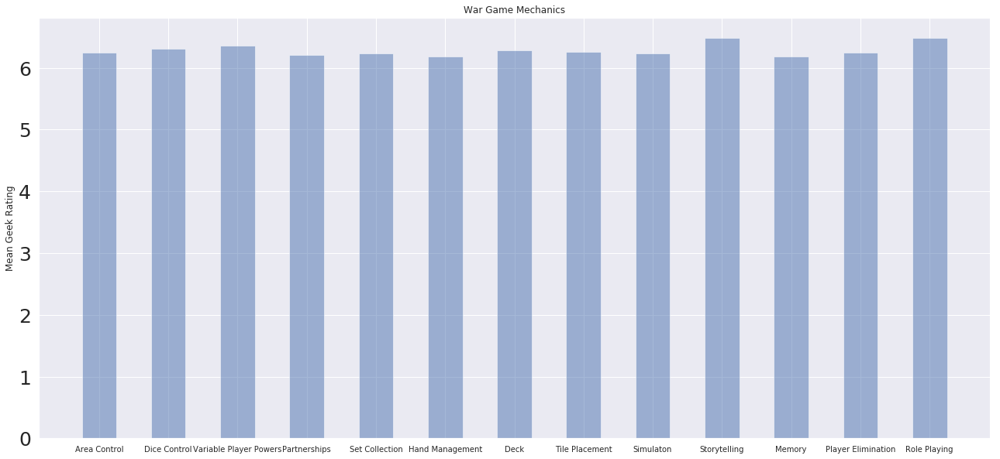

In [337]:
objects = ('Area Control', 'Dice Control', 'Variable Player Powers', 'Partnerships', 'Set Collection', 'Hand Management', 'Deck', 'Tile Placement', 'Simulaton', 'Storytelling', 'Memory', 'Player Elimination', 'Role Playing')
y_pos = np.arange(len(objects))
performance = [6.25,6.31,6.36,6.21,6.23,6.19,6.28,6.26,6.23,6.49,6.19,6.25,6.48]
plt.figure(figsize=(22, 10))
plt.bar(y_pos, performance, align='center', width=.5, alpha=0.5)
plt.xticks(y_pos, objects)
plt.ylabel('Mean Geek Rating')
plt.title('War Game Mechanics')
plt.rc('xtick', labelsize=10) 
plt.rc('ytick', labelsize=25) 


plt.show()

Based on this bar graph, there does not appear to be a single game mechanic that is particularly well-received in war games.

## Murder Mystery Games

In [338]:
Murder_Mystery = df.groupby('Murder/Mystery')
Murder_Mystery.get_group(1)
df.head()

,Rank,Game,Min Players,Max Players,Avg Time,Min Time,Max Time,Year,Avg Rating,Geek Rating,Num Votes,Age,Mechanic,Area Control,Dice Rolling,Variable Player Powers,Partnerships,Set Collection,Hand Management,Deck,Tile Placement,Simulation,Storytelling,Memory,Player Elimination,Role Playing,Press Your Luck,owned,category,Environmental,Medical,Card Game,Civilization,Economic,Fantasy,Puzzle,TV/Movie/Radio,War,Horror,Murder/Mystery,Party Game,Trivia,Racing,Territory Building,Adventure,Dice
0,1,Pandemic Legacy: Season 1,2,4,60,60,60,2015,8.66905,8.48904,18009,13,"Action Point Allowance System, Co-operative Pl...",False,False,True,False,True,True,False,False,False,False,False,False,False,0,29472,"Environmental, Medical",True,True,False,False,False,False,False,0,True,0,0,0,0,0,0,0,0
1,2,Through the Ages: A New Story of Civilization,2,4,240,180,240,2015,8.72977,8.30744,7309,14,"Action Point Allowance System, Auction/Bidding...",False,False,False,False,False,True,False,False,False,False,False,False,False,0,10007,"Card Game, Civilization, Economic",False,False,True,True,True,False,False,0,True,0,0,0,0,0,0,0,0
2,3,Twilight Struggle,2,2,180,180,180,2005,8.35745,8.22021,27403,13,"Area Control / Area Influence, Campaign / Batt...",True,True,False,False,False,True,False,False,False,False,False,False,False,0,37382,"Modern Warfare, Political, Wargame",False,False,False,False,False,False,False,0,True,0,0,0,0,0,0,0,0
3,4,Terra Mystica,2,5,150,60,150,2012,8.29627,8.15458,24267,12,"Route/Network Building, Variable Phase Order, ...",False,False,True,False,False,False,False,False,False,False,False,False,False,0,27948,"Civilization, Economic, Fantasy, Territory Bui...",False,False,False,True,True,True,False,0,False,0,0,0,0,0,1,0,0
4,5,Gloomhaven,1,4,150,90,150,2017,9.08970,8.15151,3978,12,"Action / Movement Programming, Campaign / Batt...",False,False,True,False,False,True,False,False,False,True,False,False,False,0,6057,"Adventure, Economic, Exploration, Fantasy, Fig...",False,False,False,False,True,True,False,0,True,0,0,0,0,0,0,1,0


In [339]:
Murder_Mystery.get_group(1).shape

(68, 46)

In [340]:
pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', None)
Murder_Mystery.mean()

,Rank,Min Players,Max Players,Avg Time,Min Time,Max Time,Year,Avg Rating,Geek Rating,Num Votes,Age,Area Control,Dice Rolling,Variable Player Powers,Partnerships,Set Collection,Hand Management,Deck,Tile Placement,Simulation,Storytelling,Memory,Player Elimination,Role Playing,Press Your Luck,owned,Environmental,Medical,Card Game,Civilization,Economic,Fantasy,Puzzle,TV/Movie/Radio,War,Horror,Party Game,Trivia,Racing,Territory Building,Adventure,Dice
Murder/Mystery,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
0,2505.381870,2.024336,5.211722,106.107280,87.751774,105.698641,1996.198945,6.932667,6.062206,1690.847090,10.277834,0.121679,0.275603,0.161022,0.055364,0.144190,0.262016,0.049483,0.106672,0.067329,0.011965,0.032448,0.030825,0.025553,0.0,2521.794971,0.007706,0.00365,0.268303,0.032853,0.107686,0.136889,0.017238,0.0,0.262016,0.030623,0.056175,0.0,0.031839,0.037112,0.057392,0.069763
1,2109.735294,2.779412,10.764706,65.691176,56.867647,65.691176,2006.338235,6.883552,6.204073,2227.735294,10.897059,0.029412,0.058824,0.323529,0.279412,0.058824,0.235294,0.029412,0.029412,0.000000,0.161765,0.191176,0.073529,0.205882,0.0,3561.926471,0.000000,0.00000,0.250000,0.000000,0.000000,0.088235,0.058824,0.0,0.235294,0.323529,0.294118,0.0,0.000000,0.000000,0.044118,0.000000


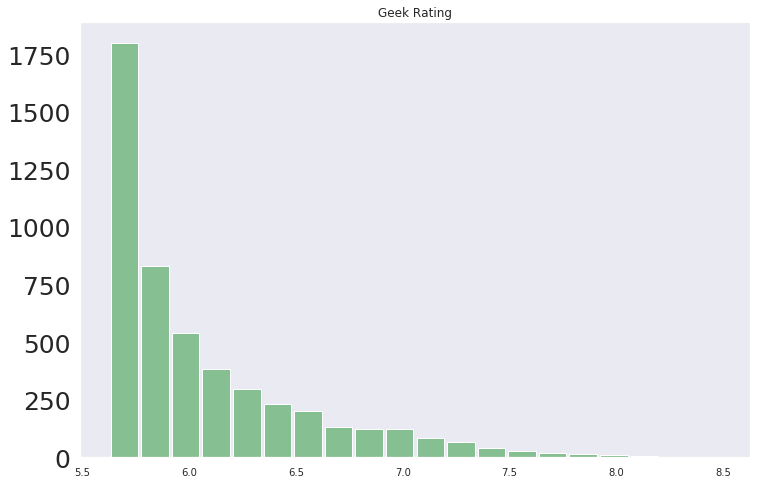

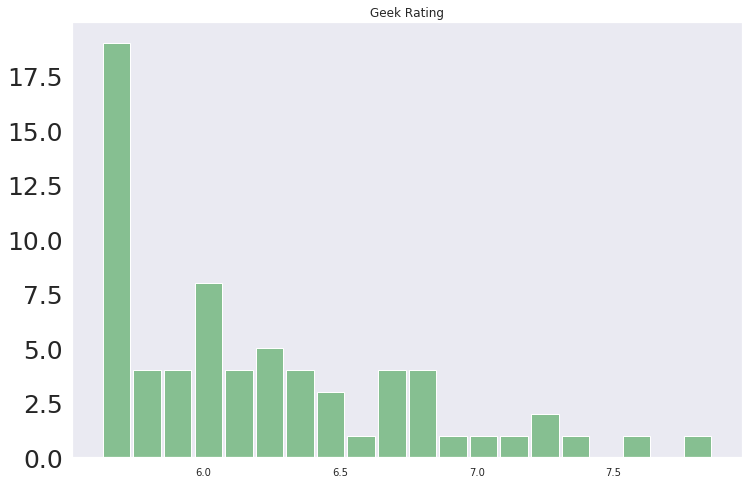

In [341]:
ax = Murder_Mystery.hist(column='Geek Rating', bins=20, grid=False, figsize=(12,8), color='#86bf91', zorder=2, rwidth=0.9)
plt.show()

The distribution of ratings for murder/mystery games appears to be pretty similar to the distribution of ratings for all games with a larger proportion of games that were rated above 6.5.

In [342]:
(df['Murder/Mystery'] == 1) & (df['Area Control'] == 1)

0       False
1       False
2       False
3       False
4       False
5       False
6       False
7       False
8       False
9       False
10      False
11      False
12      False
13      False
14      False
15      False
16      False
17      False
18      False
19      False
20      False
21      False
22      False
23      False
24      False
25      False
26      False
27      False
28      False
29      False
30      False
31      False
32      False
33      False
34      False
35      False
36      False
37      False
38      False
39      False
40      False
41      False
42      False
43      False
44      False
45      False
46      False
47      False
48      False
49      False
50      False
51      False
52      False
53      False
54      False
55      False
56      False
57      False
58      False
59      False
60      False
61      False
62      False
63      False
64      False
65      False
66      False
67      False
68      False
69      False
70      False
71    

In [343]:
df['Murder/Mystery'] = df['Murder/Mystery'].apply(bool)
df['Area Control'] = df['Area Control'].apply(bool)
df_sub = df.iloc[np.array(df['Murder/Mystery'] & df['Area Control'])]

In [344]:
(df['Murder/Mystery'] == 1) & (df['Dice Rolling'] == 1)

0       False
1       False
2       False
3       False
4       False
5       False
6       False
7       False
8       False
9       False
10      False
11      False
12      False
13      False
14      False
15      False
16      False
17      False
18      False
19       True
20      False
21      False
22      False
23      False
24      False
25      False
26      False
27      False
28      False
29      False
30      False
31      False
32      False
33      False
34      False
35      False
36      False
37      False
38      False
39      False
40      False
41      False
42      False
43      False
44      False
45      False
46      False
47      False
48      False
49      False
50      False
51      False
52      False
53      False
54      False
55      False
56      False
57      False
58      False
59      False
60      False
61      False
62      False
63      False
64      False
65      False
66      False
67      False
68      False
69      False
70      False
71    

In [345]:
df['Murder/Mystery'] = df['Murder/Mystery'].apply(bool)
df['Dice Rolling'] = df['Dice Rolling'].apply(bool)
df_sub = df.iloc[np.array(df['Murder/Mystery'] & df['Dice Rolling'])]

In [346]:
(df['Murder/Mystery'] == 1) & (df['Variable Player Powers'] == 1)

0       False
1       False
2       False
3       False
4       False
5       False
6       False
7       False
8       False
9       False
10      False
11      False
12      False
13      False
14      False
15      False
16      False
17      False
18      False
19       True
20      False
21      False
22      False
23      False
24      False
25      False
26      False
27      False
28      False
29      False
30      False
31      False
32      False
33      False
34      False
35      False
36      False
37      False
38      False
39      False
40      False
41      False
42      False
43      False
44      False
45      False
46      False
47      False
48      False
49      False
50      False
51      False
52      False
53      False
54      False
55      False
56      False
57      False
58      False
59      False
60      False
61      False
62      False
63      False
64      False
65      False
66      False
67      False
68      False
69      False
70      False
71    

In [347]:
df['Murder/Mystery'] = df['Murder/Mystery'].apply(bool)
df['Variable Player Powers'] = df['Variable Player Powers'].apply(bool)
df_sub = df.iloc[np.array(df['Murder/Mystery'] & df['Variable Player Powers'])]

In [348]:
df_sub.shape

(22, 46)

In [349]:
(df['Murder/Mystery'] == 1) & (df['Partnerships'] == 1)

0       False
1       False
2       False
3       False
4       False
5       False
6       False
7       False
8       False
9       False
10      False
11      False
12      False
13      False
14      False
15      False
16      False
17      False
18      False
19       True
20      False
21      False
22      False
23      False
24      False
25      False
26      False
27      False
28      False
29      False
30      False
31      False
32      False
33      False
34      False
35      False
36      False
37      False
38      False
39      False
40      False
41      False
42      False
43      False
44      False
45      False
46      False
47      False
48      False
49      False
50      False
51      False
52      False
53      False
54      False
55      False
56      False
57      False
58      False
59      False
60      False
61      False
62      False
63      False
64      False
65      False
66      False
67      False
68      False
69      False
70      False
71    

In [350]:
df['Murder/Mystery'] = df['Murder/Mystery'].apply(bool)
df['Partnerships'] = df['Partnerships'].apply(bool)
df_sub = df.iloc[np.array(df['Murder/Mystery'] & df['Partnerships'])]

In [351]:
df_sub.shape

(19, 46)

In [352]:
(df['Murder/Mystery'] == 1) & (df['Set Collection'] == 1)

0       False
1       False
2       False
3       False
4       False
5       False
6       False
7       False
8       False
9       False
10      False
11      False
12      False
13      False
14      False
15      False
16      False
17      False
18      False
19      False
20      False
21      False
22      False
23      False
24      False
25      False
26      False
27      False
28      False
29      False
30      False
31      False
32      False
33      False
34      False
35      False
36      False
37      False
38      False
39      False
40      False
41      False
42      False
43      False
44      False
45      False
46      False
47      False
48      False
49      False
50      False
51      False
52      False
53      False
54      False
55      False
56      False
57      False
58      False
59      False
60      False
61      False
62      False
63      False
64      False
65      False
66      False
67      False
68      False
69      False
70      False
71    

In [353]:
df['Murder/Mystery'] = df['Murder/Mystery'].apply(bool)
df['Set Collection'] = df['Set Collection'].apply(bool)
df_sub = df.iloc[np.array(df['Murder/Mystery'] & df['Set Collection'])]

In [354]:
(df['Murder/Mystery'] == 1) & (df['Hand Management'] == 1)

0       False
1       False
2       False
3       False
4       False
5       False
6       False
7       False
8       False
9       False
10      False
11      False
12      False
13      False
14      False
15      False
16      False
17      False
18      False
19       True
20      False
21      False
22      False
23      False
24      False
25      False
26      False
27      False
28      False
29      False
30      False
31      False
32      False
33      False
34      False
35      False
36      False
37      False
38      False
39      False
40      False
41      False
42      False
43      False
44      False
45      False
46      False
47      False
48      False
49      False
50      False
51      False
52      False
53      False
54      False
55      False
56      False
57      False
58      False
59      False
60      False
61      False
62      False
63      False
64      False
65      False
66      False
67      False
68      False
69      False
70      False
71    

In [355]:
df['Murder/Mystery'] = df['Murder/Mystery'].apply(bool)
df['Hand Management'] = df['Hand Management'].apply(bool)
df_sub = df.iloc[np.array(df['Murder/Mystery'] & df['Hand Management'])]

In [356]:
df_sub.shape

(16, 46)

In [357]:
(df['Murder/Mystery'] == 1) & (df['Deck'] == 1)

0       False
1       False
2       False
3       False
4       False
5       False
6       False
7       False
8       False
9       False
10      False
11      False
12      False
13      False
14      False
15      False
16      False
17      False
18      False
19      False
20      False
21      False
22      False
23      False
24      False
25      False
26      False
27      False
28      False
29      False
30      False
31      False
32      False
33      False
34      False
35      False
36      False
37      False
38      False
39      False
40      False
41      False
42      False
43      False
44      False
45      False
46      False
47      False
48      False
49      False
50      False
51      False
52      False
53      False
54      False
55      False
56      False
57      False
58      False
59      False
60      False
61      False
62      False
63      False
64      False
65      False
66      False
67      False
68      False
69      False
70      False
71    

In [358]:
df['Murder/Mystery'] = df['Murder/Mystery'].apply(bool)
df['Deck'] = df['Deck'].apply(bool)
df_sub = df.iloc[np.array(df['Murder/Mystery'] & df['Deck'])]

In [359]:
(df['Murder/Mystery'] == 1) & (df['Tile Placement'] == 1)

0       False
1       False
2       False
3       False
4       False
5       False
6       False
7       False
8       False
9       False
10      False
11      False
12      False
13      False
14      False
15      False
16      False
17      False
18      False
19      False
20      False
21      False
22      False
23      False
24      False
25      False
26      False
27      False
28      False
29      False
30      False
31      False
32      False
33      False
34      False
35      False
36      False
37      False
38      False
39      False
40      False
41      False
42      False
43      False
44      False
45      False
46      False
47      False
48      False
49      False
50      False
51      False
52      False
53      False
54      False
55      False
56      False
57      False
58      False
59      False
60      False
61      False
62      False
63      False
64      False
65      False
66      False
67      False
68      False
69      False
70      False
71    

In [360]:
df['Murder/Mystery'] = df['Murder/Mystery'].apply(bool)
df['Tile Placement'] = df['Tile Placement'].apply(bool)
df_sub = df.iloc[np.array(df['Murder/Mystery'] & df['Tile Placement'])]

In [361]:
(df['Murder/Mystery'] == 1) & (df['Simulation'] == 1)

0       False
1       False
2       False
3       False
4       False
5       False
6       False
7       False
8       False
9       False
10      False
11      False
12      False
13      False
14      False
15      False
16      False
17      False
18      False
19      False
20      False
21      False
22      False
23      False
24      False
25      False
26      False
27      False
28      False
29      False
30      False
31      False
32      False
33      False
34      False
35      False
36      False
37      False
38      False
39      False
40      False
41      False
42      False
43      False
44      False
45      False
46      False
47      False
48      False
49      False
50      False
51      False
52      False
53      False
54      False
55      False
56      False
57      False
58      False
59      False
60      False
61      False
62      False
63      False
64      False
65      False
66      False
67      False
68      False
69      False
70      False
71    

In [362]:
df['Murder/Mystery'] = df['Murder/Mystery'].apply(bool)
df['Simulation'] = df['Simulation'].apply(bool)
df_sub = df.iloc[np.array(df['Murder/Mystery'] & df['Simulation'])]

In [363]:
(df['Murder/Mystery'] == 1) & (df['Storytelling'] == 1)

0       False
1       False
2       False
3       False
4       False
5       False
6       False
7       False
8       False
9       False
10      False
11      False
12      False
13      False
14      False
15      False
16      False
17      False
18      False
19      False
20      False
21      False
22      False
23      False
24      False
25      False
26      False
27      False
28      False
29      False
30      False
31      False
32      False
33      False
34      False
35      False
36      False
37      False
38      False
39      False
40      False
41      False
42      False
43      False
44      False
45      False
46      False
47      False
48      False
49      False
50      False
51      False
52      False
53      False
54      False
55       True
56      False
57      False
58      False
59      False
60      False
61      False
62      False
63      False
64      False
65      False
66      False
67      False
68      False
69      False
70      False
71    

In [364]:
df['Murder/Mystery'] = df['Murder/Mystery'].apply(bool)
df['Storytelling'] = df['Storytelling'].apply(bool)
df_sub = df.iloc[np.array(df['Murder/Mystery'] & df['Storytelling'])]

In [365]:
df_sub.shape

(11, 46)

In [366]:
(df['Murder/Mystery'] == 1) & (df['Memory'] == 1)

0       False
1       False
2       False
3       False
4       False
5       False
6       False
7       False
8       False
9       False
10      False
11      False
12      False
13      False
14      False
15      False
16      False
17      False
18      False
19      False
20      False
21      False
22      False
23      False
24      False
25      False
26      False
27      False
28      False
29      False
30      False
31      False
32      False
33      False
34      False
35      False
36      False
37      False
38      False
39      False
40      False
41      False
42      False
43      False
44      False
45      False
46      False
47      False
48      False
49      False
50      False
51      False
52      False
53      False
54      False
55      False
56      False
57      False
58      False
59      False
60      False
61      False
62      False
63      False
64      False
65      False
66      False
67      False
68      False
69      False
70      False
71    

In [367]:
df['Murder/Mystery'] = df['Murder/Mystery'].apply(bool)
df['Memory'] = df['Memory'].apply(bool)
df_sub = df.iloc[np.array(df['Murder/Mystery'] & df['Memory'])]

In [368]:
df_sub.shape

(13, 46)

In [369]:
(df['Murder/Mystery'] == 1) & (df['Player Elimination'] == 1)

0       False
1       False
2       False
3       False
4       False
5       False
6       False
7       False
8       False
9       False
10      False
11      False
12      False
13      False
14      False
15      False
16      False
17      False
18      False
19      False
20      False
21      False
22      False
23      False
24      False
25      False
26      False
27      False
28      False
29      False
30      False
31      False
32      False
33      False
34      False
35      False
36      False
37      False
38      False
39      False
40      False
41      False
42      False
43      False
44      False
45      False
46      False
47      False
48      False
49      False
50      False
51      False
52      False
53      False
54      False
55      False
56      False
57      False
58      False
59      False
60      False
61      False
62      False
63      False
64      False
65      False
66      False
67      False
68      False
69      False
70      False
71    

In [370]:
df['Murder/Mystery'] = df['Murder/Mystery'].apply(bool)
df['Player Elimination'] = df['Player Elimination'].apply(bool)
df_sub = df.iloc[np.array(df['Murder/Mystery'] & df['Player Elimination'])]

In [371]:
df_sub.shape

(5, 46)

In [372]:
(df['Murder/Mystery'] == 1) & (df['Role Playing'] == 1)

0       False
1       False
2       False
3       False
4       False
5       False
6       False
7       False
8       False
9       False
10      False
11      False
12      False
13      False
14      False
15      False
16      False
17      False
18      False
19       True
20      False
21      False
22      False
23      False
24      False
25      False
26      False
27      False
28      False
29      False
30      False
31      False
32      False
33      False
34      False
35      False
36      False
37      False
38      False
39      False
40      False
41      False
42      False
43      False
44      False
45      False
46      False
47      False
48      False
49      False
50      False
51      False
52      False
53      False
54      False
55      False
56      False
57      False
58      False
59      False
60      False
61      False
62      False
63      False
64      False
65      False
66      False
67      False
68      False
69      False
70      False
71    

In [373]:
df['Murder/Mystery'] = df['Murder/Mystery'].apply(bool)
df['Role Playing'] = df['Role Playing'].apply(bool)
df_sub = df.iloc[np.array(df['Murder/Mystery'] & df['Role Playing'])]

In [374]:
df_sub.shape

(14, 46)

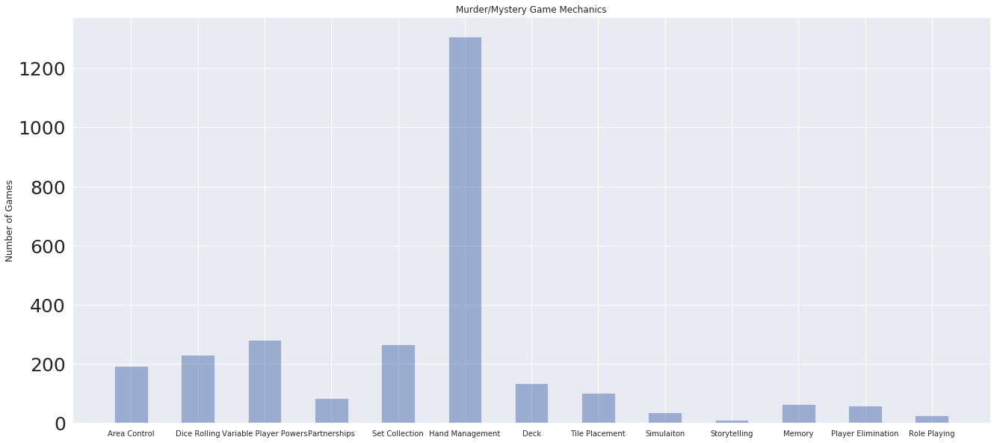

In [375]:
objects = ('Area Control', 'Dice Rolling', 'Variable Player Powers', 'Partnerships', 'Set Collection', 'Hand Management', 'Deck', 'Tile Placement', 'Simulaiton', 'Storytelling', 'Memory', 'Player Elimination', 'Role Playing')
y_pos = np.arange(len(objects))
performance = [193,230,282,85,266,1308,135,103,36,11,64,60,25]
plt.figure(figsize=(22, 10))
plt.bar(y_pos, performance, align='center', width=.5, alpha=0.5)
plt.xticks(y_pos, objects)
plt.ylabel('Number of Games')
plt.title('Murder/Mystery Game Mechanics')
plt.rc('xtick', labelsize=10) 
plt.rc('ytick', labelsize=25) 


plt.show()

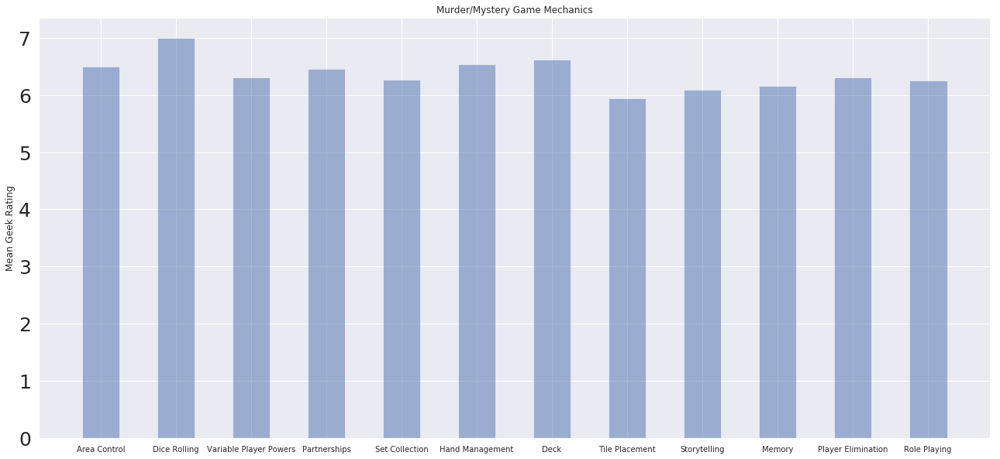

In [376]:
objects = ('Area Control', 'Dice Rolling', 'Variable Player Powers', 'Partnerships', 'Set Collection', 'Hand Management', 'Deck', 'Tile Placement', 'Storytelling', 'Memory', 'Player Elimination', 'Role Playing')
y_pos = np.arange(len(objects))
performance = [6.5,7,6.3,6.46,6.27,6.53,6.61,5.94,6.09,6.15,6.3,6.25]
plt.figure(figsize=(22, 10))
plt.bar(y_pos, performance, align='center', width=.5, alpha=0.5)
plt.xticks(y_pos, objects)
plt.ylabel('Mean Geek Rating')
plt.title('Murder/Mystery Game Mechanics')
plt.rc('xtick', labelsize=10) 
plt.rc('ytick', labelsize=25) 


plt.show()

Dice Rolling seems to be highly rated in murder/mystery games while tile placement is not so highly rated.

# Find a Game

### (df['X'] == 1) & (df['Y'] == 1) & (df['Z'] == 1)...

##### Copy and paste this into a code cell below and then fill in the blanks with the categories and mechanics (listed below) of your choice to find the game(s) that fit(s) your preferecnes!*

categories:
Environmental; Medical; Card Game; Civilization; Economic; Fantasy; Puzzle; TV/Movie/Radio; War; Horror; Murder/Mystery; Party Game; Trivia; Racing; Territory Building; Adventure; Dice

mechanics: Area Control; Dice Rolling; Variable Player Powers; Partnerships; Set Collection; Deck; Tile Placement; Simulation; Storytelling; Memory; Player Elimination; Role Playing; Press Your Luck

###### *If you'd like to search for games that do not contain a particular element, change the '==1' to '==0'

##### To get a dataframe of games that match your criteria, copy and paste the following code into another code cell:

### df['X'] = df['X'].apply(bool)
### df['Y'] = df['Y'].apply(bool)
### df_sub = df.iloc[np.array(df['X'] & df['Y'])]
### df_sub.head()



In [377]:
(df['Medical'] == 1) & (df['Card Game'] == 1) & (df['Civilization'] == 1)

0       False
1       False
2       False
3       False
4       False
5       False
6       False
7       False
8       False
9       False
10      False
11      False
12      False
13      False
14      False
15      False
16      False
17      False
18      False
19      False
20      False
21      False
22      False
23      False
24      False
25      False
26      False
27      False
28      False
29      False
30      False
31      False
32      False
33      False
34      False
35      False
36      False
37      False
38      False
39      False
40      False
41      False
42      False
43      False
44      False
45      False
46      False
47      False
48      False
49      False
50      False
51      False
52      False
53      False
54      False
55      False
56      False
57      False
58      False
59      False
60      False
61      False
62      False
63      False
64      False
65      False
66      False
67      False
68      False
69      False
70      False
71    

In [378]:
df['Medical'] = df['Medical'].apply(bool)
df['Card Game'] = df['Card Game'].apply(bool)
df['Civilization'] = df['Civilization'].apply(bool)
df_sub = df.iloc[np.array(df['Medical'] & df['Card Game'] & df['Civilization'])]
df_sub.head()

,Rank,Game,Min Players,Max Players,Avg Time,Min Time,Max Time,Year,Avg Rating,Geek Rating,Num Votes,Age,Mechanic,Area Control,Dice Rolling,Variable Player Powers,Partnerships,Set Collection,Hand Management,Deck,Tile Placement,Simulation,Storytelling,Memory,Player Elimination,Role Playing,Press Your Luck,owned,category,Environmental,Medical,Card Game,Civilization,Economic,Fantasy,Puzzle,TV/Movie/Radio,War,Horror,Murder/Mystery,Party Game,Trivia,Racing,Territory Building,Adventure,Dice


# Conclusion

In the first half of this notebook by correlating game features such as # of players, playtime,age of target player, and release year against geek ratings (determined by boardgamegeek.com). The correlations between age of the target player and geek score and release year and geek rating appear to be positive. We also visualize the distribution of geek ratings among all of the games included in the dataset (a majority of games are rated below 6) and the average geek rating of each category of game. We also found a positive correlation between the number of people who own a game and the game's rating. In addition, we observed that most games have a minimum of 1-3 players, can be played within an hour, and that the highest rated games tend to be those intended for 12-15 year-olds. When we investigated individual categories, we found that there is a larger proportion of environmental games that received high geek ratings.

In the second half of this notebook, we further analyze eight game categories (environmental, medical, card, fantasy, economic, puzzle, war, and murder/mystery) by visualizing the most frequent and highest rated game mechanics for each category.

One major limitation of this visualization is that games are primarily anazlyed categorically rather than individually. As a result, the mean geek ratings are likely pulled toward the middle. Furthermore, we do not analyze the interactions between categories and between mechanics (most games fall into more than one category and incorporate more than one mechanic. Therefore, it is difficult to determine which mechanic is the most influential to a game’s geek rating.

# Contributing

Those who contribute to this notebook might want to analyze game categories (e.g. party games and racing games) that were not analyzed in this notebook. They might also analyze games on an individual basis rather than on a categorical basis. 

Additionally, those who contribute to this notebook should consider analyzing the interactions between various categories and various mechanics.